## Feature Extraction Strategies
* This file explores different biologically based feature extraction methods

In [1]:
import os, sys
import numpy as np
import json
import random
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

## Preliminary

In [2]:
torch.manual_seed(12345)
k = 10000
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
na_list = ['A', 'C', 'G', 'T'] #nucleic acids
aa_list = ['R', 'L', 'S', 'A', 'G', 'P', 'T', 'V', 'N', 'D', 'C', 'Q', 'E', 'H', 'I', 'K', 'M', 'F', 'W', 'Y'] #amino acids
NNK_freq = [0.09375]*3 + [0.0625]*5 + [0.03125]*13 #freq of 21 NNK codons including the stop codon
sum_20 = 0.0625*5 + 0.09375*3 + 0.03125*12 #sum of freq without the stop codon
pvals = [0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*12 #normalize freq for 20 codons
pvals = [0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*11 + \
        [1- sum([0.09375/sum_20]*3 + [0.0625/sum_20]*5 + [0.03125/sum_20]*11)] 
        #adjust sum to 1 due to numerical issue
aa_dict = dict(zip(aa_list, pvals))

In [3]:
# Biological features
# kd hydrophobicity scale
hydrophobicity = {'G': -0.4, 'A': 1.8, 'L':3.8, 'M': 1.9, 'F':2.8, 'W':-0.9, 'K':-3.9, 'Q':-3.5, 'E':-3.5, 'S':-0.8, 'P':-1.6, 'V':4.2, 'I':4.5, 'C':2.5, 'Y':-1.3, 'H':-3.2, 'R':-4.5, 'N':-3.5, 'D':-3.5, 'T':-0.7}
# Ranked
polarity = {'A': 0.45, 'R': 0.75, 'N': 0.8, 'D': 0.95, 'C':0.35, 'Q': 0.85, 'E': 0.90, 'G': 0.55, 'H': 0.5, 'I': 0.05, 'L': 0.15, 'K': 1, 'M': 0.25, 'F': 0.1, 'P': 0.65, 'S': 0.7, 'T': 0.6, 'W': 0.3, 'Y': 0.4, 'V': 0.2}
# Van der waal's volume
volume = {'A': 67, 'R': 148, 'N': 96, 'D': 91, 'C':86, 'Q': 114, 'E': 109, 'G': 48, 'H': 118, 'I': 124, 'L': 124, 'K': 135, 'M': 124, 'F': 135, 'P': 90, 'S': 73, 'T': 93, 'W':163, 'Y':141, 'V': 105}

# TODO: branched, hydrophilic, hydrophobic, shape
charge = {'A': 2, 'R': 3, 'N': 2, 'D': 1, 'C': 2, 'E':1, 'Q':2, 'G':2, 'H': 3, 'I':2, 'L': 2, 'K': 3, 'M':2, 'F':2, 'P':2, 'S':2, 'T': 2, 'W':2, 'Y': 2, 'V':2 }

# Normalize all of the biological features:
# Charge
for k,v in charge.items():
    if v == 1:
        charge[k] = 0
    elif v == 2:
        charge[k] = 0.5
    else:
        charge[k] = 1.0

# Volume
for k,v in volume.items():
    volume[k] = v/163.0

#Polarity
min_v = -4.5
max_v = 4.5
for k,v in hydrophobicity.items():
    hydrophobicity[k] = (v - min_v)/(max_v - min_v)    

In [4]:
# Experiment with the blosum62 matrix
blosum62 = {}
with open('blosum62.txt', 'r') as f:
    for line in f:
        split_line = line.strip().split()
        aa = split_line[0]
        encoding = [int(x) for x in split_line[1:-3]]
        blosum62[aa] = encoding

## Dataset

In [5]:
class BinaryDataset(Dataset):
    def __init__(self, filepath):
        def construct_binary_dataset(filepath):
            with open(filepath, 'r') as f:
                aptamer_data = json.load(f)
            ds = []
            for aptamer in aptamer_data:
                peptides = aptamer_data[aptamer]
                for peptide in peptides:
                    ds.append((aptamer, peptide, 1))
                    ds.append((get_x(), get_y(), 0))
            ds = list(set(ds)) #removed duplicates, random order
            return ds

        # Sample x from P_X (assume apatamers follow uniform)
        def get_x():
            x_idx = np.random.randint(0, 4, 40)
            x = ""
            for i in x_idx:
                x += na_list[i]
            return x

        # Sample y from P_y (assume peptides follow NNK)
        def get_y():
            y_idx = np.random.choice(20, 7, p=pvals)
            y = "M"
            for i in y_idx:
                y += aa_list[i]
            return y

        self.binary_ds=construct_binary_dataset(filepath)

    def __len__(self):
        return len(self.binary_ds)

    def __getitem__(self,idx):
        return(self.binary_ds[idx])

In [6]:
class GeneratedDataset(Dataset):
    def __init__(self, n):
        def construct_generated_dataset(k):
            S_new = []
            for _, i in enumerate(tqdm.tqdm(range(k))):
                pair = (get_x(), get_y())
                S_new.append(pair)
            np.random.shuffle(S_new)
            return S_new
        
        # Sample x from P_X (assume apatamers follow uniform)
        def get_x():
            x_idx = np.random.randint(0, 4, 40)
            x = ""
            for i in x_idx:
                x += na_list[i]
            return x

        # Sample y from P_y (assume peptides follow NNK)
        def get_y():
            y_idx = np.random.choice(20, 7, p=pvals)
            y = "M"
            for i in y_idx:
                y += aa_list[i]
            return y
        self.gen_ds = construct_generated_dataset(n)
    def __len__(self):
        return len(self.gen_ds)
    
    def __getitem__(self, idx):
        return (self.gen_ds[idx])

In [7]:
binary_ds=BinaryDataset(filepath="../data/aptamer_dataset.json")
n = len(binary_ds)
m = int(0.8*n) #length of train
binary_train = binary_ds[:m]
binary_val = binary_ds[m:]

## NN Model

In [8]:
# Expects aptamer directly translated
# Expects peptides with 4 biological features (hydrophobicity, polarity, volume, charge)
class BioNet(nn.Module):
    def __init__(self):
        super(BioNet, self).__init__()
        self.name = "BioNet"
        self.single_alphabet = False
        
        self.cnn_apt_1 = nn.Conv1d(1, 25, 2, padding=2) 
        self.cnn_apt_2 = nn.Conv1d(25, 15, 2, padding=2) 
        self.cnn_apt_3 = nn.Conv1d(15, 10, 2, padding=2) 
        self.cnn_apt_4 = nn.Conv1d(10, 5, 1) 
        
        self.cnn_pep_1 = nn.Conv1d(4, 15, 3, padding=2)
        self.cnn_pep_2 = nn.Conv1d(15, 5, 1, padding=2)

        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(2) 
        
        self.cnn_apt = nn.Sequential(self.cnn_apt_1, self.maxpool, self.relu, 
                                     self.cnn_apt_2, self.maxpool, self.relu,
                                     self.cnn_apt_3, self.maxpool, self.relu,
                                     self.cnn_apt_4, self.maxpool, self.relu)
        self.cnn_pep = nn.Sequential(self.cnn_pep_1, self.maxpool, self.relu,
                                     self.cnn_pep_2, self.maxpool, self.relu)
        
        self.fc1 = nn.Linear(35, 20)
        self.fc2 = nn.Linear(20, 1)
    
    def forward(self, apt, pep):
        apt = self.cnn_apt(apt)
        pep = self.cnn_pep(pep)
        
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = torch.sigmoid(x)
        return x

# Expects aptamers directly translated
# Expects peptides directly translated + 4 biological features (hydrophobicity, polarity, volume, charge)
class TranslateBioNet(nn.Module):
    def __init__(self):
        super(TranslateBioNet, self).__init__()
        self.name = "TranslateBioNet"
        self.single_alphabet = False
        
        self.cnn_apt_1 = nn.Conv1d(1, 25, 2, padding=2) 
        self.cnn_apt_2 = nn.Conv1d(25, 15, 2, padding=2) 
        self.cnn_apt_3 = nn.Conv1d(15, 10, 2, padding=2) 
        self.cnn_apt_4 = nn.Conv1d(10, 5, 1) 
        
        self.cnn_pep_1 = nn.Conv1d(5, 30, 3, padding=2)
        self.cnn_pep_2 = nn.Conv1d(30, 75, 3, padding=2)
        self.cnn_pep_3 = nn.Conv1d(75, 150, 3, padding=2)
        self.cnn_pep_4 = nn.Conv1d(150, 250, 3, padding=2)
        self.cnn_pep_5 = nn.Conv1d(250, 100, 3, padding=2)
        self.cnn_pep_6 = nn.Conv1d(100, 50, 3, padding=2)

        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(2) 
        
        self.cnn_apt = nn.Sequential(self.cnn_apt_1, self.maxpool, self.relu, 
                                     self.cnn_apt_2, self.maxpool, self.relu,
                                     self.cnn_apt_3, self.maxpool, self.relu,
                                     self.cnn_apt_4, self.maxpool, self.relu)
        self.cnn_pep = nn.Sequential(self.cnn_pep_1, self.maxpool, self.relu,
                                     self.cnn_pep_2, self.maxpool, self.relu,
                                     self.cnn_pep_3, self.maxpool, self.relu,
                                     self.cnn_pep_4, self.maxpool, self.relu,
                                     self.cnn_pep_5, self.maxpool, self.relu,
                                     self.cnn_pep_6, self.maxpool, self.relu)
        
        self.fc1 = nn.Linear(115, 50)
        self.fc2 = nn.Linear(50, 1)
    
    def forward(self, apt, pep):
        apt = self.cnn_apt(apt)
        pep = self.cnn_pep(pep)
        
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = torch.sigmoid(x)
        return x

# Expects aptamers directly translated
# Expects 4 biological features (hydrophobicity, polarity, volume, charge)
class ComplexBioNet(nn.Module):
    def __init__(self):
        super(ComplexBioNet, self).__init__()
        self.name = "ComplexBioNet"
        self.single_alphabet = False
        
        self.cnn_apt_1 = nn.Conv1d(1, 25, 3, padding=2) 
        self.cnn_apt_2 = nn.Conv1d(25, 15, 3, padding=2) 
        self.cnn_apt_3 = nn.Conv1d(15, 10, 3, padding=2) 
        self.cnn_apt_4 = nn.Conv1d(10, 5, 1) 
        
        self.cnn_pep_1 = nn.Conv1d(4, 15, 3, padding=2)
        self.cnn_pep_2 = nn.Conv1d(15, 5, 1, padding=2)
        
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(2) 
        
        self.cnn_apt = nn.Sequential(self.cnn_apt_1, self.maxpool, self.relu, 
                                     self.cnn_apt_2, self.maxpool, self.relu,
                                     self.cnn_apt_3, self.maxpool, self.relu,
                                     self.cnn_apt_4, self.maxpool, self.relu)
        self.cnn_pep = nn.Sequential(self.cnn_pep_1, self.maxpool, self.relu,
                                     self.cnn_pep_2, self.maxpool, self.relu)
        
        self.fc1 = nn.Linear(35, 15)
        self.fc2 = nn.Linear(15, 1)
    
    def forward(self, apt, pep):
        apt = self.cnn_apt(apt)
        pep = self.cnn_pep(pep)
        
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = torch.sigmoid(x)
        return x



In [9]:
# Expects aptamer one-hot encoded
# Expects peptides with 4 biological features (hydrophobicity, polarity, volume, charge)
class OHBioNet(nn.Module):
    def __init__(self):
        super(OHBioNet, self).__init__()
        self.name = "OHBioNet"
        self.single_alphabet = False
        
        self.cnn_apt_1 = nn.Conv1d(4, 25, 2, padding=2) 
        self.cnn_apt_2 = nn.Conv1d(25, 50, 2, padding=2) 
        self.cnn_apt_3 = nn.Conv1d(50, 30, 2, padding=2) 
        self.cnn_apt_4 = nn.Conv1d(30, 10, 1) 
        
        self.cnn_pep_1 = nn.Conv1d(4, 15, 3, padding=2)
        self.cnn_pep_2 = nn.Conv1d(15, 5, 1, padding=2)

        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(2) 
        
        self.cnn_apt = nn.Sequential(self.cnn_apt_1, self.maxpool, self.relu, 
                                     self.cnn_apt_2, self.maxpool, self.relu,
                                     self.cnn_apt_3, self.maxpool, self.relu,
                                     self.cnn_apt_4, self.maxpool, self.relu)
        self.cnn_pep = nn.Sequential(self.cnn_pep_1, self.maxpool, self.relu,
                                     self.cnn_pep_2, self.maxpool, self.relu)
        
        self.fc1 = nn.Linear(50, 25)
        self.fc2 = nn.Linear(25, 1)
    
    def forward(self, apt, pep):
        apt = self.cnn_apt(apt)
        pep = self.cnn_pep(pep)
        
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = torch.sigmoid(x)
        return x

In [10]:
# Expects aptamers directly translated
# Expects 4 biological features (hydrophobicity, polarity, volume, charge)
class LinearBioNet(nn.Module):
    def __init__(self):
        super(LinearBioNet, self).__init__()
        self.name = "LinearBioNet"
        self.single_alphabet = False
        
        self.cnn_apt_1 = nn.Conv1d(1, 20, 3, padding=2) 
        self.cnn_apt_2 = nn.Conv1d(20, 10, 3, padding=2) 
        
        self.cnn_pep_1 = nn.Conv1d(4, 10, 3, padding=2)
        self.cnn_pep_2 = nn.Conv1d(10, 7, 3, padding=2)
        
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(2) 
        
        self.cnn_apt = nn.Sequential(self.cnn_apt_1, self.maxpool, self.relu, 
                                     self.cnn_apt_2, self.maxpool, self.relu)
        self.cnn_pep = nn.Sequential(self.cnn_pep_1, self.maxpool, self.relu,
                                     self.cnn_pep_2, self.maxpool, self.relu)
        
        self.fc1 = nn.Linear(131, 100)
        self.fc2 = nn.Linear(100, 75)
        self.fc3 = nn.Linear(75, 1)
    
    def forward(self, apt, pep):
        apt = self.cnn_apt(apt)
        pep = self.cnn_pep(pep)
        
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = torch.sigmoid(x)
        return x

In [11]:
# Expects peptides to be encoding according to BLOSUM62 matrix
# Expects aptamers to be directly translated
class BlosumNet(nn.Module):
    def __init__(self):
        super(BlosumNet, self).__init__()
        self.name = "BlosumNet"
        self.single_alphabet = False
        
        self.cnn_apt_1 = nn.Conv1d(1, 25, 2, padding=2) 
        self.cnn_apt_2 = nn.Conv1d(25, 15, 2, padding=2) 
        self.cnn_apt_3 = nn.Conv1d(15, 10, 2, padding=2) 
        self.cnn_apt_4 = nn.Conv1d(10, 5, 1) 
        
        # There are 20 channels
        self.cnn_pep_1 = nn.Conv1d(20, 40, 3, padding=2)
        self.cnn_pep_2 = nn.Conv1d(40, 10, 3, padding=2)
        
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool1d(2) 
        
        self.cnn_apt = nn.Sequential(self.cnn_apt_1, self.maxpool, self.relu, 
                                     self.cnn_apt_2, self.maxpool, self.relu)
        self.cnn_pep = nn.Sequential(self.cnn_pep_1, self.maxpool, self.relu,
                                     self.cnn_pep_2, self.maxpool, self.relu)
        
        self.fc1 = nn.Linear(210, 100)
        self.fc2 = nn.Linear(100, 75)
        self.fc3 = nn.Linear(75, 1)
    
    def forward(self, apt, pep):
        apt = self.cnn_apt(apt)
        pep = self.cnn_pep(pep)
        
        apt = apt.view(-1, 1).T
        pep = pep.view(-1, 1).T
        x = torch.cat((apt, pep), 1)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = torch.sigmoid(x)
        return x

In [12]:
def weights_init(m):
    if isinstance(m, nn.Conv1d):
        nn.init.xavier_uniform_(m.weight.data, gain=nn.init.calculate_gain('relu'))
        nn.init.zeros_(m.bias.data)
    if isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight.data, nonlinearity='sigmoid')
        nn.init.zeros_(m.bias.data)

## Helper methods

In [13]:
## Takes a peptide and aptamer sequence and converts to one-hot matrix
def one_hot(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        apt = sequence[0]
        pep = sequence[1]
        one_hot = np.zeros((len(apt) + len(pep), 24))
        # Encode the aptamer first
        for i in range(len(apt)):
            char = apt[i]
            for _ in range(len(na_list)):
                idx = na_list.index(char)
                one_hot[i][idx] = 1
            
        # Encode the peptide second
        for i in range(len(pep)):
            char = pep[i]
            for _ in range(len(aa_list)):
                idx = aa_list.index(char) + len(na_list)
                one_hot[i+len(apt)][idx] = 1
        
        return one_hot       
    else:
        if seq_type == 'peptide':
            letters = aa_list
        else:
            letters = na_list
        one_hot = np.zeros((len(sequence), len(letters)))
        for i in range(len(sequence)):
            char = sequence[i]
            for _ in range(len(letters)):
                idx = letters.index(char)
                one_hot[i][idx] = 1
        return one_hot
    
## For aptamer sequence, translate
## For peptide sequence, translate and add additional biological properties
def extract_features(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        pass
    else:
        if seq_type == 'peptide':
            letters = aa_list
            encoding = np.zeros((4, len(sequence)))
            for i in range(len(sequence)):
                char = sequence[i]
                
                idx = letters.index(char)
                char_hydro = hydrophobicity[char]
                char_polar = polarity[char]
                char_vol = volume[char]
                char_charge = charge[char]
                
                # Put in the biological features of the amino acids
                encoding[0][i] = char_polar
                encoding[1][i] = char_vol
                encoding[2][i] = char_charge
                encoding[3][i] = char_hydro
        else:
            letters = na_list
            encoding = np.zeros(len(sequence))
            for i in range(len(sequence)):
                char = sequence[i]
                idx = letters.index(char)
                encoding[i] = idx
        return encoding 

def blosum62_encoding(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        pass
    else:
        if seq_type == 'peptide':
            encoding = []
            for i in range(len(sequence)):
                encoding.append(blosum62[sequence[i]])
            encoding = np.asarray(encoding)
        else:
            letters = na_list
            encoding = np.zeros(len(sequence))
            for i in range(len(sequence)):
                char = sequence[i]
                idx = letters.index(char)
                encoding[i] = idx
        return encoding 

## Takes a peptide and aptamer sequence and converts to directly translated sequence
def translate(sequence, seq_type='peptide', single_alphabet=False):
    if single_alphabet:
        apt = sequence[0]
        pep = sequence[1]
        
        encoding = np.zeros(len(apt) + len(pep))
        
        # Encode the aptamer first
        for i in range(len(apt)):
            char = apt[i]
            idx = na_list.index(char)
            encoding[i] = idx
            
        # Encode the peptide second
        for i in range(len(pep)):
            char = pep[i]
            idx = aa_list.index(char)
            encoding[i+len(apt)] = idx
        return encoding     
    else:
        if seq_type == 'peptide':
            letters = aa_list
        else:
            letters = na_list
        
        encoding = np.zeros(len(sequence))
        for i in range(len(sequence)):
            char = sequence[i]
            idx = letters.index(char)
            encoding[i] = idx
        return encoding

# Convert a pair to one-hot tensor
def convert(apt, pep, label, single_alphabet=False): 
    if single_alphabet:
        pair = translate([apt, pep], single_alphabet=True) #(2, 40)
        pair = torch.FloatTensor(np.reshape(pair, (-1, pair.shape[0], pair.shape[1]))).to(device)
        label = torch.FloatTensor([[label]]).to(device)
        return pair, label
    else:
        apt = one_hot(apt, seq_type='aptamer') 
        pep = extract_features(pep, seq_type='peptide') 
        apt = torch.FloatTensor(np.reshape(apt, (-1, apt.shape[1], apt.shape[0]))).to(device) #(1, 1, 40)
        pep = torch.FloatTensor(np.reshape(pep, (-1, pep.shape[0], pep.shape[1]))).to(device) #(1, 1, 8)
        
        label = torch.FloatTensor([[label]]).to(device)
        return apt, pep, label

# Getting the output of the model for a pair (aptamer, peptide)
def update(x, y, p, single_alphabet=False):
    if single_alphabet:
        p.requires_grad=True
        p = p.to(device)
        out = model(p)
        return out
    else:
        x.requires_grad=True
        y.requires_grad=True
        x = x.to(device)
        y = y.to(device)
        out = model(x, y)
        return out

## Plotting functions
def plot_loss(iters, train_losses, val_losses, model_name, model_id):
    plt.title("Loss Curve")
    plt.plot(train_losses, label="Train")
    plt.plot(val_losses, label="Validation")
    plt.xlabel("%d Iterations" %iters)
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.savefig('plots/binary/%s/%s/loss.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_accuracy(iters, train_acc, val_acc, model_name, model_id):
    plt.title("Training Accuracy Curve")
    plt.plot(train_acc, label="Train")
    plt.plot(val_acc, label="Validation")
    plt.xlabel("%d Iterations" %iters)
    plt.ylabel("Accuracy")
    plt.legend(loc='best')
    plt.savefig('plots/binary/%s/%s/accuracy.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_histogram(train_gen_scores, train_scores, val_gen_scores, val_scores, model_name, model_id):
    fig, ax = plt.subplots()
    plt.xlim(0, 1.1)
    
    sns.distplot(train_gen_scores , color="skyblue", label='Generated Train Samples', ax=ax)
    sns.distplot(val_gen_scores, color='dodgerblue', label='Generated Validation Samples')
    sns.distplot(train_scores , color="lightcoral", label='Dataset Train Samples', ax=ax)
    sns.distplot(val_scores, color='red', label='Dataset Validation Samples', ax=ax)
    
    ax.set_title("Categorizing the output scores of the model")
    ax.figure.set_size_inches(7, 4)
    ax.legend()
    plt.savefig('plots/binary/%s/%s/histogram.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_ecdf_test(test_score, iters, epoch, gamma, model_name, model_id):
    test_idx = np.argsort(test_score)
    test_id = test_idx >= 10000
    test = np.sort(test_score)
    test_c = ""
    for m in test_id:
        if m:
            test_c += "y"
        else:
            test_c += "g"
    n = test_score.size
    y = np.arange(1, n+1) / n
    plt.scatter(y, test, c=test_c, label='Test CDF')
    plt.ylabel("CDF")
    plt.xlabel("Most recent 10,000 samples after training %d samples" %iters)
    plt.title('Test CDF at epoch %d' %epoch + ", Gamma:%.5f" %gamma)
    plt.legend()
    plt.savefig('plots/binary/%s/%s/test_cdf.png' %(model_name, model_id), bbox_inches='tight')
    plt.show()

def plot_ecdf_train(train_score, iters, epoch, gamma, model_name, model_id):
    train_idx = np.argsort(train_score)
    train_id = train_idx >= 10000
    train = np.sort(train_score)
    train_c = "" #colors
    for l in train_id:
        if l:
            train_c += "r"
        else:
            train_c += "b"
    n = train_score.size
    y = np.arange(1, n+1) / n
    plt.scatter(y, train, c=train_c, label='Train CDF')
    plt.ylabel("CDF")
    plt.xlabel("Most recent 10,000 samples after training %d samples" % iters)
    plt.title('Train CDF at epoch %d' %epoch+ ", Gamma:%.5f" %gamma)
    plt.legend()
    plt.savefig('plots/binary/%s/%s/train_cdf.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()

def auc_cdf(train, new, model_name, model_id, val=False): 
    #train is the sorted list of outputs from the model with training pairs as inputs
    #new is the list of outputs from the model with generated pairs as inputs
    a = train + new
    n = len(a)
    m = len(train)
    train = np.asarray(train)
    new = np.asarray(new)
    y = np.arange(0, m+2)/m
    gamma = [0]
    for x in train:
        gamma.append(sum(a<=x)/n)
    gamma.append(1)
    plt.plot(gamma, y)
    if val:
        plt.title("Validation CDF")
    else:
        plt.title("Train CDF")
    plt.xlim([0,1])
    if val:
        plt.savefig('plots/binary/%s/%s/val_cdf.png' % (model_name, model_id), bbox_inches='tight')
    else:
        plt.savefig('plots/binary/%s/%s/train_cdf.png' % (model_name, model_id), bbox_inches='tight')
    plt.show()
    plt.close()
    return np.trapz(y, gamma)

## Binary Classification

In [14]:
if device == torch.cuda:
    torch.cuda.empty_cache()

In [15]:
def classifier(model, 
               train, 
               val,
               lr,
               model_id,
               num_epochs=50,
               batch_size=16,
               single_alphabet=False,
               run_from_checkpoint=None, 
               save_checkpoints=None,
               cdf=False):
    
    if run_from_checkpoint is not None:
        checkpointed_model = run_from_checkpoint
        checkpoint = torch.load(checkpointed_model)
        optimizer = SGD(model.parameters(), lr=lr)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        init_epoch = checkpoint['epoch'] +1
        print("Reloading model: ", model.name, " at epoch: ", init_epoch)
    else:
        model.apply(weights_init)
        optimizer = SGD(model.parameters(), lr=lr)
        init_epoch = 0
    
    train_losses, val_losses, train_losses_avg, val_losses_avg, train_acc, val_acc = [], [], [], [], [], []
    
    iters, train_correct, val_correct = 0, 0, 0
    criterion = nn.BCELoss()
    scheduler = StepLR(optimizer, step_size=5, gamma=0.9) #Decays lr by gamma factor every step_size epochs. 
    
    # Keep track of the scores across four classes
    train_scores, train_gen_scores, val_scores, val_gen_scores = [], [], [], []
    # Used for the CDF (generated pair outputs)
    gen_outputs = []
    
    for epoch in range(num_epochs):
        total_train_loss = 0
        total_val_loss = 0
        full_epoch = epoch + init_epoch
        print("Starting epoch: %d" % full_epoch, " with learning rate: ", scheduler.get_lr())
        for i, (apt, pep, label) in enumerate(tqdm.tqdm(train)):
            model_name = model.name
            model.train()
            if single_alphabet:
                p, l = convert(apt, pep, label, single_alphabet=True)
                train_score = update(None, None, p, single_alphabet=True)
            else:
                a, p, l = convert(apt, pep, label, single_alphabet=False)
                train_score = update(a, p, None, single_alphabet=False)
                
            if (train_score.item() >= 0.5 and label == 1.0) or (train_score.item() <= 0.5 and label == 0.0):
                train_correct += 1
            
            if label == 0.0:
                train_gen_scores.append(train_score.item())
            elif label == 1.0:
                train_scores.append(train_score.item())
                
            iters += 1
            train_loss = criterion(train_score, l) 
            total_train_loss += train_loss
            
            if iters % batch_size == 0:
                ave_train_loss = total_train_loss/batch_size
                train_losses.append(ave_train_loss.item())
                optimizer.zero_grad()
                ave_train_loss.backward()
                optimizer.step()
                total_train_loss = 0

            if iters % 5000 == 0:
                train_acc.append(100*train_correct/iters)
                train_losses_avg.append(np.average(train_losses[-5000:]))

            with torch.no_grad():
                model.eval()
            
            if single_alphabet:
                p_val, l_val = convert(val[iters%(n-m)][0], val[iters%(n-m)][1], val[iters%(n-m)][2], single_alphabet=True)
                val_score = model(p_val)
            else:
                a_val, p_val, l_val = convert(val[iters%(n-m)][0], val[iters%(n-m)][1], val[iters%(n-m)][2])
                val_score = model(a_val, p_val)
            if (val_score.item() >= 0.5 and val[iters%(n-m)][2] == 1.0) or (val_score.item() <= 0.5 and val[iters%(n-m)][2] == 0.0):
                val_correct += 1
            
            if l_val.item() == 1.0:
                val_scores.append(val_score.item())
            if l_val.item() == 0.0:
                val_gen_scores.append(val_score.item())
            
            if cdf:
                #generate 10 unseen examples from S_new as compared 1 example from S_train/S_test for cdfs
                for x, y in S_new[10*i:10*(i+1)]:
                    if single_alphabet:
                        pass
                    else:
                        a_val, p_val, l_val = convert(x, y, 0)
                        gen_score = model(a_val, p_val)
                    gen_outputs.append(gen_score.item())

                # Generate CDF plots
                if len(train_scores) > 1000:
                    train_cdf = np.asarray(gen_outputs[-10000:] + train_scores[-1000:]) 
                    test_cdf = np.asarray(gen_outputs[-10000:] + val_scores[-1000:])
                else:
                    train_cdf = np.asarray(gen_outputs + train_scores) #combine train and unknown scores
                    test_cdf = np.asarray(gen_outputs + val_scores)

            val_loss = criterion(val_score, l_val) 
            total_val_loss += val_loss
            if iters % batch_size == 0:
                ave_val_loss = total_val_loss/batch_size
                val_losses.append(ave_val_loss.item())
                total_val_loss = 0
            if iters % 5000 == 0:
                val_acc.append(100*val_correct/iters)
                val_losses_avg.append(np.average(val_losses[-5000:]))

            if iters % 50000 == 0:
                plot_loss(iters, train_losses_avg, val_losses_avg, model_name, model_id)
                plot_accuracy(iters, train_acc, val_acc, model_name, model_id)
                plot_histogram(train_gen_scores, train_scores, val_gen_scores, val_scores, model_name, model_id)
                val_auc = auc_cdf(sorted(val_scores[-1000:]), sorted(val_gen_scores[-10000:]), model_name, model_id, val=True)
                train_auc = auc_cdf(sorted(train_scores[-1000:]), sorted(train_gen_scores[-10000:]), model_name, model_id)
                print("Training AUC at epoch %d: {}".format(train_auc) % full_epoch)
                print("Validation AUC epoch %d: {}".format(val_auc) % full_epoch)
                
                if cdf:
                    plot_ecdf_train(train_cdf, iters, full_epoch, lr, model_name, model_id)
                    plot_ecdf_test(test_cdf, iters, full_epoch, lr, model_name, model_id)
                
                print("Training Accuracy at epoch %d: {}".format(train_acc[-1]) %full_epoch)
                print("Validation Accuracy epoch %d: {}".format(val_acc[-1]) %full_epoch)
        scheduler.step()
        if save_checkpoints is not None:
            print("Saving to: ", save_checkpoints)
            checkpoint_name = save_checkpoints
            torch.save({'epoch': full_epoch,
                        'model_state_dict': model.state_dict(), 
                        'optimizer_state_dict': optimizer.state_dict()}, checkpoint_name)
        
        # Clear unused gpu memory at the end of the epoch
        if device == torch.cuda:
            torch.cuda.empty_cache()

  0%|          | 0/946094 [00:00<?, ?it/s]

Starting epoch: 0  with learning rate:  [0.01]


  5%|▌         | 49984/946094 [04:48<1:37:02, 153.91it/s]

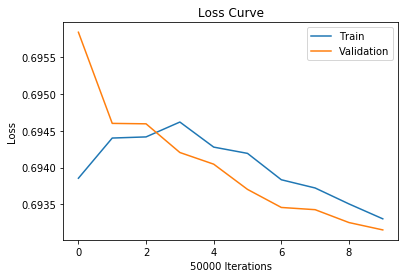

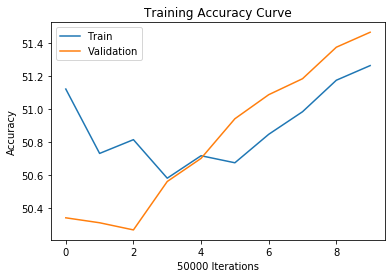

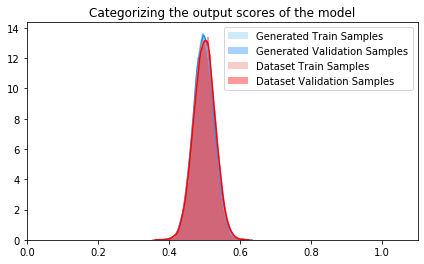

  5%|▌         | 49984/946094 [05:00<1:37:02, 153.91it/s]

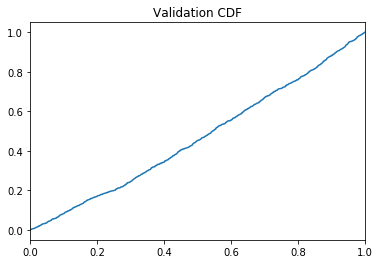

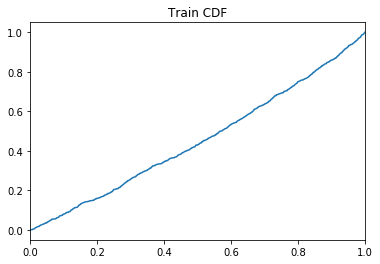

  5%|▌         | 50023/946094 [05:44<184:49:31,  1.35it/s]

Training AUC at epoch 0: 0.45381136363636365
Validation AUC epoch 0: 0.46643954545454547
Training Accuracy at epoch 0: 51.262
Validation Accuracy epoch 0: 51.464


 11%|█         | 99983/946094 [10:33<1:31:15, 154.54it/s] 

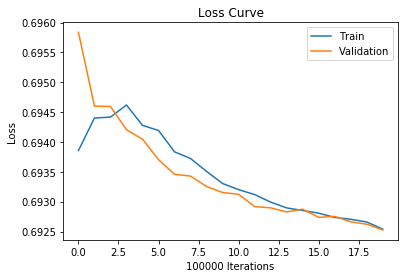

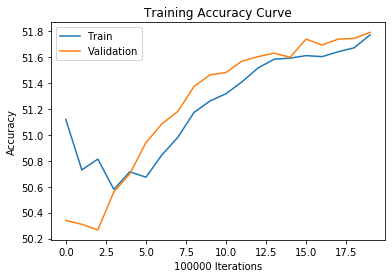

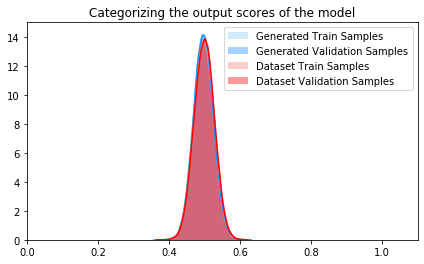

 11%|█         | 99983/946094 [10:50<1:31:15, 154.54it/s]

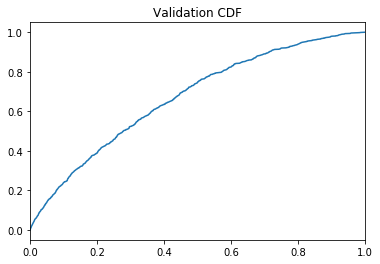

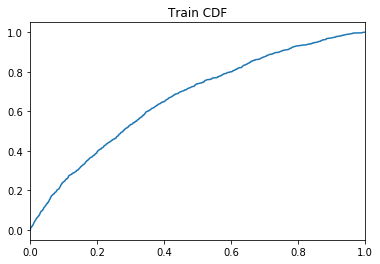

 11%|█         | 100021/946094 [11:30<165:54:26,  1.42it/s]

Training AUC at epoch 0: 0.6658560909090909
Validation AUC epoch 0: 0.670661090909091
Training Accuracy at epoch 0: 51.773
Validation Accuracy epoch 0: 51.793


 16%|█▌        | 149988/946094 [16:18<1:16:02, 174.48it/s] 

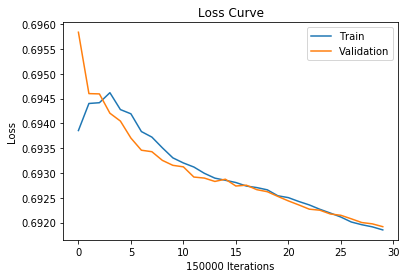

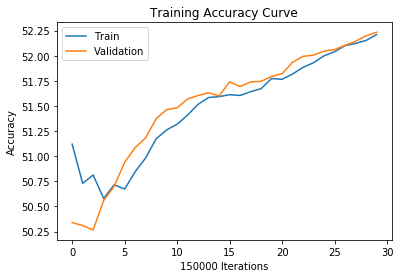

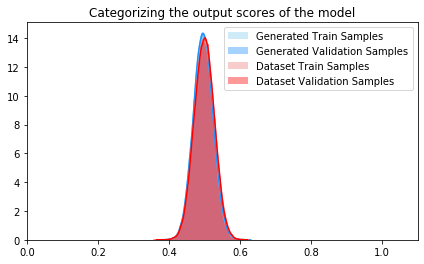

 16%|█▌        | 149988/946094 [16:30<1:16:02, 174.48it/s]

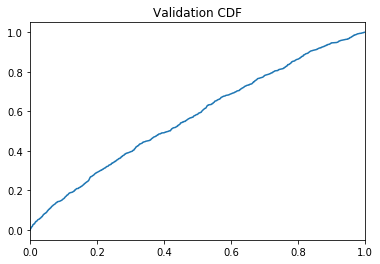

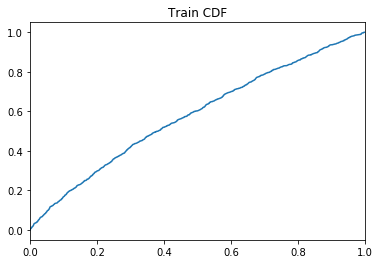

 16%|█▌        | 150000/946094 [17:16<321:52:45,  1.46s/it]

Training AUC at epoch 0: 0.5798950909090909
Validation AUC epoch 0: 0.5722425454545454
Training Accuracy at epoch 0: 52.21
Validation Accuracy epoch 0: 52.234


 21%|██        | 199973/946094 [22:06<1:09:30, 178.92it/s] 

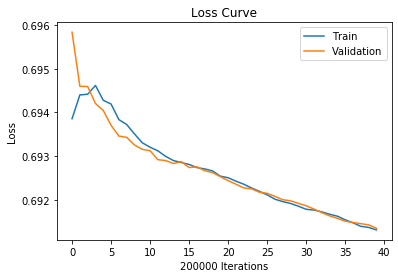

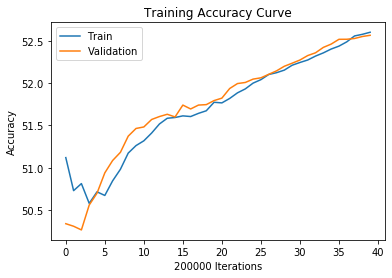

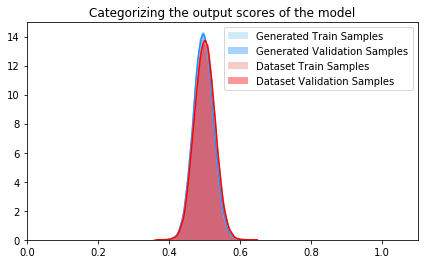

 21%|██        | 199973/946094 [22:21<1:09:30, 178.92it/s]

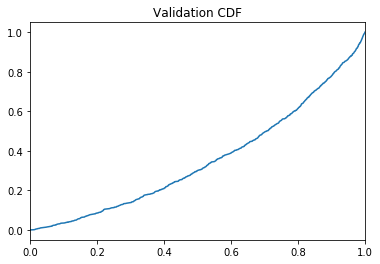

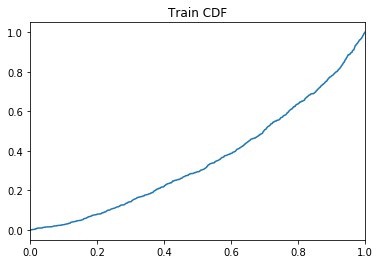

 21%|██        | 200024/946094 [23:03<92:05:00,  2.25it/s] 

Training AUC at epoch 0: 0.3557359090909091
Validation AUC epoch 0: 0.35340863636363634
Training Accuracy at epoch 0: 52.5995
Validation Accuracy epoch 0: 52.5635


 26%|██▋       | 249984/946094 [27:49<1:14:52, 154.95it/s]

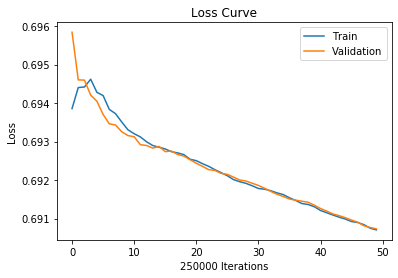

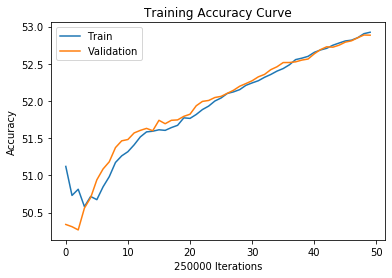

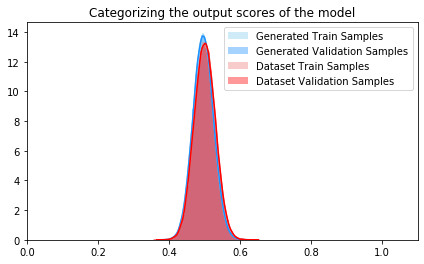

 26%|██▋       | 249984/946094 [28:01<1:14:52, 154.95it/s]

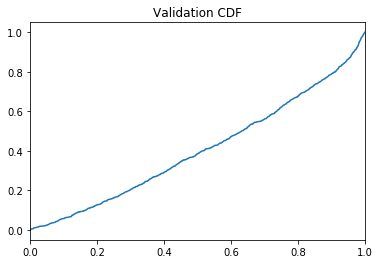

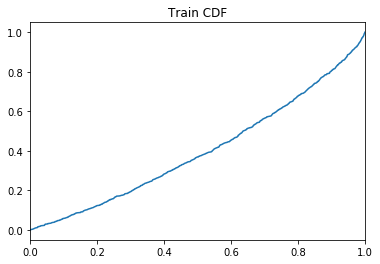

 26%|██▋       | 250024/946094 [28:47<146:59:35,  1.32it/s]

Training AUC at epoch 0: 0.4006576363636364
Validation AUC epoch 0: 0.4045040909090909
Training Accuracy at epoch 0: 52.9236
Validation Accuracy epoch 0: 52.884


 32%|███▏      | 299979/946094 [33:37<1:09:45, 154.38it/s] 

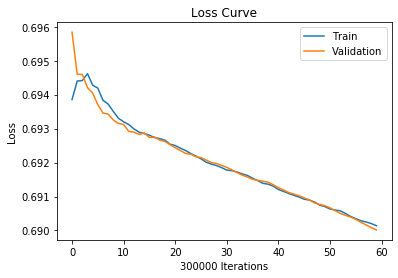

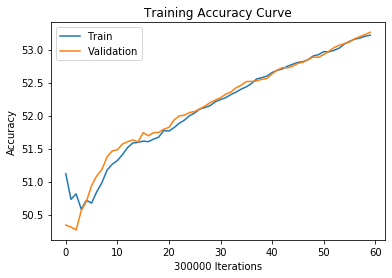

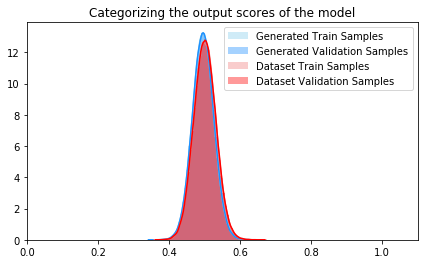

 32%|███▏      | 299979/946094 [33:52<1:09:45, 154.38it/s]

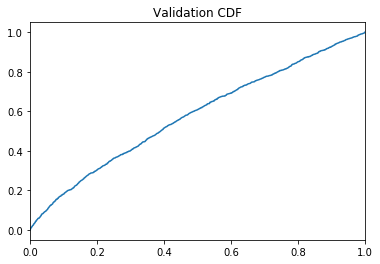

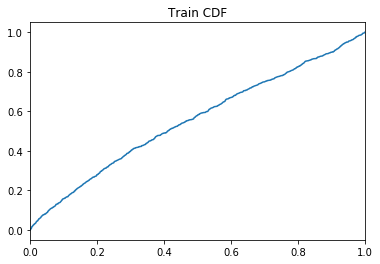

 32%|███▏      | 300022/946094 [34:34<102:48:18,  1.75it/s]

Training AUC at epoch 0: 0.5561345454545454
Validation AUC epoch 0: 0.577823
Training Accuracy at epoch 0: 53.218666666666664
Validation Accuracy epoch 0: 53.263


 37%|███▋      | 349978/946094 [39:23<57:03, 174.11it/s]   

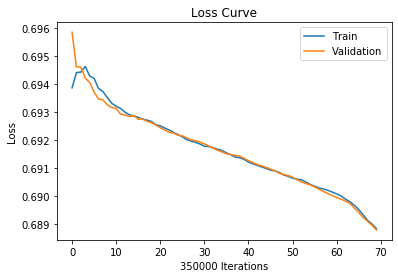

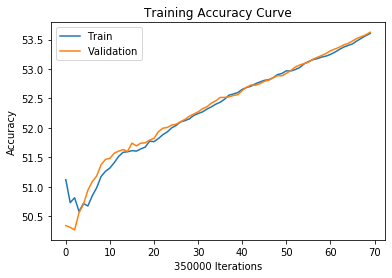

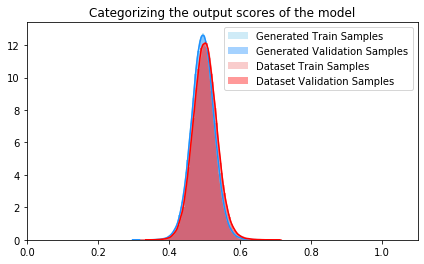

 37%|███▋      | 349978/946094 [39:42<57:03, 174.11it/s]

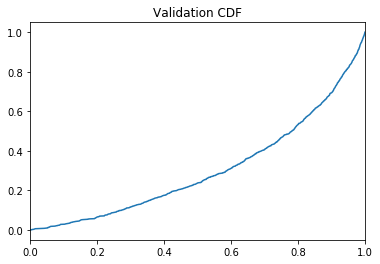

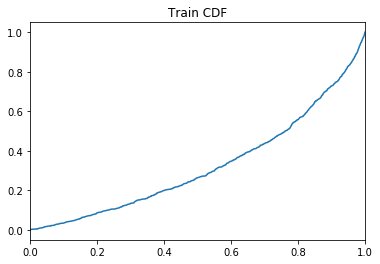

 37%|███▋      | 350000/946094 [40:21<131:34:49,  1.26it/s]

Training AUC at epoch 0: 0.32399627272727277
Validation AUC epoch 0: 0.3037921818181818
Training Accuracy at epoch 0: 53.60285714285714
Validation Accuracy epoch 0: 53.62342857142857


 42%|████▏     | 399989/946094 [45:04<47:16, 192.52it/s]   

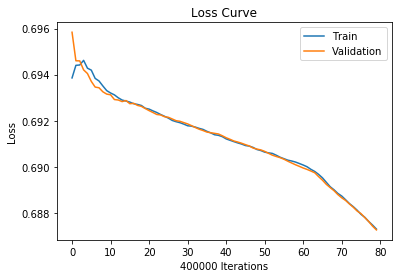

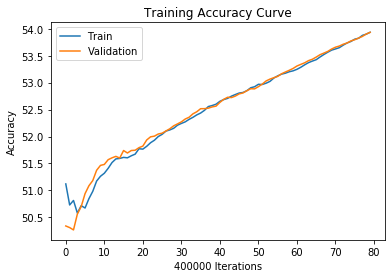

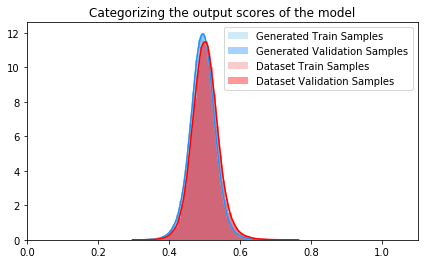

 42%|████▏     | 399989/946094 [45:22<47:16, 192.52it/s]

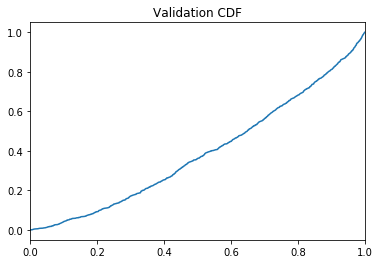

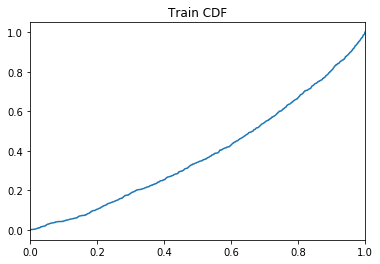

 42%|████▏     | 400024/946094 [46:02<167:52:36,  1.11s/it]

Training AUC at epoch 0: 0.3863060909090909
Validation AUC epoch 0: 0.390776
Training Accuracy at epoch 0: 53.93475
Validation Accuracy epoch 0: 53.933


 48%|████▊     | 449997/946094 [50:48<53:04, 155.77it/s]   

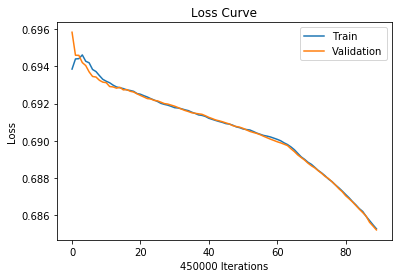

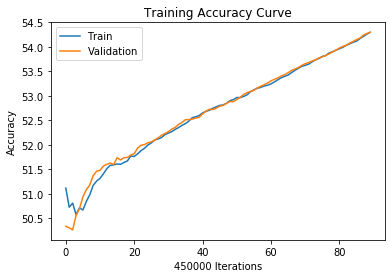

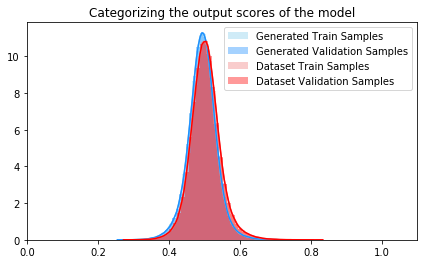

 48%|████▊     | 449997/946094 [51:03<53:04, 155.77it/s]

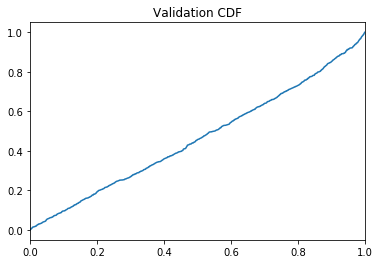

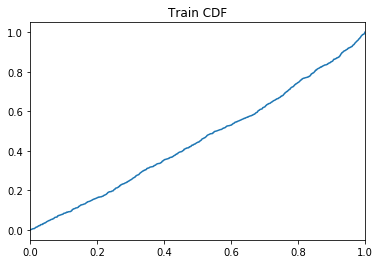

 48%|████▊     | 450023/946094 [51:46<554:51:36,  4.03s/it]

Training AUC at epoch 0: 0.4537492727272727
Validation AUC epoch 0: 0.463246
Training Accuracy at epoch 0: 54.297555555555554
Validation Accuracy epoch 0: 54.29933333333334


 53%|█████▎    | 499980/946094 [56:36<48:47, 152.37it/s]   

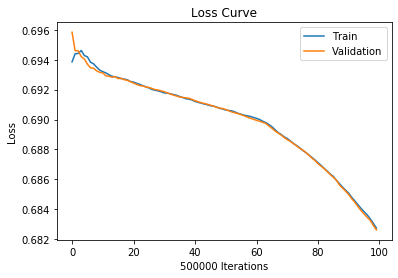

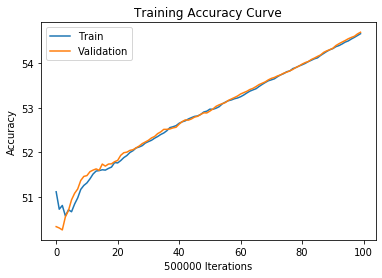

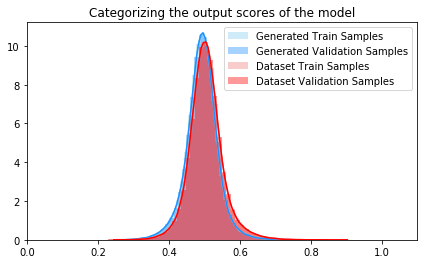

 53%|█████▎    | 499980/946094 [56:53<48:47, 152.37it/s]

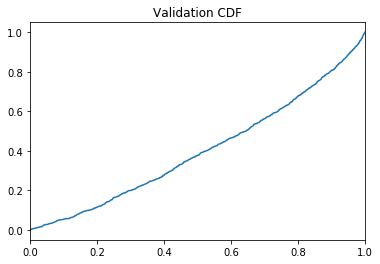

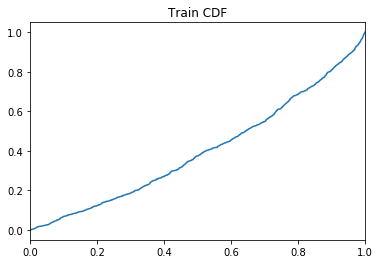

 53%|█████▎    | 500022/946094 [57:34<76:23:38,  1.62it/s] 

Training AUC at epoch 0: 0.400081
Validation AUC epoch 0: 0.4014436363636364
Training Accuracy at epoch 0: 54.6568
Validation Accuracy epoch 0: 54.6894


 58%|█████▊    | 549997/946094 [1:02:24<37:31, 175.89it/s]

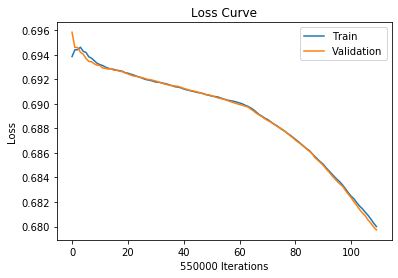

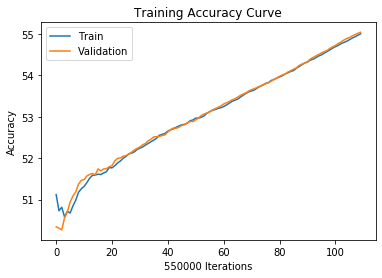

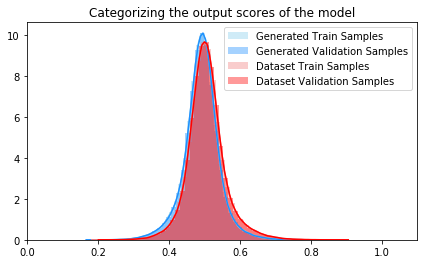

 58%|█████▊    | 549997/946094 [1:02:43<37:31, 175.89it/s]

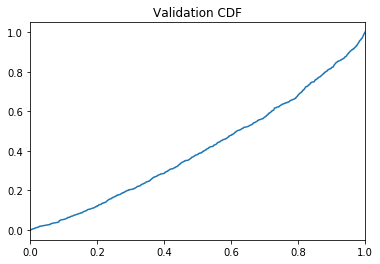

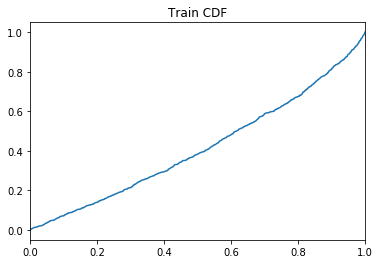

 58%|█████▊    | 550000/946094 [1:03:22<638:28:59,  5.80s/it]

Training AUC at epoch 0: 0.4150235454545455
Validation AUC epoch 0: 0.409303
Training Accuracy at epoch 0: 55.00218181818182
Validation Accuracy epoch 0: 55.04181818181818


 63%|██████▎   | 599998/946094 [1:08:09<29:56, 192.69it/s]   

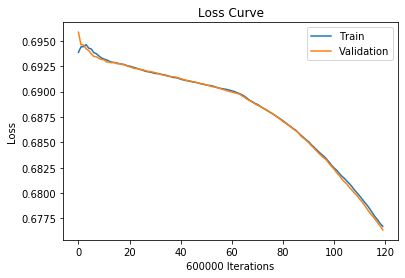

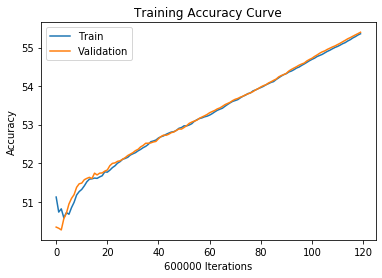

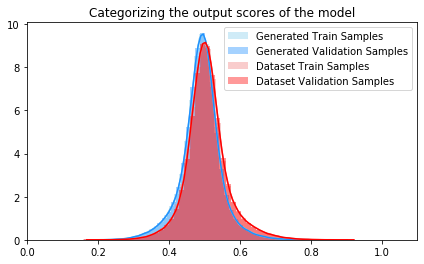

 63%|██████▎   | 599998/946094 [1:08:23<29:56, 192.69it/s]

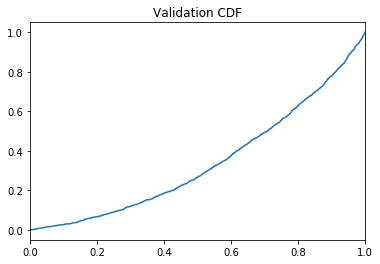

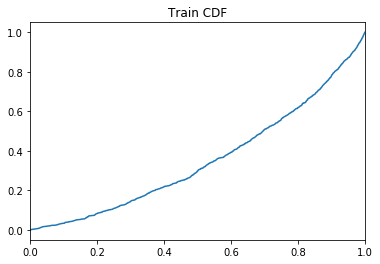

 63%|██████▎   | 600024/946094 [1:09:08<600:07:31,  6.24s/it]

Training AUC at epoch 0: 0.3540362727272727
Validation AUC epoch 0: 0.34177427272727273
Training Accuracy at epoch 0: 55.3585
Validation Accuracy epoch 0: 55.3975


 69%|██████▊   | 649984/946094 [1:13:54<31:46, 155.29it/s]   

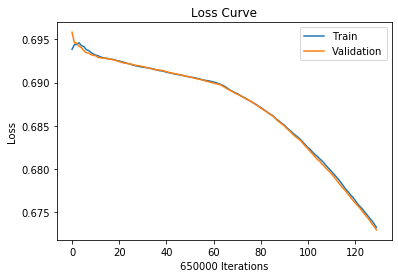

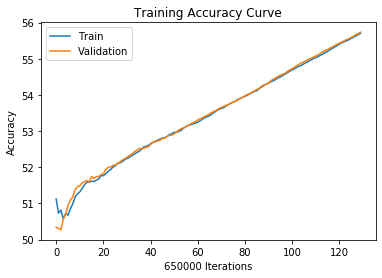

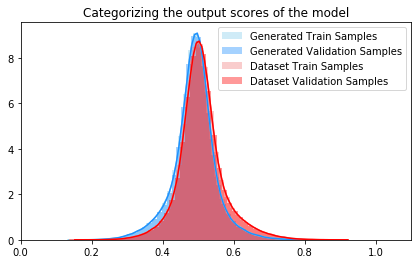

 69%|██████▊   | 649984/946094 [1:14:14<31:46, 155.29it/s]

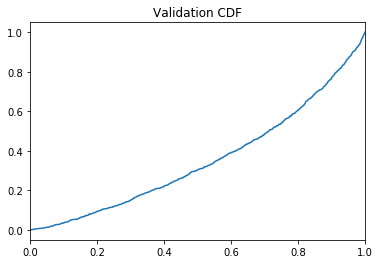

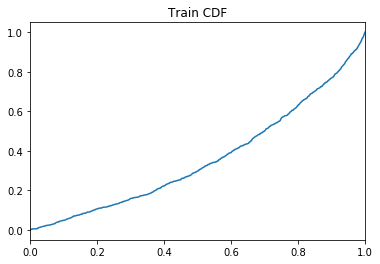

 69%|██████▊   | 650024/946094 [1:14:54<64:37:07,  1.27it/s]

Training AUC at epoch 0: 0.3595494545454545
Validation AUC epoch 0: 0.3528494545454545
Training Accuracy at epoch 0: 55.70461538461539
Validation Accuracy epoch 0: 55.73384615384615


 74%|███████▍  | 699989/946094 [1:19:43<26:40, 153.79it/s]  

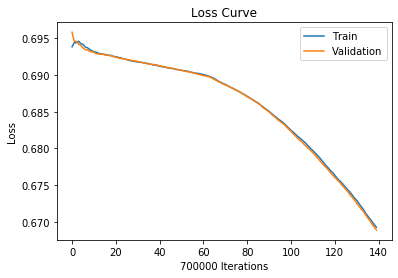

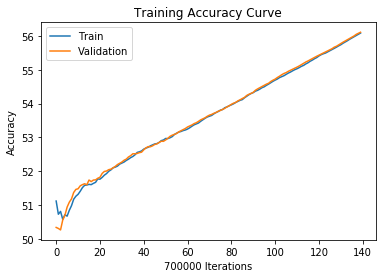

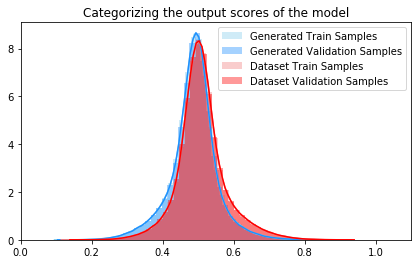

 74%|███████▍  | 699989/946094 [1:19:54<26:40, 153.79it/s]

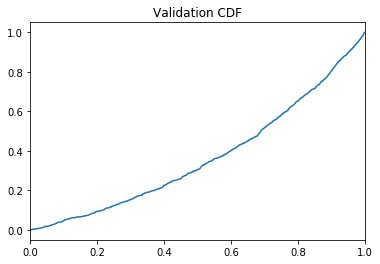

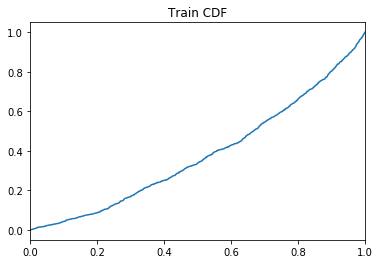

 74%|███████▍  | 700023/946094 [1:20:45<80:24:15,  1.18s/it] 

Training AUC at epoch 0: 0.381305
Validation AUC epoch 0: 0.36769381818181823
Training Accuracy at epoch 0: 56.082857142857144
Validation Accuracy epoch 0: 56.107


 79%|███████▉  | 749986/946094 [1:25:56<21:38, 151.03it/s]  

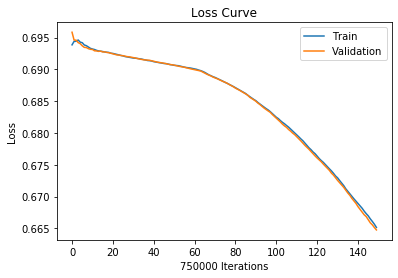

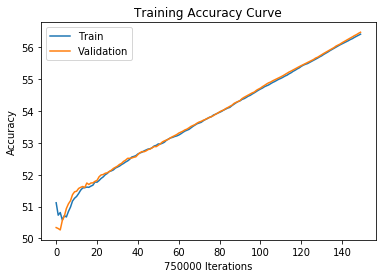

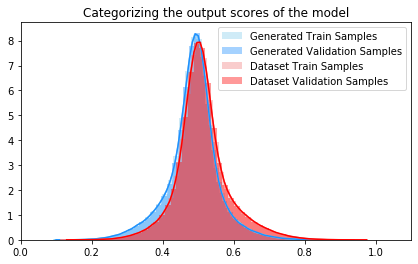

 79%|███████▉  | 749986/946094 [1:26:14<21:38, 151.03it/s]

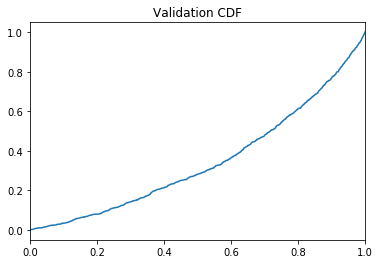

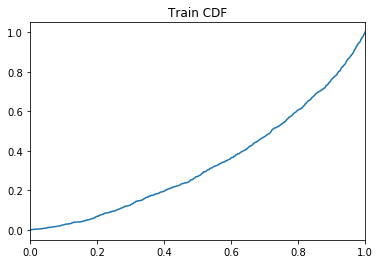

 79%|███████▉  | 750000/946094 [1:26:55<70:06:56,  1.29s/it]

Training AUC at epoch 0: 0.33679945454545457
Validation AUC epoch 0: 0.3458535454545455
Training Accuracy at epoch 0: 56.41706666666666
Validation Accuracy epoch 0: 56.47773333333333


 85%|████████▍ | 799992/946094 [1:32:06<12:38, 192.53it/s]  

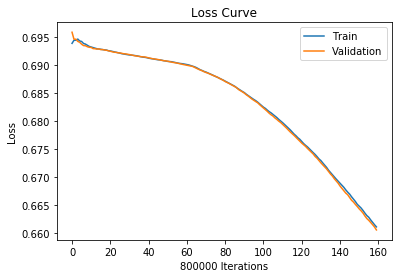

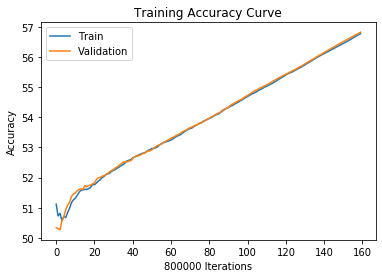

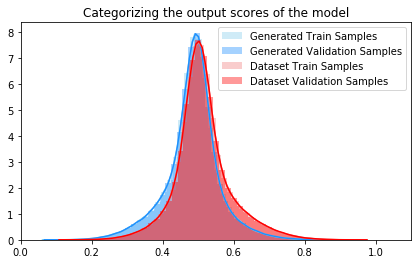

 85%|████████▍ | 799992/946094 [1:32:25<12:38, 192.53it/s]

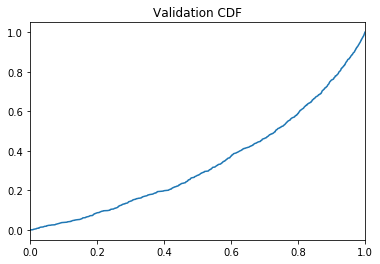

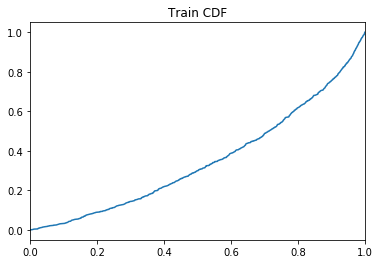

 85%|████████▍ | 800023/946094 [1:33:06<64:52:26,  1.60s/it]

Training AUC at epoch 0: 0.34952936363636367
Validation AUC epoch 0: 0.33906800000000004
Training Accuracy at epoch 0: 56.770875
Validation Accuracy epoch 0: 56.81925


 90%|████████▉ | 849988/946094 [1:38:19<12:14, 130.91it/s]  

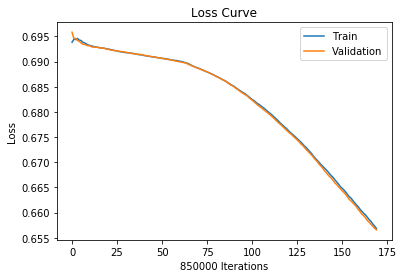

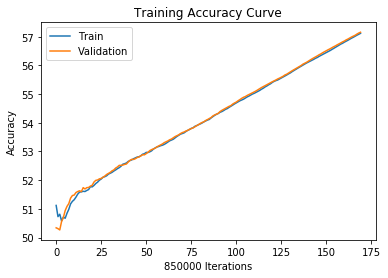

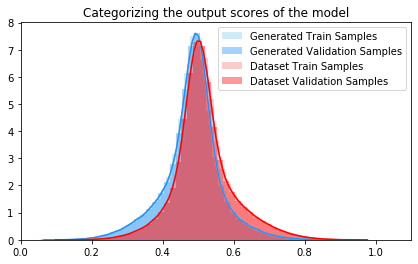

 90%|████████▉ | 849988/946094 [1:38:35<12:14, 130.91it/s]

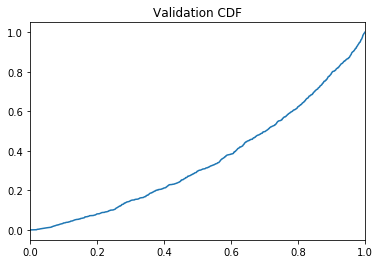

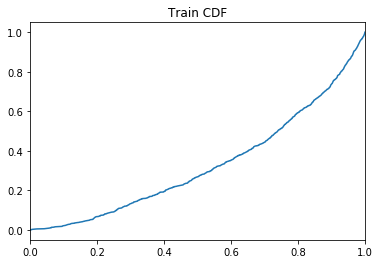

 90%|████████▉ | 850020/946094 [1:39:20<28:34:16,  1.07s/it]

Training AUC at epoch 0: 0.3285070909090909
Validation AUC epoch 0: 0.353035
Training Accuracy at epoch 0: 57.118235294117646
Validation Accuracy epoch 0: 57.15611764705882


 95%|█████████▌| 899981/946094 [1:44:20<05:18, 144.78it/s]  

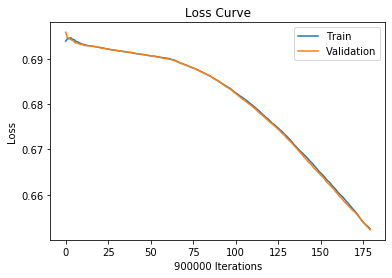

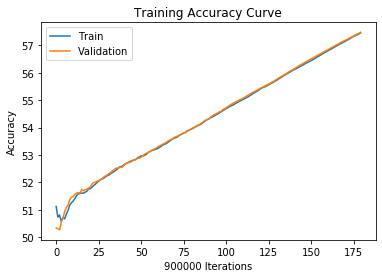

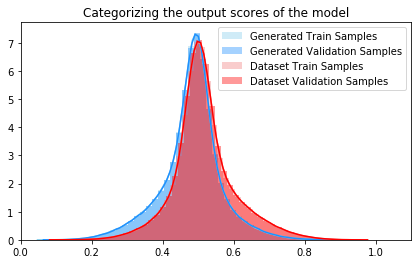

 95%|█████████▌| 899981/946094 [1:44:35<05:18, 144.78it/s]

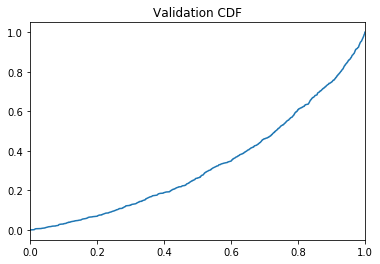

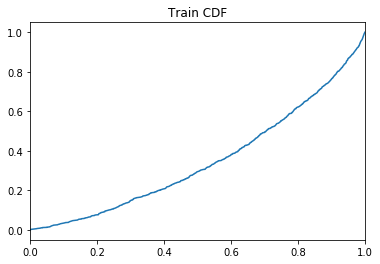

 95%|█████████▌| 900023/946094 [1:45:22<8:43:23,  1.47it/s] 

Training AUC at epoch 0: 0.34904236363636365
Validation AUC epoch 0: 0.33189118181818184
Training Accuracy at epoch 0: 57.454
Validation Accuracy epoch 0: 57.47855555555556


  0%|          | 18/946094 [00:00<1:51:38, 141.23it/s]

Saving to:  model_checkpoints/binary/OHBioNet/07062020.pth
Starting epoch: 1  with learning rate:  [0.01]


  0%|          | 3902/946094 [00:24<1:35:37, 164.22it/s]

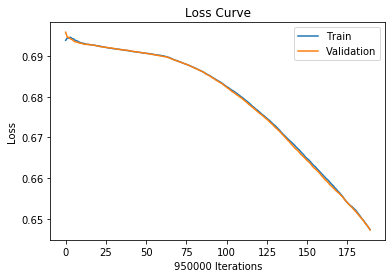

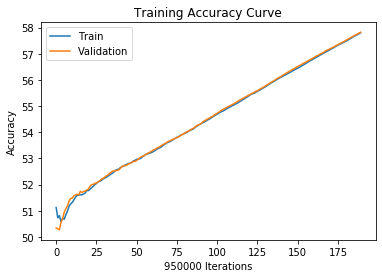

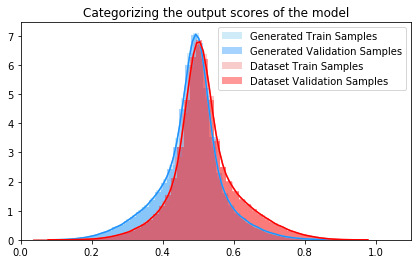

  0%|          | 3902/946094 [00:40<1:35:37, 164.22it/s]

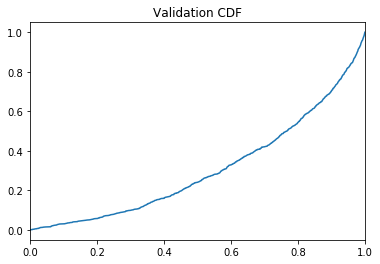

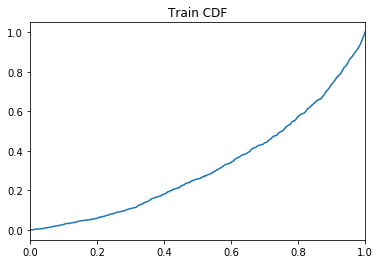

  0%|          | 3906/946094 [01:25<1204:03:07,  4.60s/it]

Training AUC at epoch 1: 0.319275
Validation AUC epoch 1: 0.3061862727272727
Training Accuracy at epoch 1: 57.79842105263158
Validation Accuracy epoch 1: 57.82


  6%|▌         | 53897/946094 [06:27<1:22:40, 179.86it/s] 

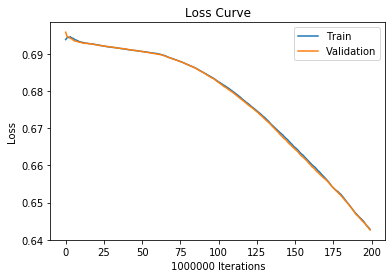

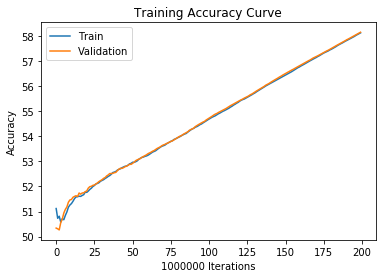

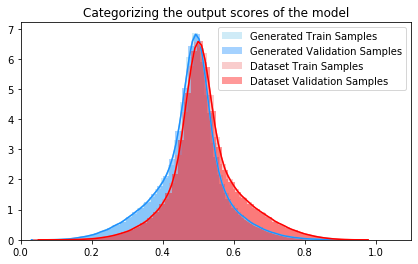

  6%|▌         | 53897/946094 [06:40<1:22:40, 179.86it/s]

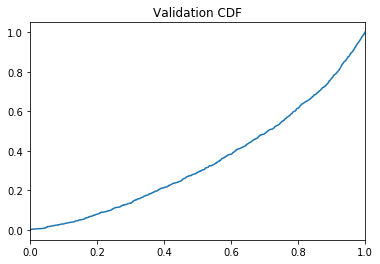

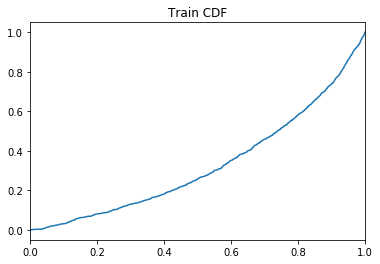

  6%|▌         | 53928/946094 [07:29<358:04:36,  1.44s/it]

Training AUC at epoch 1: 0.3279718181818182
Validation AUC epoch 1: 0.3486950909090909
Training Accuracy at epoch 1: 58.1337
Validation Accuracy epoch 1: 58.1578


 11%|█         | 103903/946094 [12:34<1:37:13, 144.38it/s]

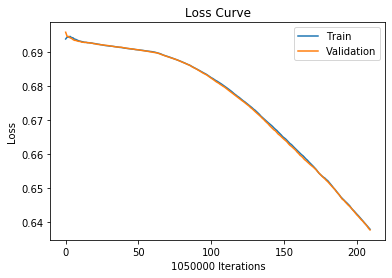

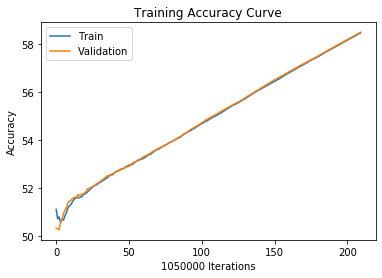

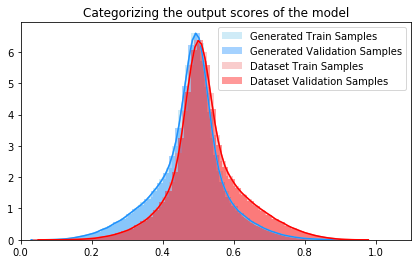

 11%|█         | 103903/946094 [12:50<1:37:13, 144.38it/s]

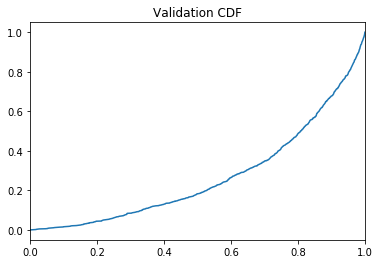

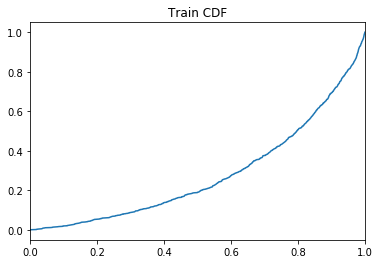

 11%|█         | 103929/946094 [13:37<1026:40:47,  4.39s/it]

Training AUC at epoch 1: 0.2793920909090909
Validation AUC epoch 1: 0.26837063636363634
Training Accuracy at epoch 1: 58.46457142857143
Validation Accuracy epoch 1: 58.49295238095238


 16%|█▋        | 153904/946094 [18:42<1:21:18, 162.38it/s]  

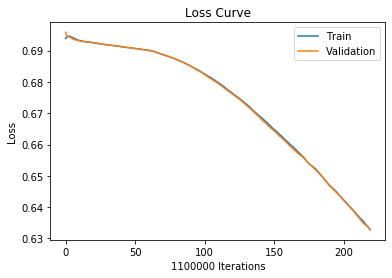

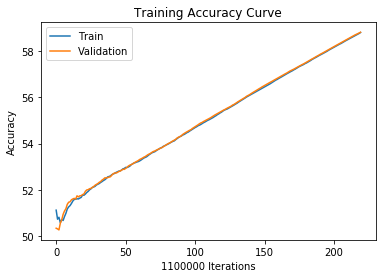

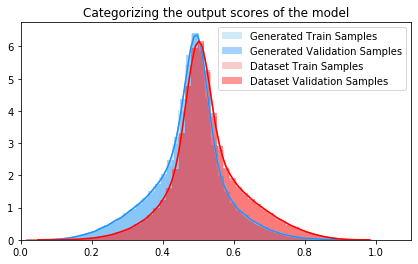

 16%|█▋        | 153904/946094 [19:00<1:21:18, 162.38it/s]

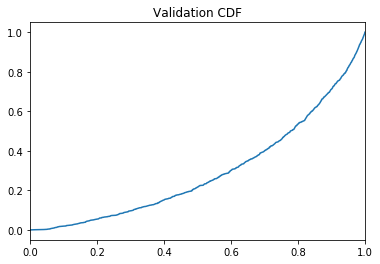

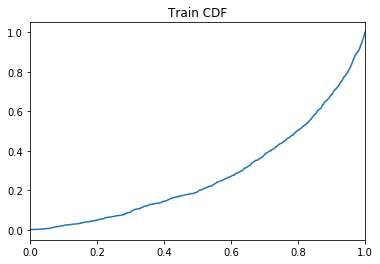

 16%|█▋        | 153929/946094 [19:45<1449:21:15,  6.59s/it]

Training AUC at epoch 1: 0.2802995454545455
Validation AUC epoch 1: 0.29401890909090905
Training Accuracy at epoch 1: 58.799727272727274
Validation Accuracy epoch 1: 58.811454545454545


 22%|██▏       | 203879/946094 [24:49<1:21:17, 152.17it/s]  

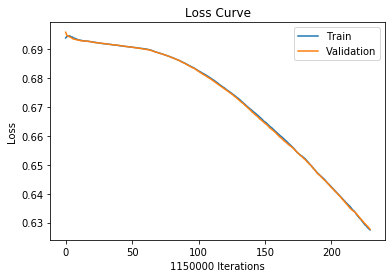

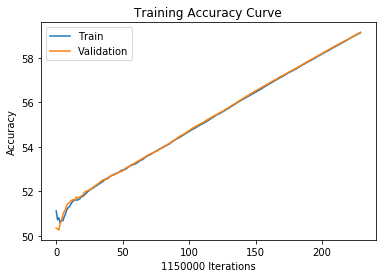

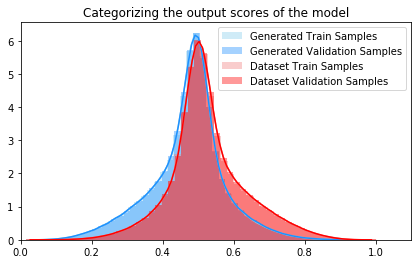

 22%|██▏       | 203879/946094 [25:01<1:21:17, 152.17it/s]

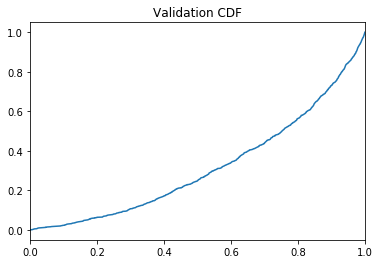

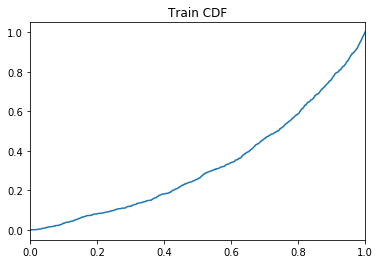

 22%|██▏       | 203906/946094 [25:53<148:01:27,  1.39it/s]

Training AUC at epoch 1: 0.33024400000000004
Validation AUC epoch 1: 0.3167728181818181
Training Accuracy at epoch 1: 59.12269565217391
Validation Accuracy epoch 1: 59.144


 27%|██▋       | 253902/946094 [30:59<1:08:04, 169.47it/s] 

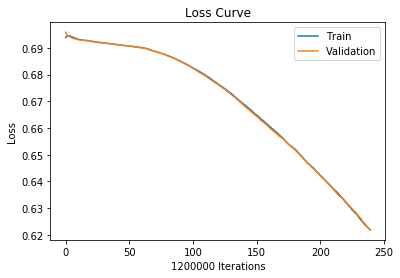

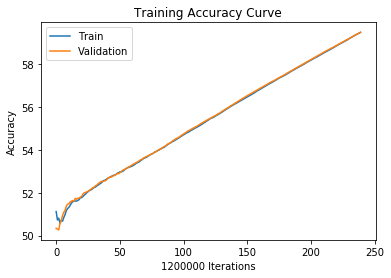

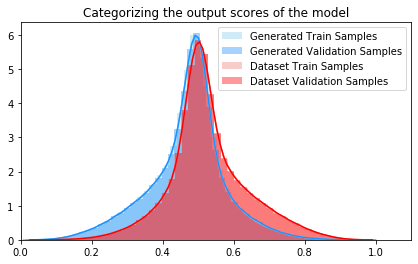

 27%|██▋       | 253902/946094 [31:11<1:08:04, 169.47it/s]

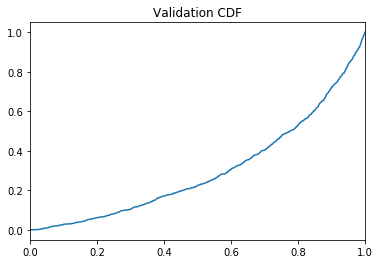

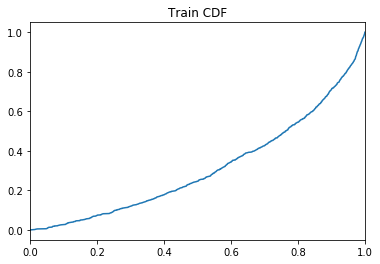

 27%|██▋       | 253929/946094 [32:03<644:22:09,  3.35s/it]

Training AUC at epoch 1: 0.3125424545454546
Validation AUC epoch 1: 0.30088045454545453
Training Accuracy at epoch 1: 59.45791666666667
Validation Accuracy epoch 1: 59.466


 32%|███▏      | 303902/946094 [37:08<1:07:53, 157.65it/s] 

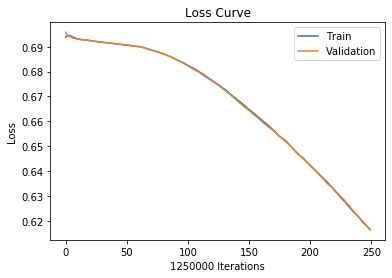

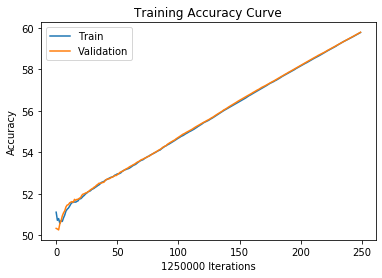

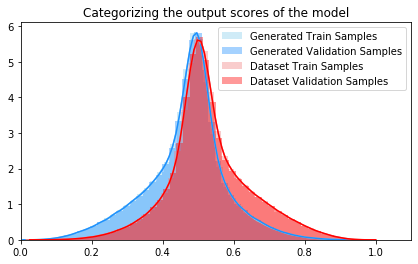

 32%|███▏      | 303902/946094 [37:21<1:07:53, 157.65it/s]

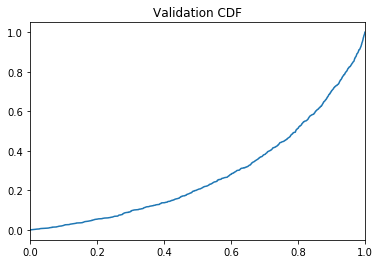

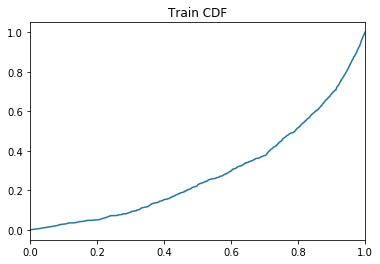

 32%|███▏      | 303929/946094 [38:12<604:12:49,  3.39s/it]

Training AUC at epoch 1: 0.2907696363636364
Validation AUC epoch 1: 0.2835540909090909
Training Accuracy at epoch 1: 59.77984
Validation Accuracy epoch 1: 59.79184


 37%|███▋      | 353887/946094 [43:19<1:08:13, 144.66it/s] 

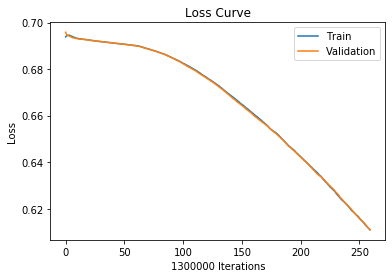

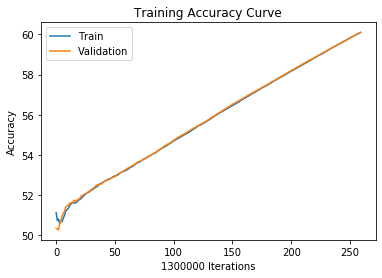

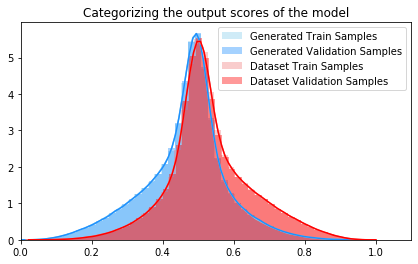

 37%|███▋      | 353887/946094 [43:32<1:08:13, 144.66it/s]

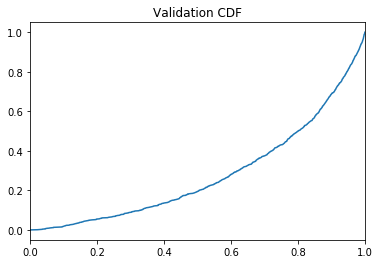

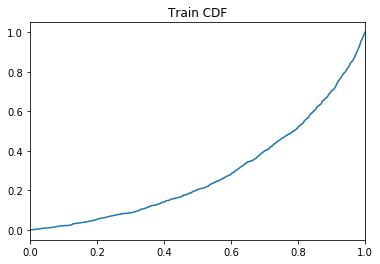

 37%|███▋      | 353931/946094 [44:23<116:35:11,  1.41it/s]

Training AUC at epoch 1: 0.28796472727272726
Validation AUC epoch 1: 0.2787758181818182
Training Accuracy at epoch 1: 60.08823076923077
Validation Accuracy epoch 1: 60.10453846153846


 43%|████▎     | 403895/946094 [49:26<55:00, 164.29it/s]   

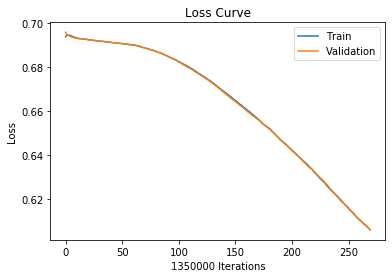

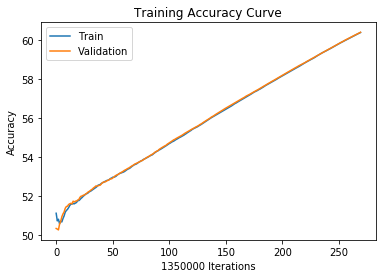

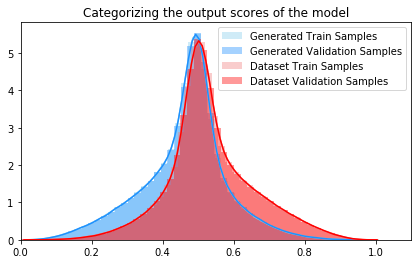

 43%|████▎     | 403895/946094 [49:42<55:00, 164.29it/s]

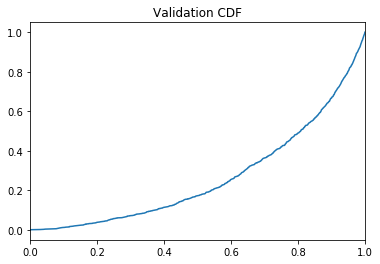

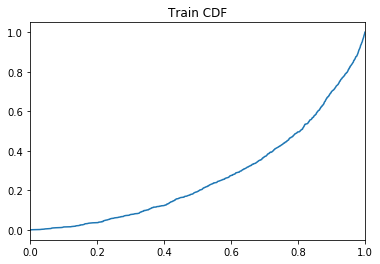

 43%|████▎     | 403906/946094 [50:30<263:17:52,  1.75s/it]

Training AUC at epoch 1: 0.2743239090909091
Validation AUC epoch 1: 0.26430336363636364
Training Accuracy at epoch 1: 60.382888888888886
Validation Accuracy epoch 1: 60.397703703703705


 48%|████▊     | 453894/946094 [55:35<46:46, 175.36it/s]   

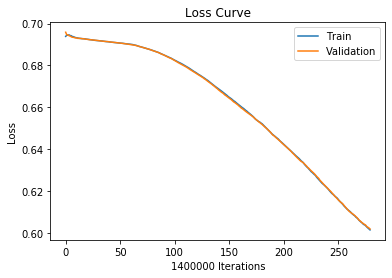

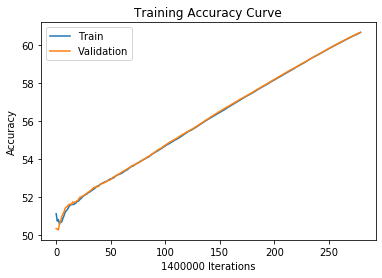

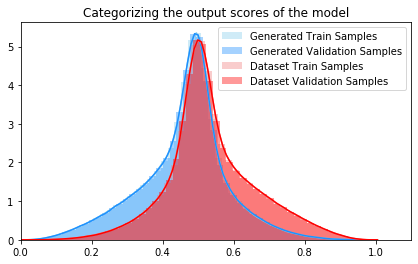

 48%|████▊     | 453894/946094 [55:52<46:46, 175.36it/s]

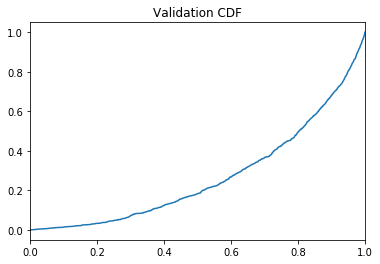

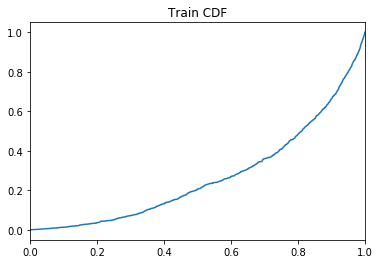

 48%|████▊     | 453929/946094 [56:40<155:08:01,  1.13s/it]

Training AUC at epoch 1: 0.26924536363636364
Validation AUC epoch 1: 0.2689876363636363
Training Accuracy at epoch 1: 60.66464285714286
Validation Accuracy epoch 1: 60.67507142857143


 53%|█████▎    | 503899/946094 [1:01:48<54:28, 135.30it/s] 

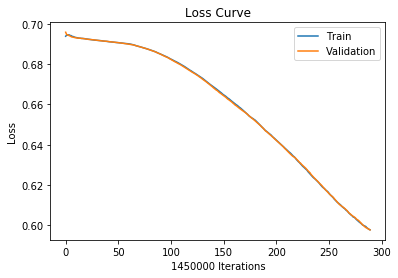

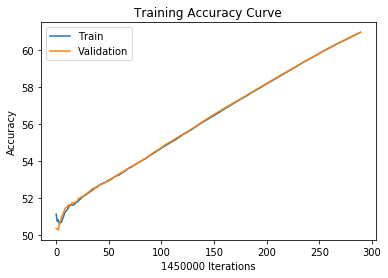

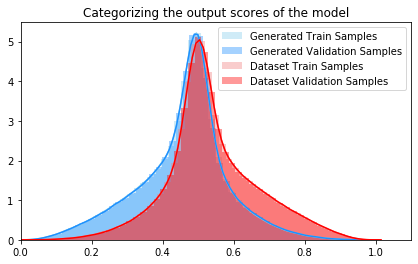

 53%|█████▎    | 503899/946094 [1:02:03<54:28, 135.30it/s]

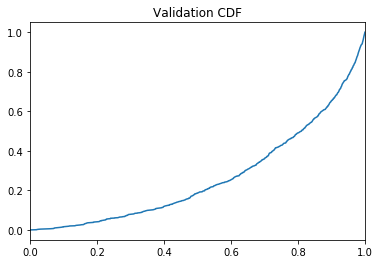

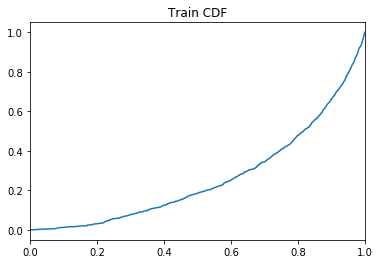

 53%|█████▎    | 503928/946094 [1:02:54<241:10:32,  1.96s/it]

Training AUC at epoch 1: 0.26195636363636365
Validation AUC epoch 1: 0.2653114545454546
Training Accuracy at epoch 1: 60.949862068965516
Validation Accuracy epoch 1: 60.95068965517241


 59%|█████▊    | 553890/946094 [1:07:57<45:03, 145.08it/s]   

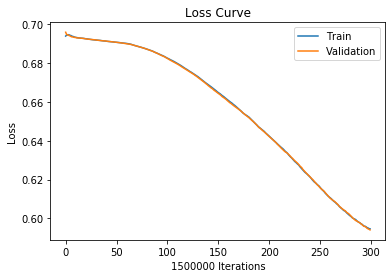

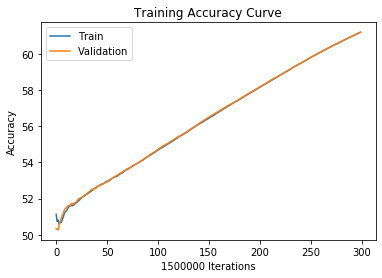

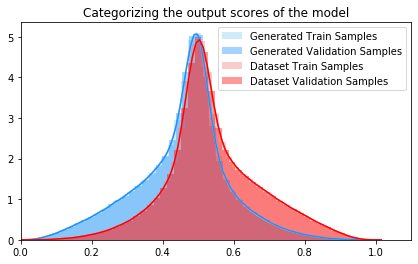

 59%|█████▊    | 553890/946094 [1:08:13<45:03, 145.08it/s]

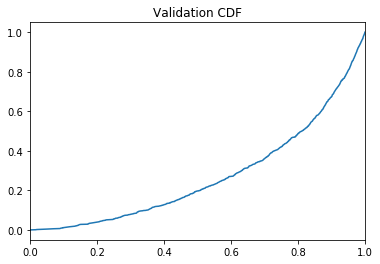

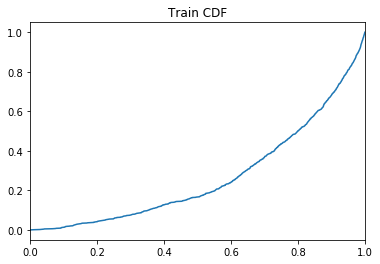

 59%|█████▊    | 553928/946094 [1:09:02<93:53:38,  1.16it/s] 

Training AUC at epoch 1: 0.2680823636363636
Validation AUC epoch 1: 0.27120954545454545
Training Accuracy at epoch 1: 61.2132
Validation Accuracy epoch 1: 61.2132


 64%|██████▍   | 603899/946094 [1:14:08<34:47, 163.89it/s]  

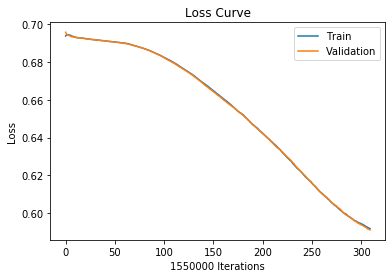

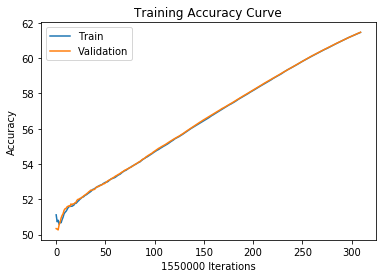

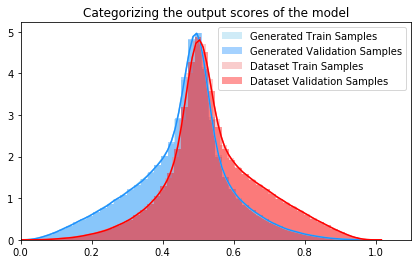

 64%|██████▍   | 603899/946094 [1:14:23<34:47, 163.89it/s]

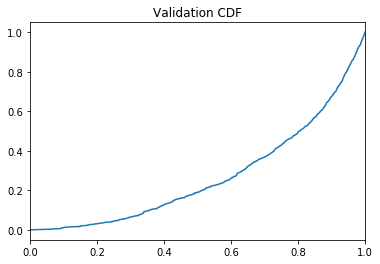

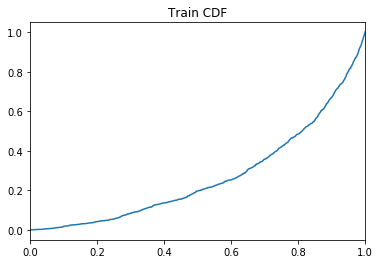

 64%|██████▍   | 603906/946094 [1:15:15<274:10:26,  2.88s/it]

Training AUC at epoch 1: 0.2687901818181818
Validation AUC epoch 1: 0.2690201818181818
Training Accuracy at epoch 1: 61.45251612903226
Validation Accuracy epoch 1: 61.462


 69%|██████▉   | 653896/946094 [1:20:22<27:17, 178.48it/s]   

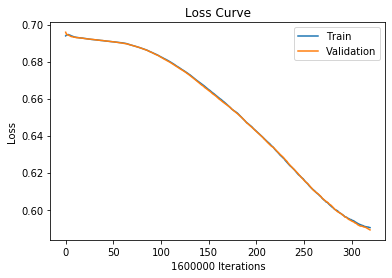

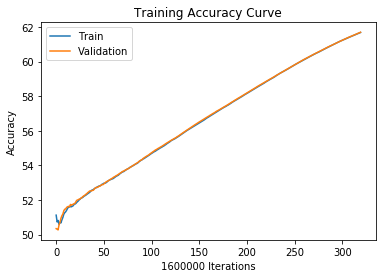

 69%|██████▉   | 653896/946094 [1:20:34<27:17, 178.48it/s]

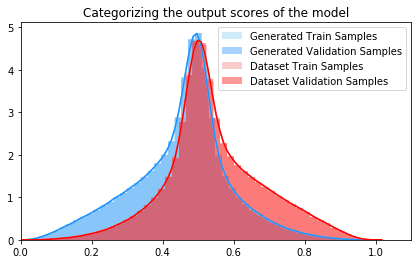

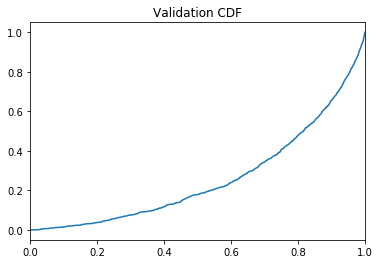

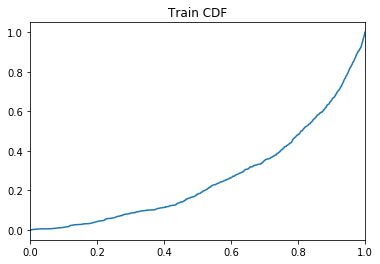

 69%|██████▉   | 653928/946094 [1:21:29<114:14:11,  1.41s/it]

Training AUC at epoch 1: 0.2646138181818182
Validation AUC epoch 1: 0.25874790909090906
Training Accuracy at epoch 1: 61.6844375
Validation Accuracy epoch 1: 61.6990625


 74%|███████▍  | 703890/946094 [1:26:33<25:52, 155.98it/s]   

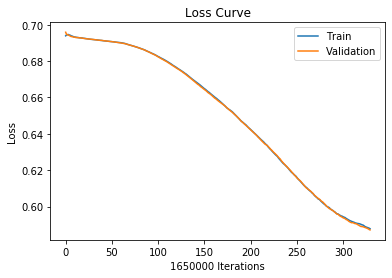

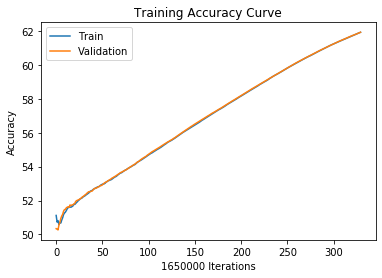

 74%|███████▍  | 703890/946094 [1:26:44<25:52, 155.98it/s]

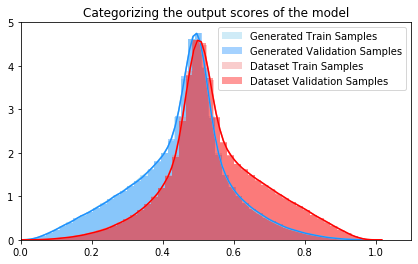

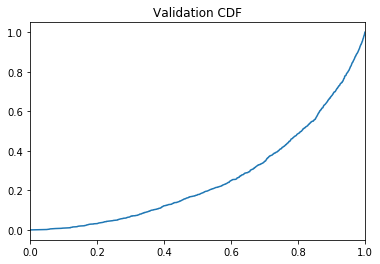

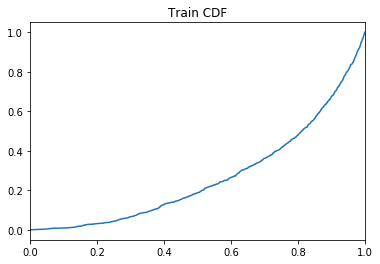

 74%|███████▍  | 703928/946094 [1:27:40<59:17:27,  1.13it/s]

Training AUC at epoch 1: 0.266617
Validation AUC epoch 1: 0.26198418181818184
Training Accuracy at epoch 1: 61.91848484848485
Validation Accuracy epoch 1: 61.921757575757574


 80%|███████▉  | 753902/946094 [1:32:47<21:00, 152.47it/s]  

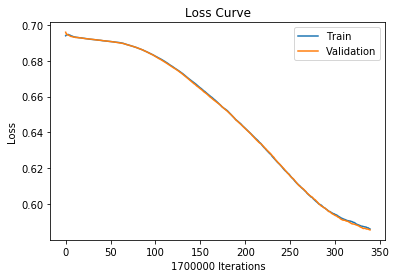

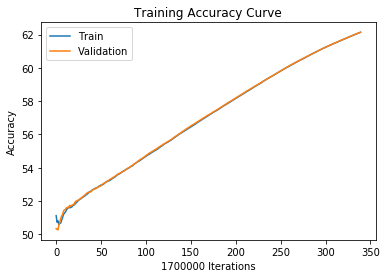

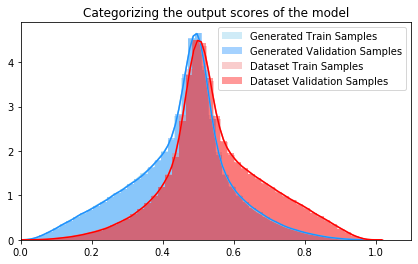

 80%|███████▉  | 753902/946094 [1:33:04<21:00, 152.47it/s]

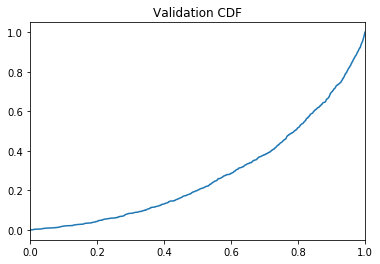

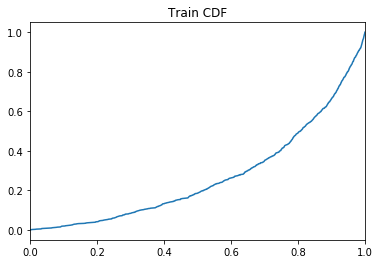

 80%|███████▉  | 753932/946094 [1:33:53<185:15:32,  3.47s/it]

Training AUC at epoch 1: 0.2687395454545455
Validation AUC epoch 1: 0.2815317272727273
Training Accuracy at epoch 1: 62.139941176470586
Validation Accuracy epoch 1: 62.135823529411766


 85%|████████▍ | 803882/946094 [1:38:55<14:53, 159.12it/s]   

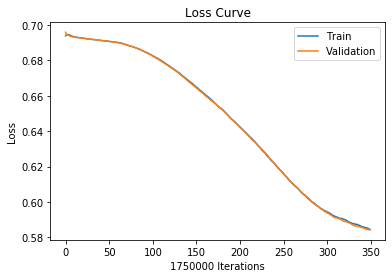

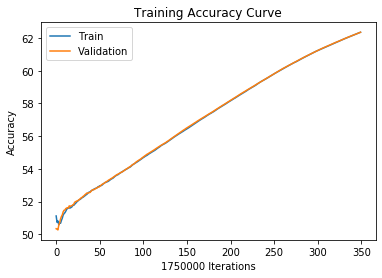

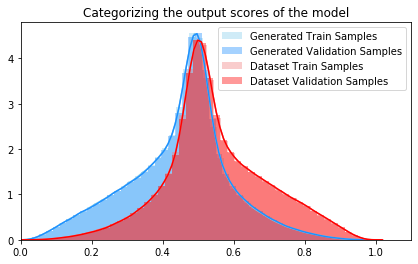

 85%|████████▍ | 803882/946094 [1:39:14<14:53, 159.12it/s]

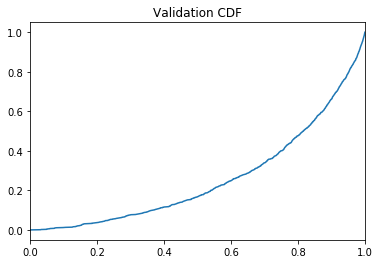

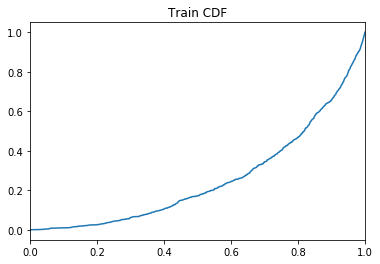

 85%|████████▍ | 803906/946094 [1:40:02<33:11:31,  1.19it/s]

Training AUC at epoch 1: 0.25658545454545456
Validation AUC epoch 1: 0.2585351818181818
Training Accuracy at epoch 1: 62.35102857142857
Validation Accuracy epoch 1: 62.35348571428572


 90%|█████████ | 853883/946094 [1:45:07<09:27, 162.45it/s]  

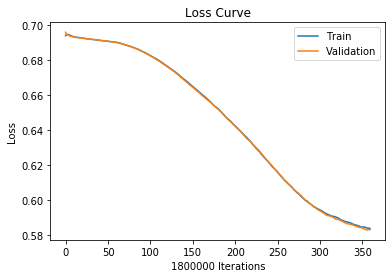

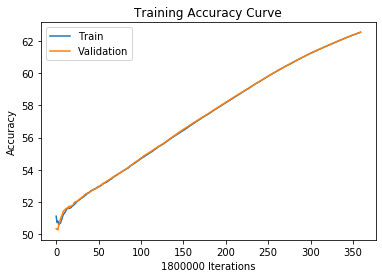

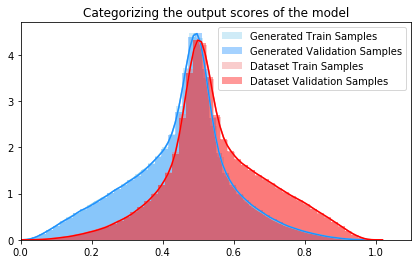

 90%|█████████ | 853883/946094 [1:45:25<09:27, 162.45it/s]

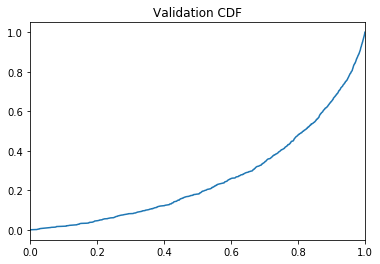

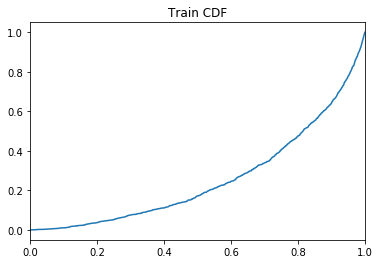

 90%|█████████ | 853928/946094 [1:46:14<15:40:37,  1.63it/s]

Training AUC at epoch 1: 0.256856
Validation AUC epoch 1: 0.2627728181818182
Training Accuracy at epoch 1: 62.54588888888889
Validation Accuracy epoch 1: 62.54533333333333


 96%|█████████▌| 903890/946094 [1:51:40<05:17, 132.85it/s]  

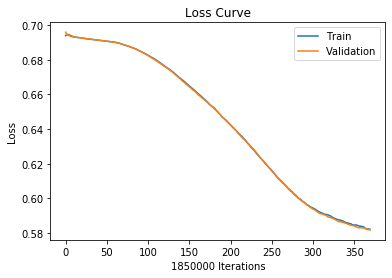

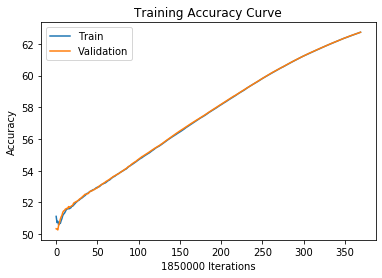

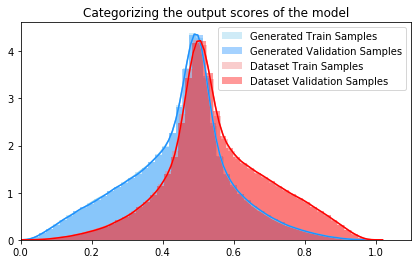

 96%|█████████▌| 903890/946094 [1:51:55<05:17, 132.85it/s]

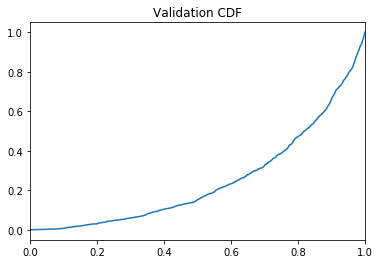

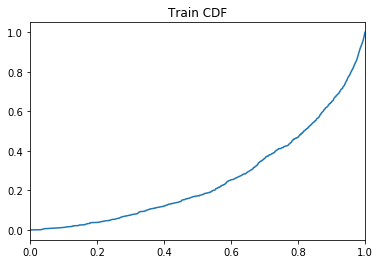

 96%|█████████▌| 903929/946094 [1:52:49<10:35:37,  1.11it/s]

Training AUC at epoch 1: 0.2593026363636364
Validation AUC epoch 1: 0.2501657272727273
Training Accuracy at epoch 1: 62.73345945945946
Validation Accuracy epoch 1: 62.734162162162164


  0%|          | 19/946094 [00:00<1:26:00, 183.34it/s]

Saving to:  model_checkpoints/binary/OHBioNet/07062020.pth
Starting epoch: 2  with learning rate:  [0.01]


  1%|          | 7787/946094 [00:52<1:51:50, 139.83it/s]

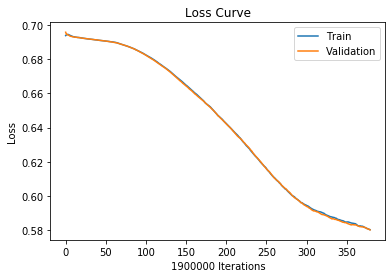

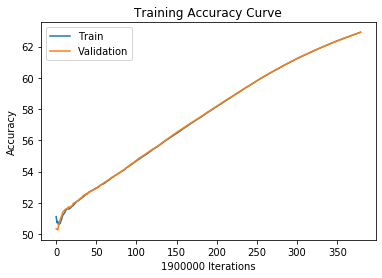

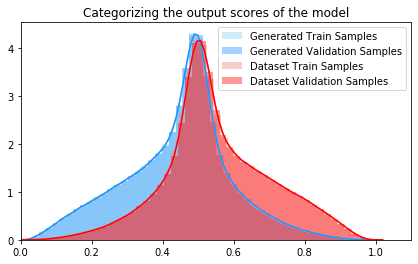

  1%|          | 7787/946094 [01:10<1:51:50, 139.83it/s]

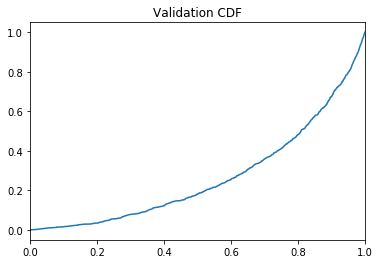

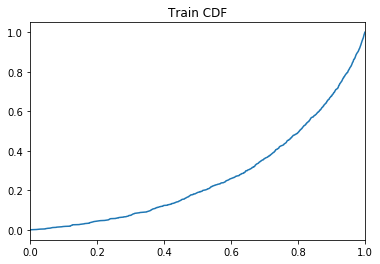

  1%|          | 7833/946094 [02:01<152:25:03,  1.71it/s]

Training AUC at epoch 2: 0.26944745454545455
Validation AUC epoch 2: 0.26647909090909094
Training Accuracy at epoch 2: 62.9211052631579
Validation Accuracy epoch 2: 62.921


  6%|▌         | 57805/946094 [07:33<1:29:08, 166.08it/s]

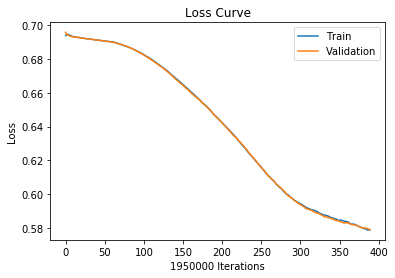

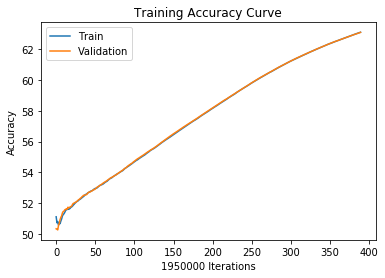

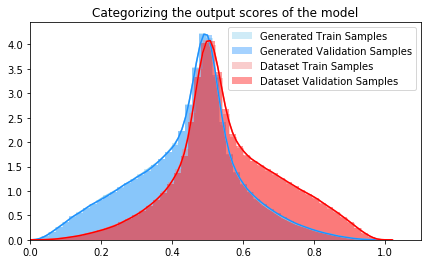

  6%|▌         | 57805/946094 [07:50<1:29:08, 166.08it/s]

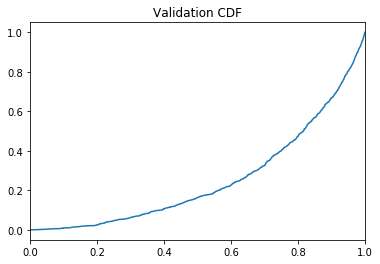

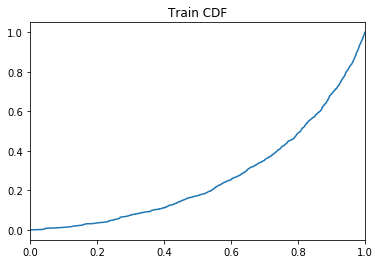

  6%|▌         | 57812/946094 [08:42<729:45:43,  2.96s/it]

Training AUC at epoch 2: 0.26559772727272724
Validation AUC epoch 2: 0.25350327272727274
Training Accuracy at epoch 2: 63.10425641025641
Validation Accuracy epoch 2: 63.095948717948716


 11%|█▏        | 107810/946094 [14:06<1:27:04, 160.46it/s]

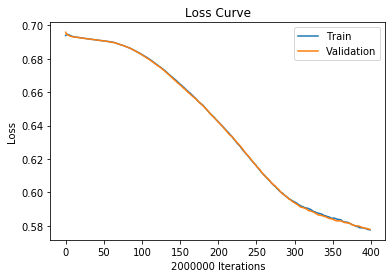

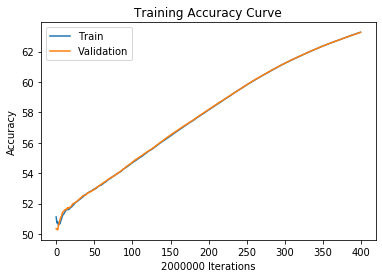

 11%|█▏        | 107810/946094 [14:21<1:27:04, 160.46it/s]

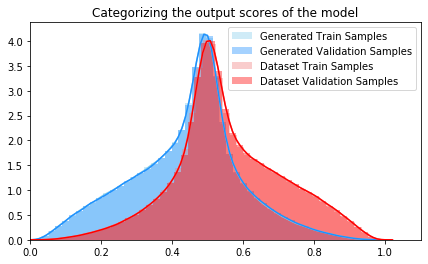

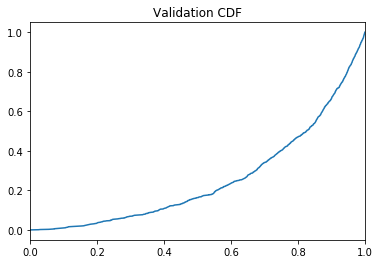

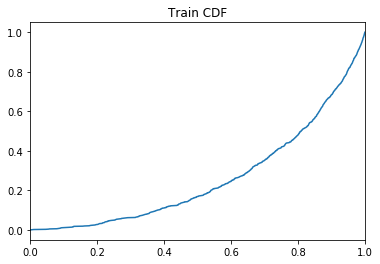

 11%|█▏        | 107834/946094 [15:17<1730:42:36,  7.43s/it]

Training AUC at epoch 2: 0.26039663636363636
Validation AUC epoch 2: 0.25456827272727267
Training Accuracy at epoch 2: 63.2729
Validation Accuracy epoch 2: 63.26675


 17%|█▋        | 157796/946094 [20:44<1:39:43, 131.74it/s]  

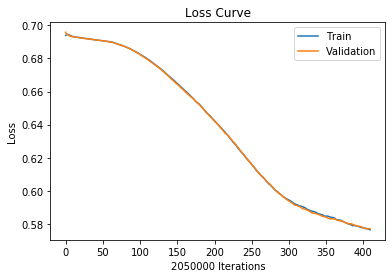

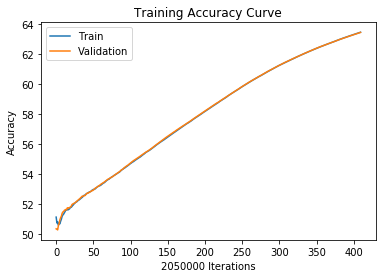

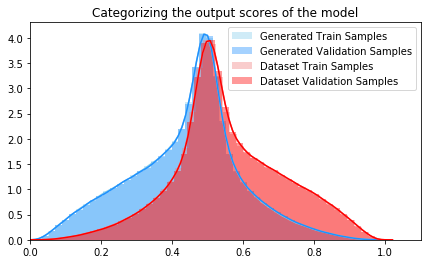

 17%|█▋        | 157796/946094 [21:01<1:39:43, 131.74it/s]

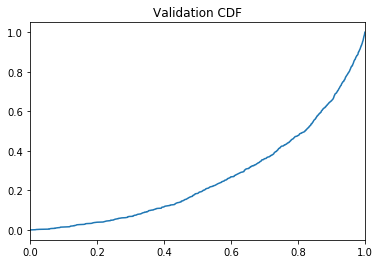

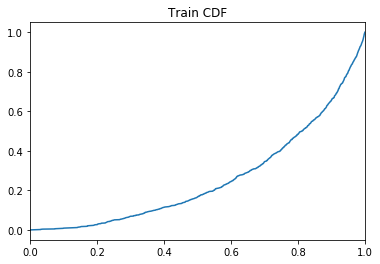

 17%|█▋        | 157832/946094 [21:54<203:46:15,  1.07it/s]

Training AUC at epoch 2: 0.25718436363636366
Validation AUC epoch 2: 0.26394618181818186
Training Accuracy at epoch 2: 63.43878048780488
Validation Accuracy epoch 2: 63.4270243902439


 22%|██▏       | 207801/946094 [27:26<1:22:31, 149.12it/s] 

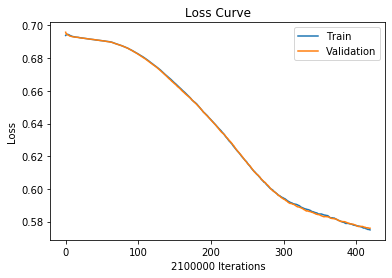

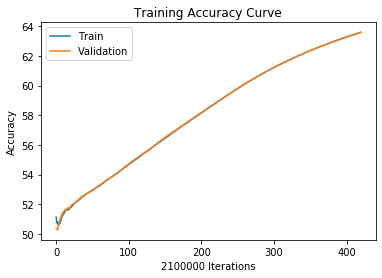

 22%|██▏       | 207801/946094 [27:41<1:22:31, 149.12it/s]

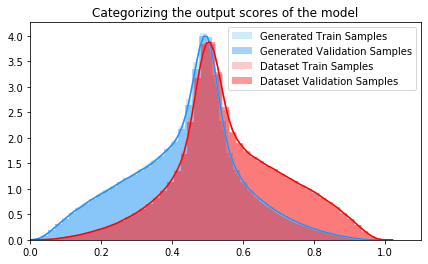

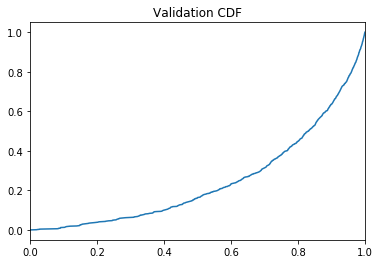

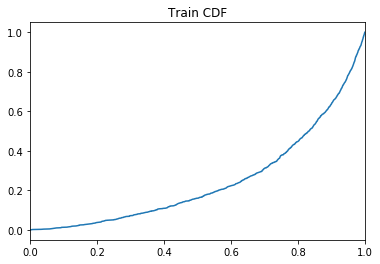

 22%|██▏       | 207834/946094 [28:36<276:23:30,  1.35s/it]

Training AUC at epoch 2: 0.24726909090909088
Validation AUC epoch 2: 0.24628736363636364
Training Accuracy at epoch 2: 63.60290476190476
Validation Accuracy epoch 2: 63.58228571428572


 27%|██▋       | 257809/946094 [34:07<1:09:22, 165.37it/s] 

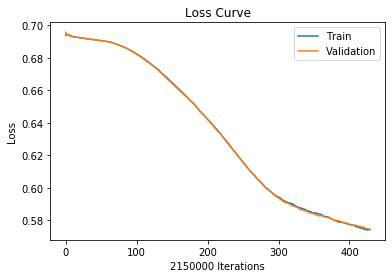

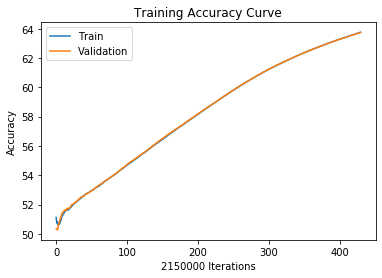

 27%|██▋       | 257809/946094 [34:21<1:09:22, 165.37it/s]

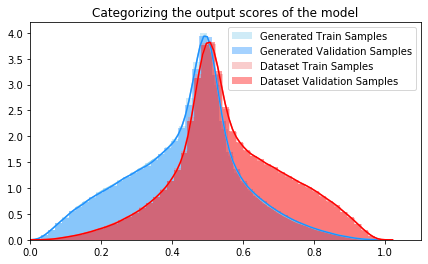

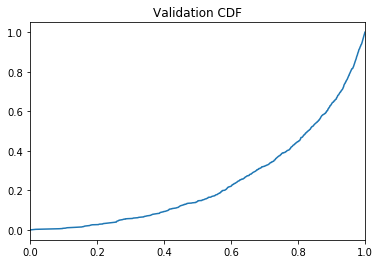

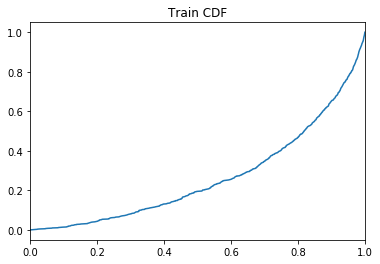

 27%|██▋       | 257812/946094 [35:18<1365:47:23,  7.14s/it]

Training AUC at epoch 2: 0.26404363636363637
Validation AUC epoch 2: 0.2411881818181818
Training Accuracy at epoch 2: 63.75655813953488
Validation Accuracy epoch 2: 63.735627906976745


 33%|███▎      | 307795/946094 [40:46<1:03:48, 166.72it/s]  

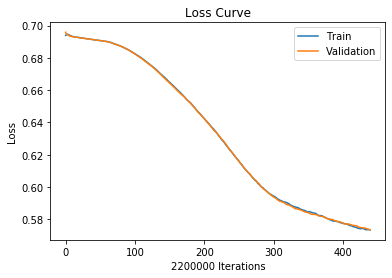

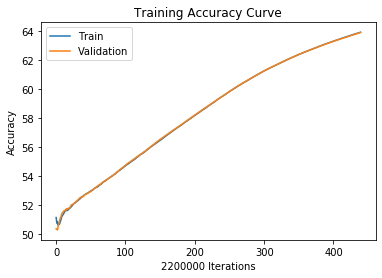

 33%|███▎      | 307795/946094 [41:01<1:03:48, 166.72it/s]

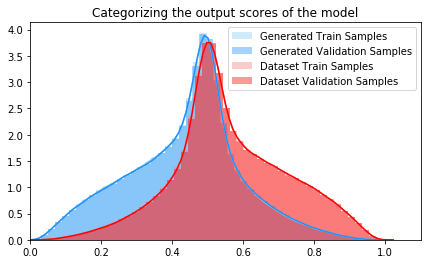

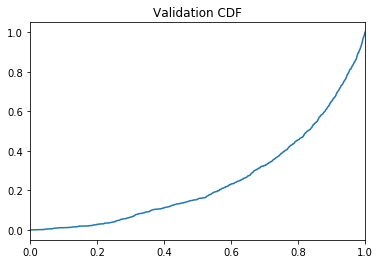

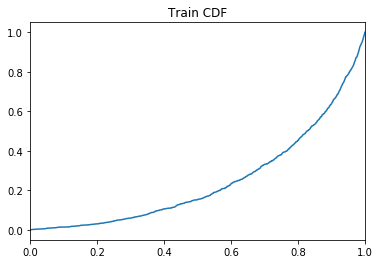

 33%|███▎      | 307836/946094 [41:58<156:43:03,  1.13it/s]

Training AUC at epoch 2: 0.2472398181818182
Validation AUC epoch 2: 0.24862536363636362
Training Accuracy at epoch 2: 63.904863636363636
Validation Accuracy epoch 2: 63.88768181818182


 38%|███▊      | 357805/946094 [47:14<1:09:24, 141.28it/s] 

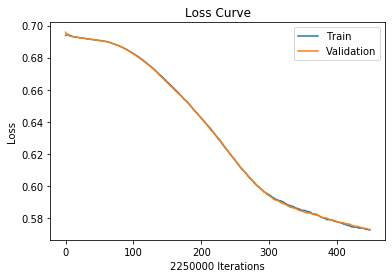

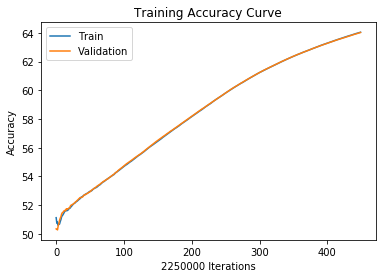

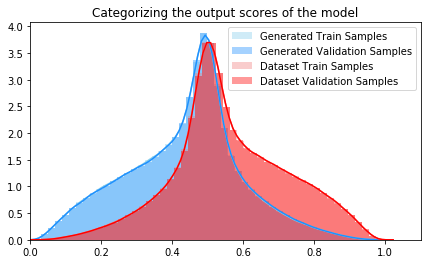

 38%|███▊      | 357805/946094 [47:31<1:09:24, 141.28it/s]

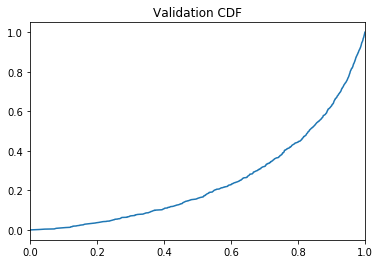

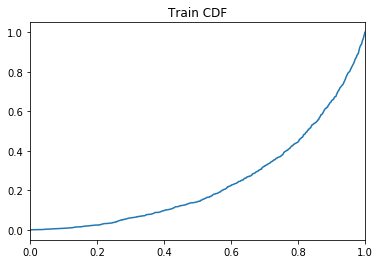

 38%|███▊      | 357833/946094 [48:27<356:06:29,  2.18s/it]

Training AUC at epoch 2: 0.24344772727272726
Validation AUC epoch 2: 0.2474487272727273
Training Accuracy at epoch 2: 64.04764444444444
Validation Accuracy epoch 2: 64.0308


 43%|████▎     | 407811/946094 [53:56<1:03:19, 141.67it/s] 

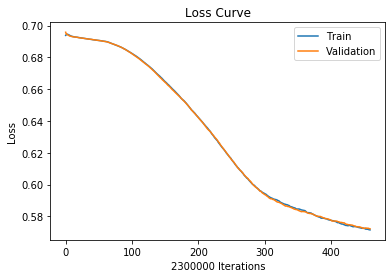

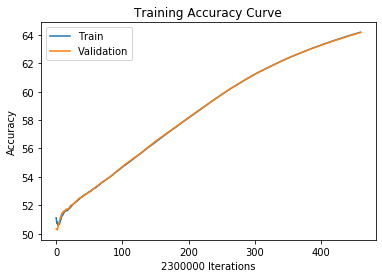

 43%|████▎     | 407811/946094 [54:12<1:03:19, 141.67it/s]

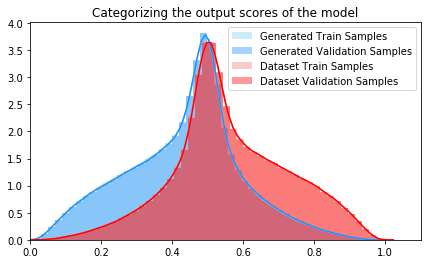

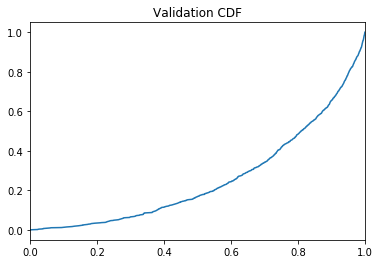

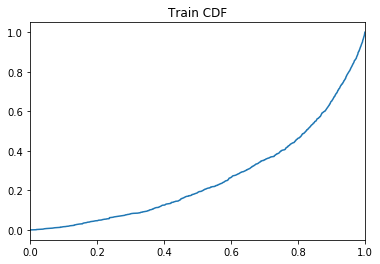

 43%|████▎     | 407833/946094 [55:06<2212:14:14, 14.80s/it]

Training AUC at epoch 2: 0.26404927272727274
Validation AUC epoch 2: 0.2575895454545455
Training Accuracy at epoch 2: 64.18460869565217
Validation Accuracy epoch 2: 64.16569565217391


 48%|████▊     | 457809/946094 [1:00:23<48:12, 168.84it/s]  

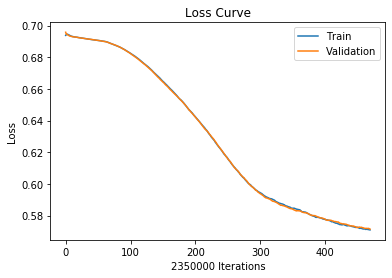

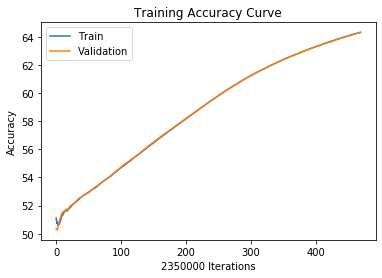

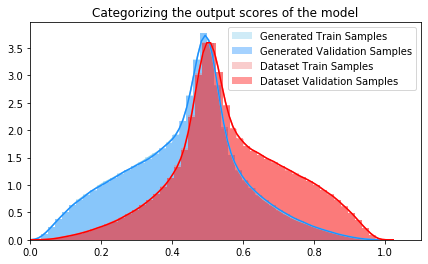

 48%|████▊     | 457809/946094 [1:00:42<48:12, 168.84it/s]

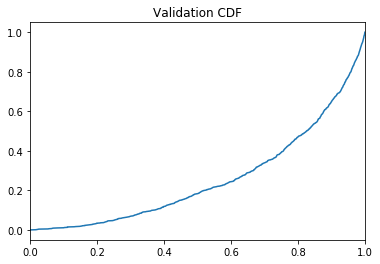

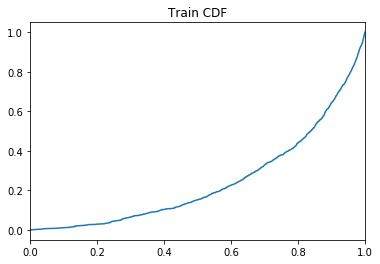

 48%|████▊     | 457812/946094 [1:01:34<969:37:15,  7.15s/it]

Training AUC at epoch 2: 0.24391745454545455
Validation AUC epoch 2: 0.2556912727272727
Training Accuracy at epoch 2: 64.31421276595745
Validation Accuracy epoch 2: 64.29582978723404


 54%|█████▎    | 507802/946094 [1:06:49<43:33, 167.69it/s]   

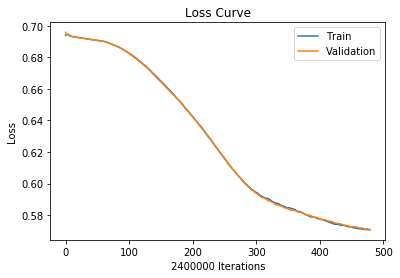

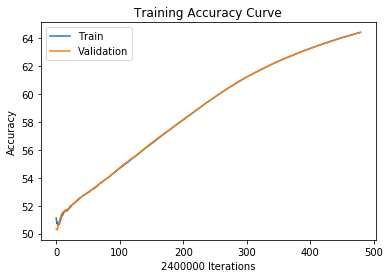

 54%|█████▎    | 507802/946094 [1:07:02<43:33, 167.69it/s]

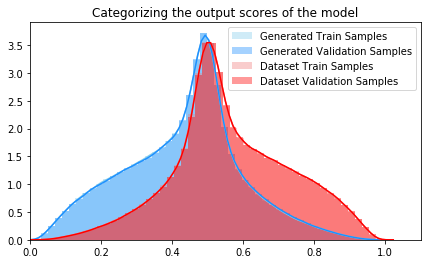

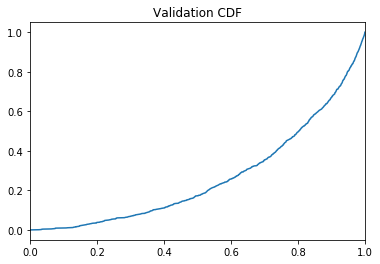

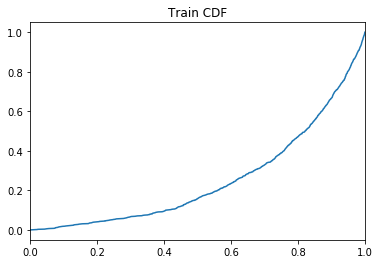

 54%|█████▎    | 507834/946094 [1:08:03<187:50:04,  1.54s/it]

Training AUC at epoch 2: 0.253498
Validation AUC epoch 2: 0.2646789090909091
Training Accuracy at epoch 2: 64.44491666666667
Validation Accuracy epoch 2: 64.42670833333334


 59%|█████▉    | 557794/946094 [1:13:18<36:07, 179.13it/s]   

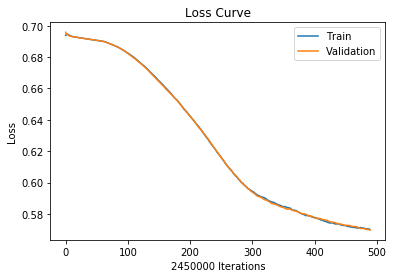

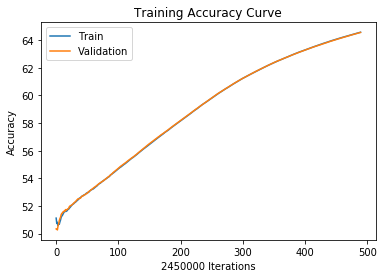

 59%|█████▉    | 557794/946094 [1:13:32<36:07, 179.13it/s]

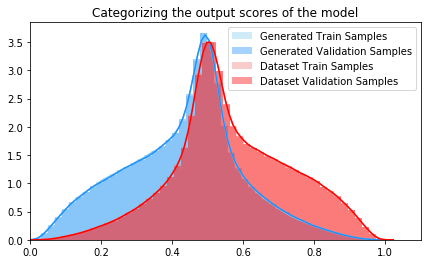

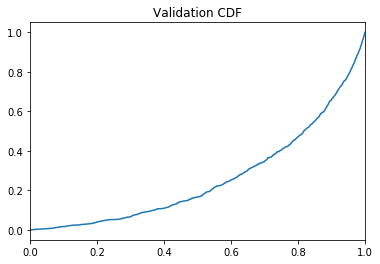

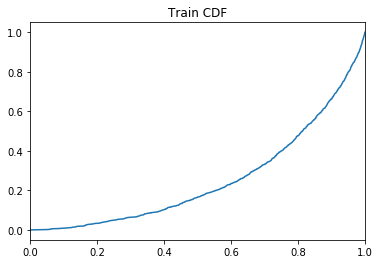

 59%|█████▉    | 557831/946094 [1:14:31<92:20:30,  1.17it/s] 

Training AUC at epoch 2: 0.25341500000000006
Validation AUC epoch 2: 0.25922190909090914
Training Accuracy at epoch 2: 64.56767346938776
Validation Accuracy epoch 2: 64.55240816326531


 64%|██████▍   | 607808/946094 [1:19:59<40:39, 138.67it/s]  

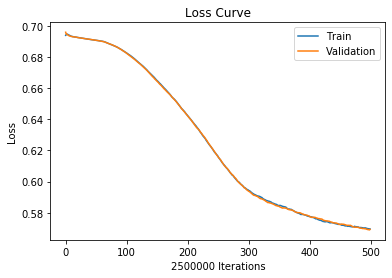

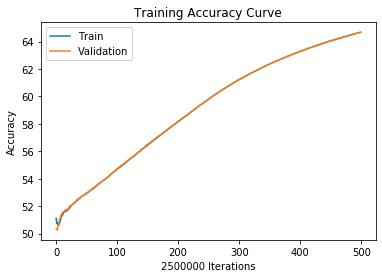

 64%|██████▍   | 607808/946094 [1:20:13<40:39, 138.67it/s]

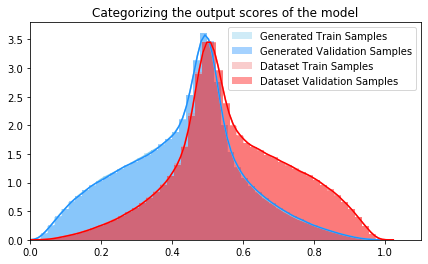

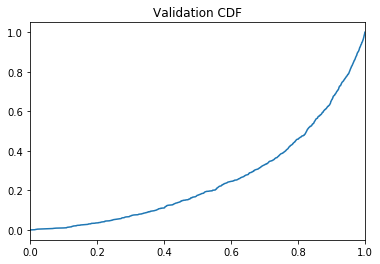

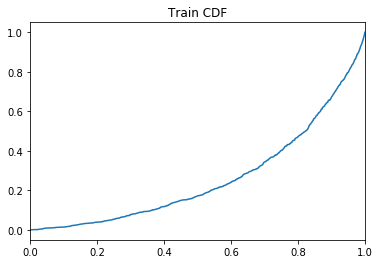

 64%|██████▍   | 607833/946094 [1:21:12<360:58:32,  3.84s/it]

Training AUC at epoch 2: 0.2604655454545455
Validation AUC epoch 2: 0.25487672727272725
Training Accuracy at epoch 2: 64.68472
Validation Accuracy epoch 2: 64.67048


 70%|██████▉   | 657802/946094 [1:26:38<29:54, 160.70it/s]   

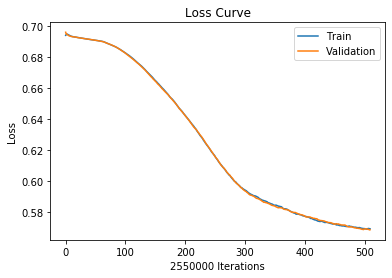

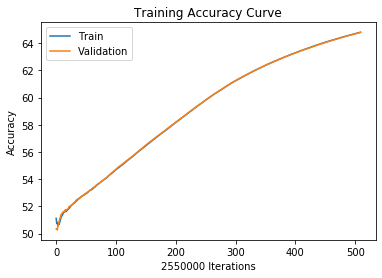

 70%|██████▉   | 657802/946094 [1:26:53<29:54, 160.70it/s]

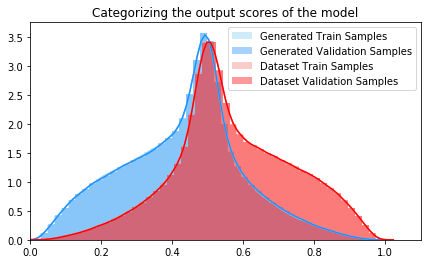

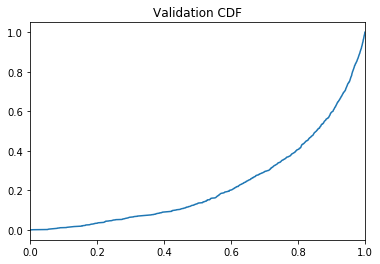

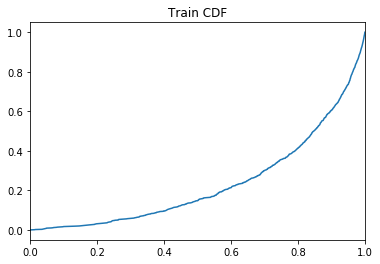

 70%|██████▉   | 657812/946094 [1:27:51<174:21:51,  2.18s/it]

Training AUC at epoch 2: 0.23269063636363635
Validation AUC epoch 2: 0.22738354545454548
Training Accuracy at epoch 2: 64.80023529411764
Validation Accuracy epoch 2: 64.78639215686275


 75%|███████▍  | 707805/946094 [1:33:20<24:47, 160.22it/s]   

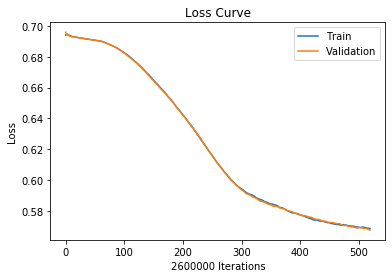

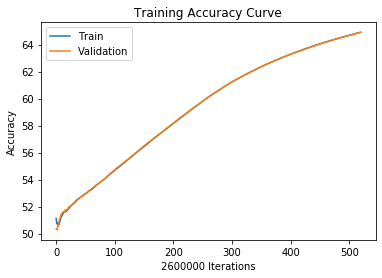

 75%|███████▍  | 707805/946094 [1:33:33<24:47, 160.22it/s]

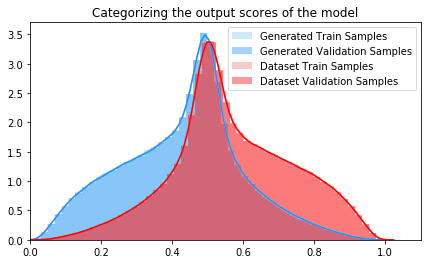

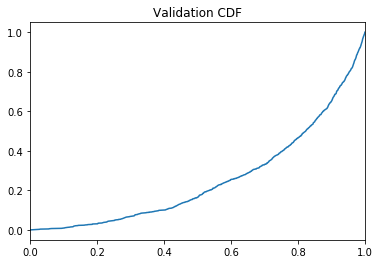

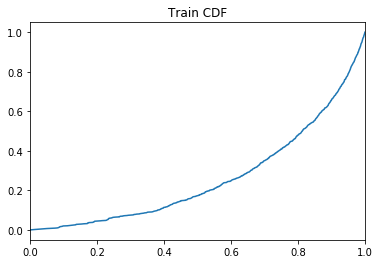

 75%|███████▍  | 707832/946094 [1:34:34<147:04:33,  2.22s/it]

Training AUC at epoch 2: 0.261193
Validation AUC epoch 2: 0.2547558181818182
Training Accuracy at epoch 2: 64.91542307692308
Validation Accuracy epoch 2: 64.89980769230769


 80%|████████  | 757810/946094 [1:40:06<20:53, 150.22it/s]   

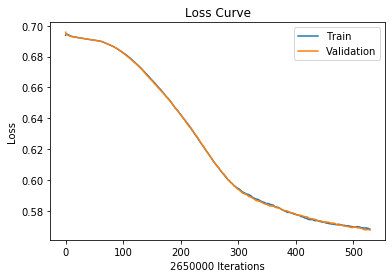

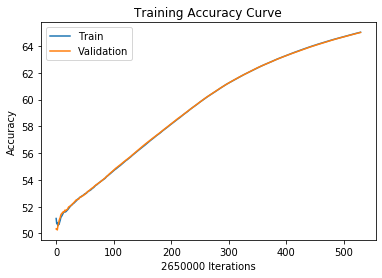

 80%|████████  | 757810/946094 [1:40:23<20:53, 150.22it/s]

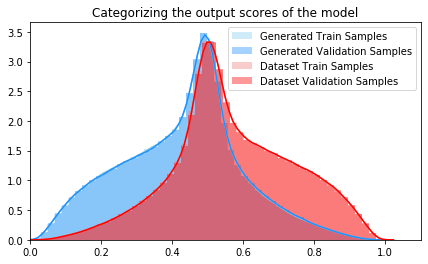

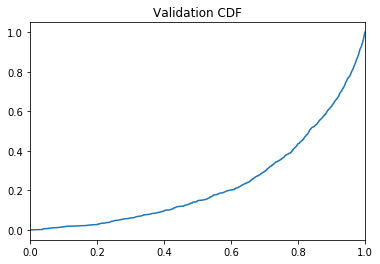

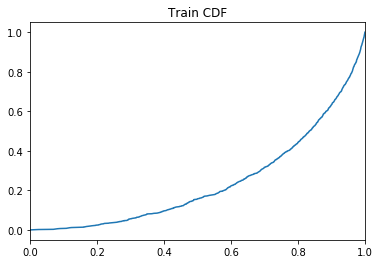

 80%|████████  | 757833/946094 [1:41:19<402:02:20,  7.69s/it]

Training AUC at epoch 2: 0.239543
Validation AUC epoch 2: 0.2355277272727273
Training Accuracy at epoch 2: 65.02441509433962
Validation Accuracy epoch 2: 65.00875471698113


 85%|████████▌ | 807794/946094 [1:46:47<18:59, 121.39it/s]   

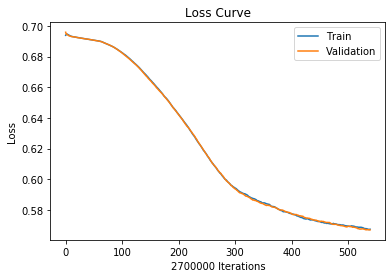

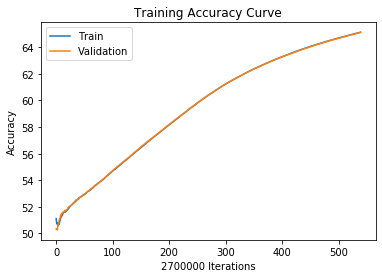

 85%|████████▌ | 807794/946094 [1:47:03<18:59, 121.39it/s]

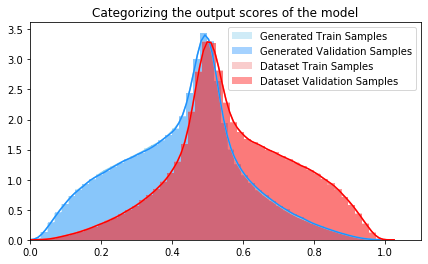

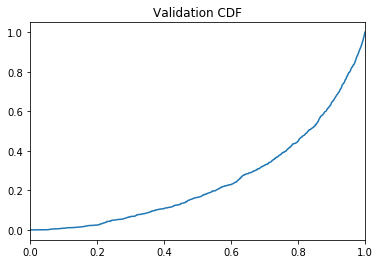

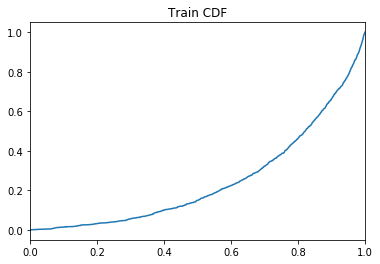

 85%|████████▌ | 807833/946094 [1:48:01<33:07:17,  1.16it/s]

Training AUC at epoch 2: 0.24696427272727273
Validation AUC epoch 2: 0.24842881818181817
Training Accuracy at epoch 2: 65.13303703703704
Validation Accuracy epoch 2: 65.11611111111111


 91%|█████████ | 857793/946094 [1:53:27<10:02, 146.55it/s]  

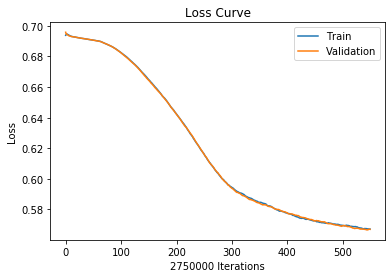

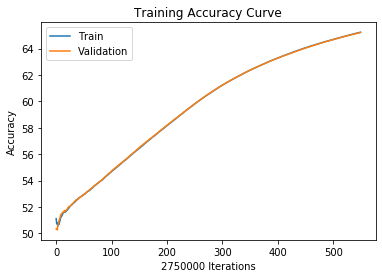

 91%|█████████ | 857793/946094 [1:53:43<10:02, 146.55it/s]

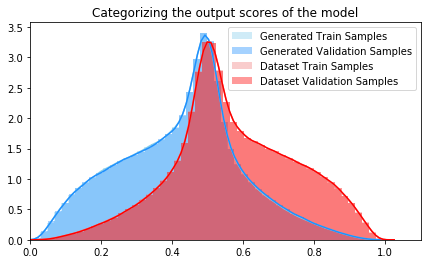

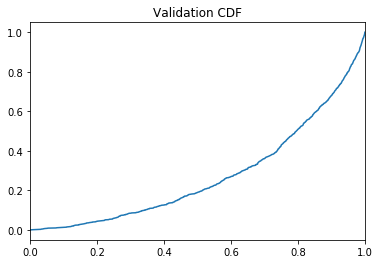

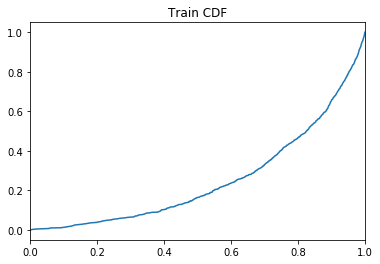

 91%|█████████ | 857812/946094 [1:54:41<28:37:40,  1.17s/it]

Training AUC at epoch 2: 0.2525466363636364
Validation AUC epoch 2: 0.27321836363636365
Training Accuracy at epoch 2: 65.23563636363636
Validation Accuracy epoch 2: 65.21450909090909


 96%|█████████▌| 907806/946094 [2:00:01<03:33, 179.66it/s]  

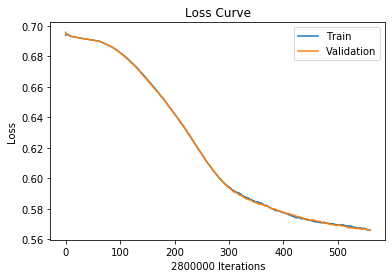

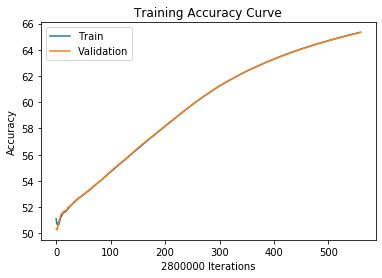

 96%|█████████▌| 907806/946094 [2:00:13<03:33, 179.66it/s]

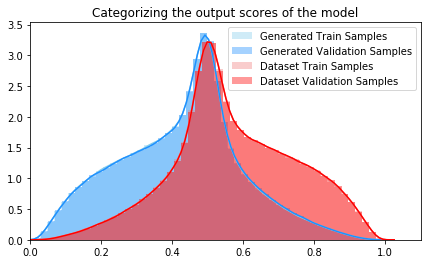

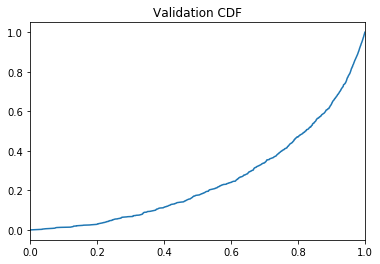

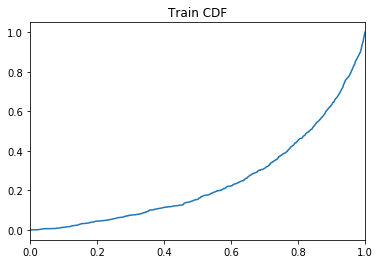

 96%|█████████▌| 907834/946094 [2:01:15<27:39:52,  2.60s/it]

Training AUC at epoch 2: 0.2467768181818182
Validation AUC epoch 2: 0.25488863636363635
Training Accuracy at epoch 2: 65.33421428571428
Validation Accuracy epoch 2: 65.31632142857143


  0%|          | 22/946094 [00:00<1:14:29, 211.65it/s]

Saving to:  model_checkpoints/binary/OHBioNet/07062020.pth
Starting epoch: 3  with learning rate:  [0.01]


  1%|          | 11715/946094 [01:17<1:57:38, 132.38it/s]

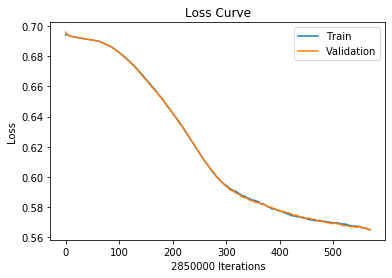

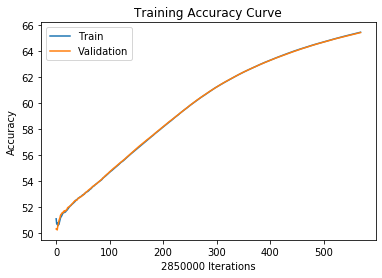

  1%|          | 11715/946094 [01:30<1:57:38, 132.38it/s]

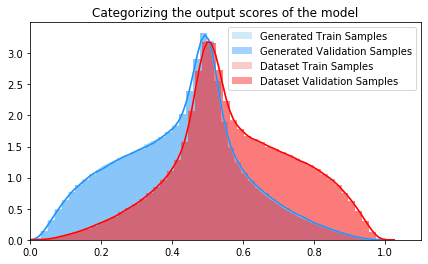

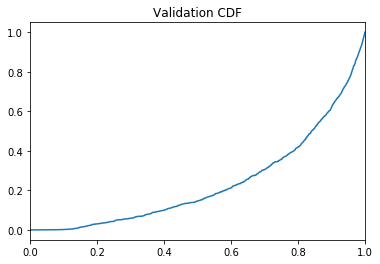

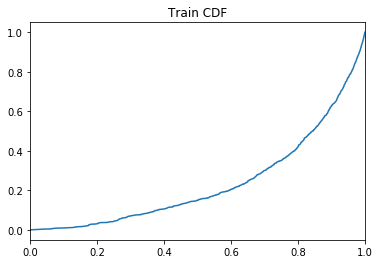

  1%|          | 11739/946094 [02:31<1330:39:53,  5.13s/it]

Training AUC at epoch 3: 0.23634681818181819
Validation AUC epoch 3: 0.23552345454545454
Training Accuracy at epoch 3: 65.43733333333333
Validation Accuracy epoch 3: 65.41385964912281


  7%|▋         | 61697/946094 [07:51<1:42:44, 143.48it/s]  

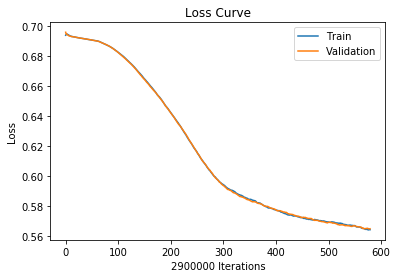

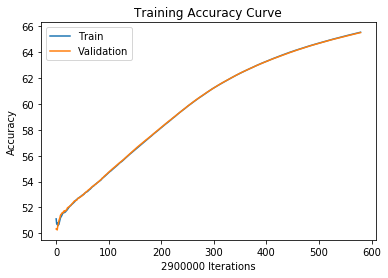

  7%|▋         | 61697/946094 [08:10<1:42:44, 143.48it/s]

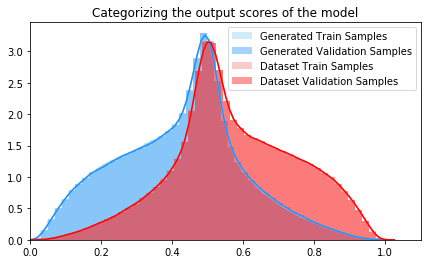

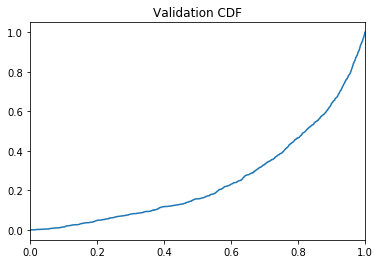

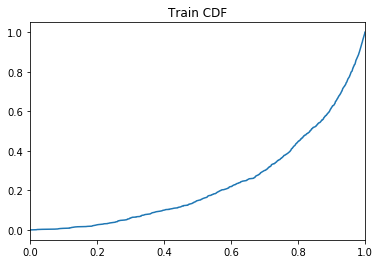

  7%|▋         | 61740/946094 [09:06<184:46:04,  1.33it/s]

Training AUC at epoch 3: 0.23657954545454546
Validation AUC epoch 3: 0.2524529090909091
Training Accuracy at epoch 3: 65.53434482758621
Validation Accuracy epoch 3: 65.50806896551724


 12%|█▏        | 111705/946094 [14:30<1:31:31, 151.93it/s]

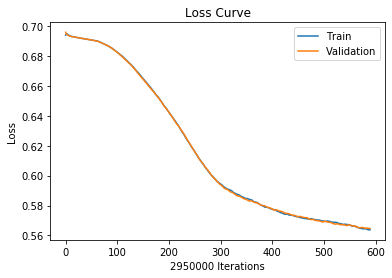

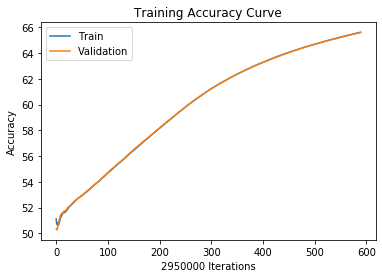

 12%|█▏        | 111705/946094 [14:50<1:31:31, 151.93it/s]

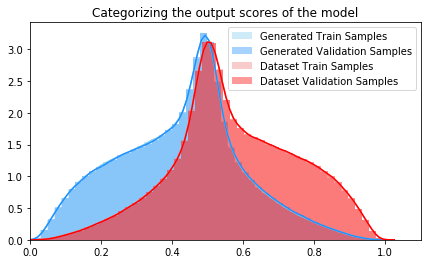

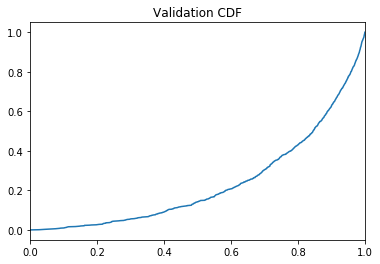

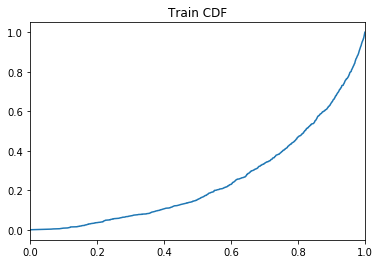

 12%|█▏        | 111718/946094 [15:45<401:03:32,  1.73s/it]

Training AUC at epoch 3: 0.2513197272727273
Validation AUC epoch 3: 0.23456109090909089
Training Accuracy at epoch 3: 65.62722033898305
Validation Accuracy epoch 3: 65.59986440677966


 17%|█▋        | 161710/946094 [21:10<1:10:06, 186.48it/s] 

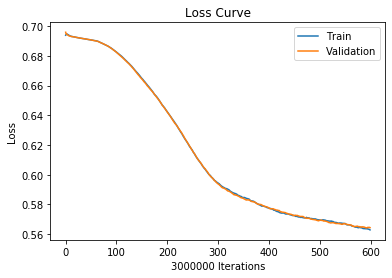

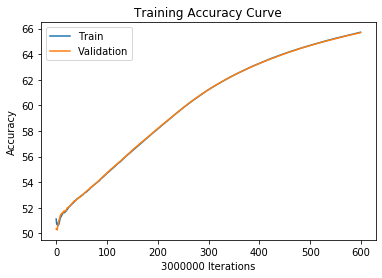

 17%|█▋        | 161710/946094 [21:30<1:10:06, 186.48it/s]

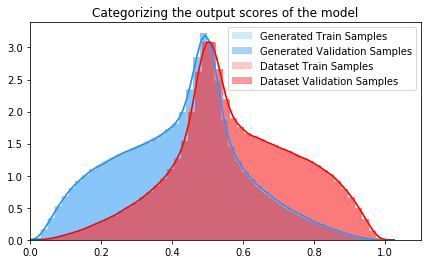

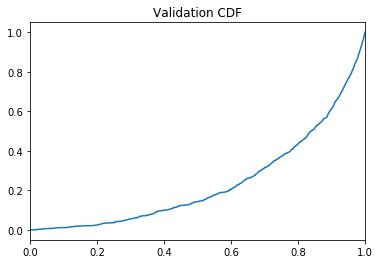

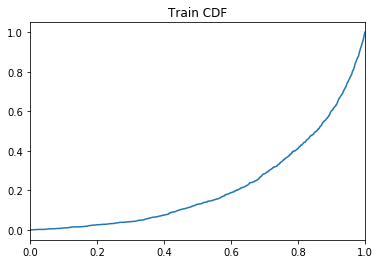

 17%|█▋        | 161739/946094 [22:25<427:08:37,  1.96s/it]

Training AUC at epoch 3: 0.22084563636363636
Validation AUC epoch 3: 0.23573054545454547
Training Accuracy at epoch 3: 65.71983333333333
Validation Accuracy epoch 3: 65.68633333333334


 22%|██▏       | 211702/946094 [27:53<1:36:55, 126.28it/s] 

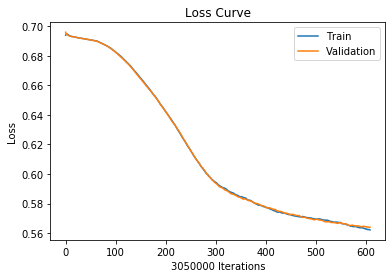

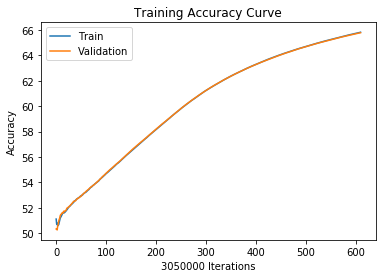

 22%|██▏       | 211702/946094 [28:10<1:36:55, 126.28it/s]

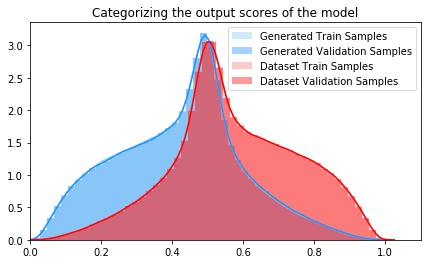

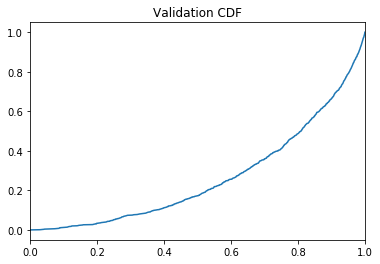

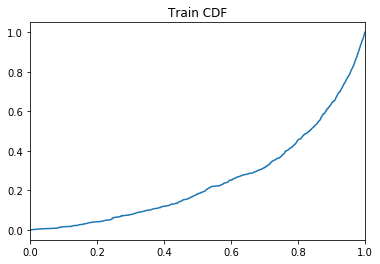

 22%|██▏       | 211739/946094 [29:10<205:29:22,  1.01s/it]

Training AUC at epoch 3: 0.2543975454545454
Validation AUC epoch 3: 0.26347418181818183
Training Accuracy at epoch 3: 65.81016393442623
Validation Accuracy epoch 3: 65.77268852459017


 28%|██▊       | 261701/946094 [34:38<1:33:36, 121.85it/s] 

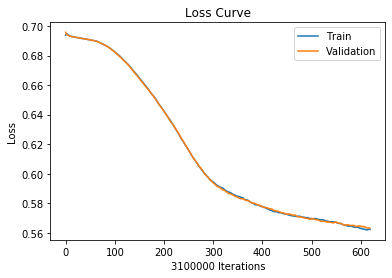

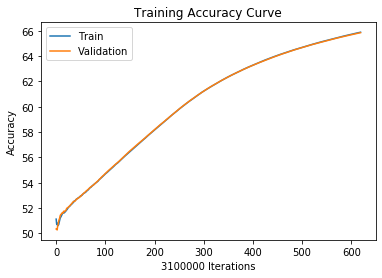

 28%|██▊       | 261701/946094 [34:50<1:33:36, 121.85it/s]

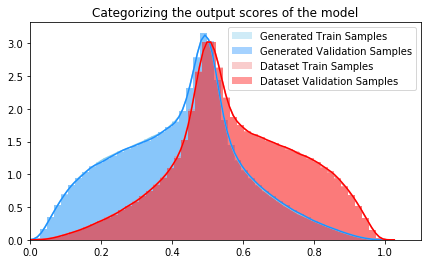

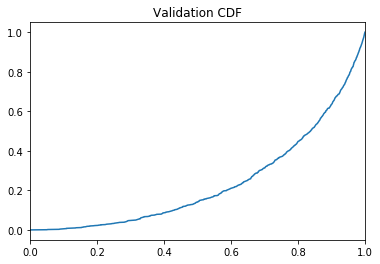

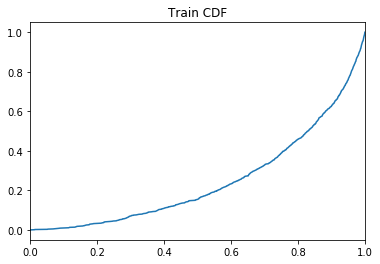

 28%|██▊       | 261740/946094 [35:54<180:07:25,  1.06it/s]

Training AUC at epoch 3: 0.24716054545454544
Validation AUC epoch 3: 0.23540963636363638
Training Accuracy at epoch 3: 65.89348387096774
Validation Accuracy epoch 3: 65.85974193548387


 33%|███▎      | 311714/946094 [41:21<1:04:21, 164.28it/s] 

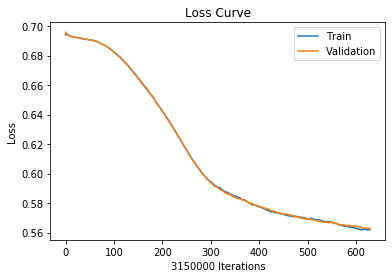

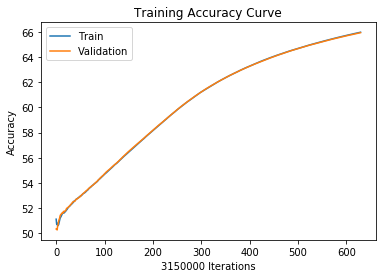

 33%|███▎      | 311714/946094 [41:40<1:04:21, 164.28it/s]

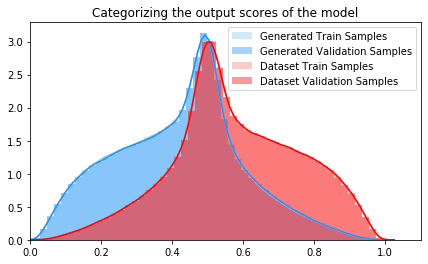

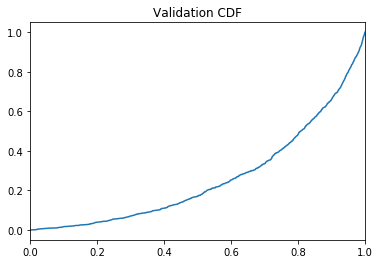

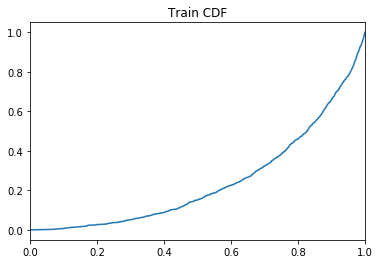

 33%|███▎      | 311718/946094 [42:38<1008:28:45,  5.72s/it]

Training AUC at epoch 3: 0.24433900000000003
Validation AUC epoch 3: 0.2601732727272727
Training Accuracy at epoch 3: 65.9786984126984
Validation Accuracy epoch 3: 65.9455873015873


 38%|███▊      | 361697/946094 [48:05<59:56, 162.51it/s]    

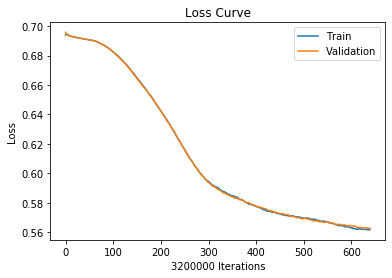

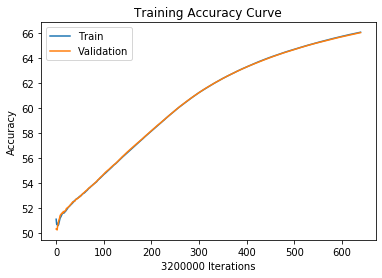

 38%|███▊      | 361697/946094 [48:20<59:56, 162.51it/s]

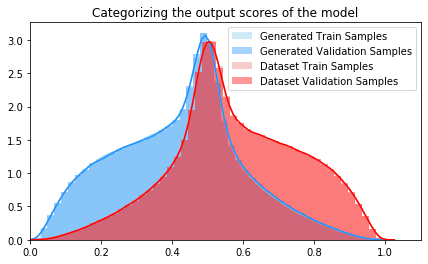

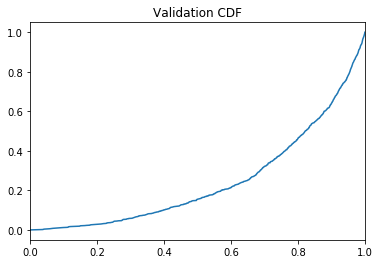

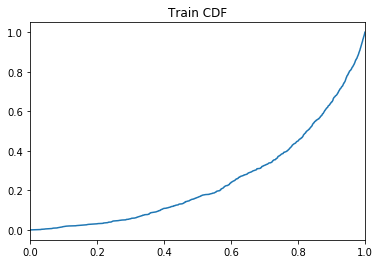

 38%|███▊      | 361737/946094 [49:24<130:01:22,  1.25it/s]

Training AUC at epoch 3: 0.2487070909090909
Validation AUC epoch 3: 0.24495
Training Accuracy at epoch 3: 66.055875
Validation Accuracy epoch 3: 66.02665625


 44%|████▎     | 411702/946094 [54:49<1:06:29, 133.95it/s] 

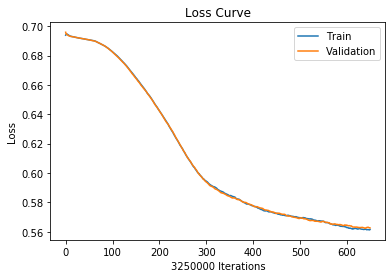

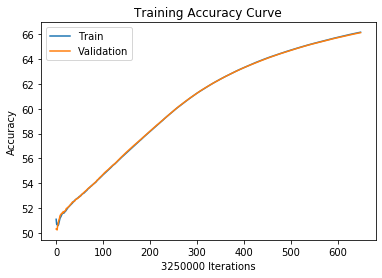

 44%|████▎     | 411702/946094 [55:00<1:06:29, 133.95it/s]

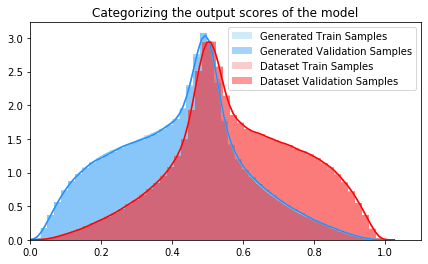

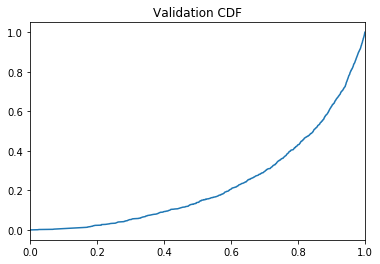

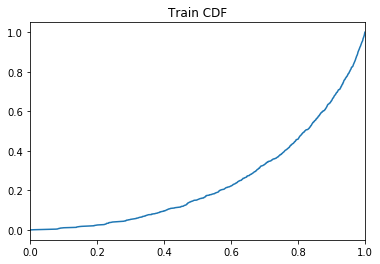

 44%|████▎     | 411740/946094 [56:07<151:35:04,  1.02s/it]

Training AUC at epoch 3: 0.24588427272727273
Validation AUC epoch 3: 0.2311037272727273
Training Accuracy at epoch 3: 66.1348
Validation Accuracy epoch 3: 66.10212307692308


 49%|████▉     | 461709/946094 [1:01:35<52:43, 153.11it/s]  

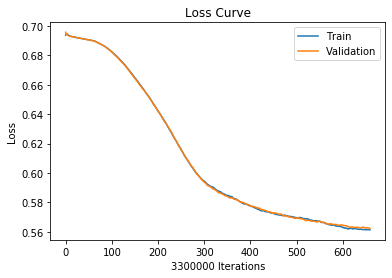

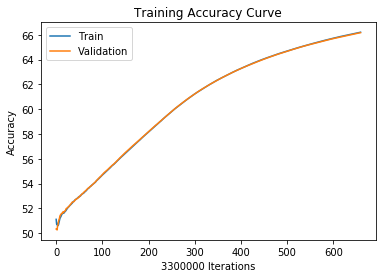

 49%|████▉     | 461709/946094 [1:01:50<52:43, 153.11it/s]

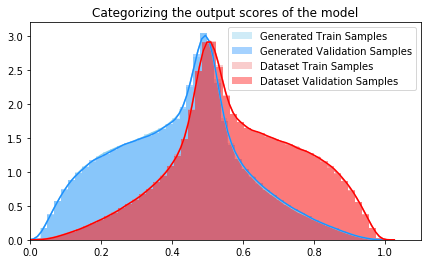

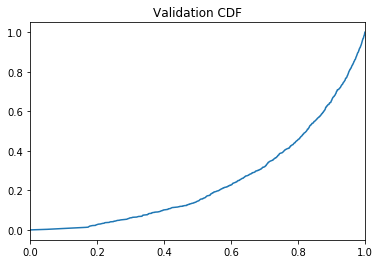

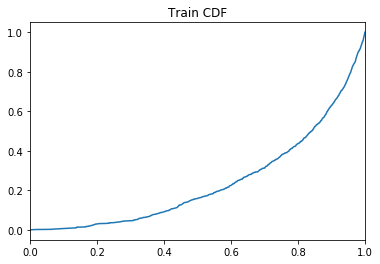

 49%|████▉     | 461740/946094 [1:02:53<244:09:42,  1.81s/it]

Training AUC at epoch 3: 0.23946854545454546
Validation AUC epoch 3: 0.2464247272727273
Training Accuracy at epoch 3: 66.21109090909091
Validation Accuracy epoch 3: 66.17660606060606


 54%|█████▍    | 511710/946094 [1:08:16<42:02, 172.22it/s]   

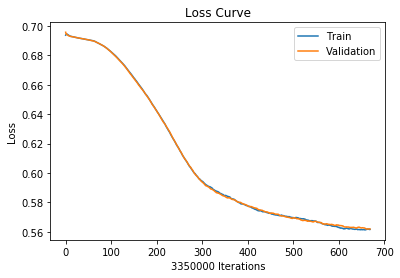

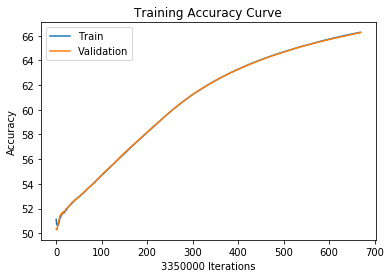

 54%|█████▍    | 511710/946094 [1:08:31<42:02, 172.22it/s]

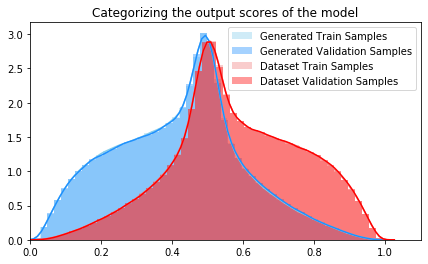

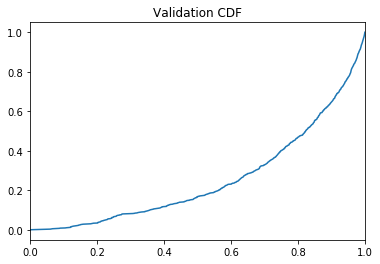

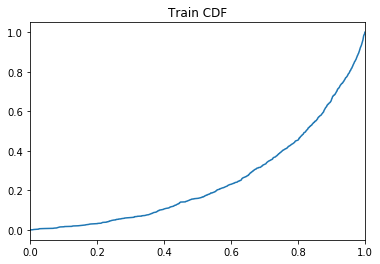

 54%|█████▍    | 511718/946094 [1:09:34<353:29:17,  2.93s/it]

Training AUC at epoch 3: 0.25132781818181815
Validation AUC epoch 3: 0.25484781818181823
Training Accuracy at epoch 3: 66.28549253731343
Validation Accuracy epoch 3: 66.25205970149254


 59%|█████▉    | 561714/946094 [1:15:00<38:44, 165.38it/s]   

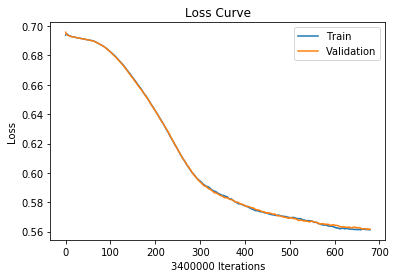

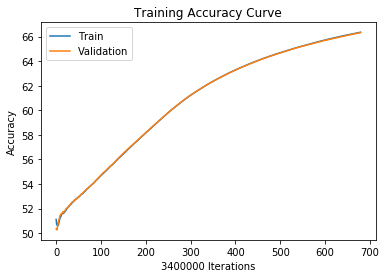

 59%|█████▉    | 561714/946094 [1:15:11<38:44, 165.38it/s]

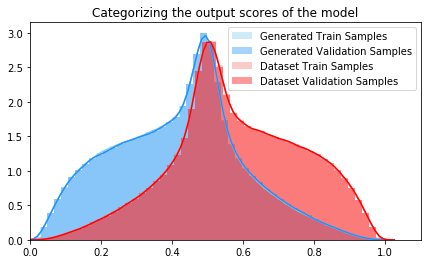

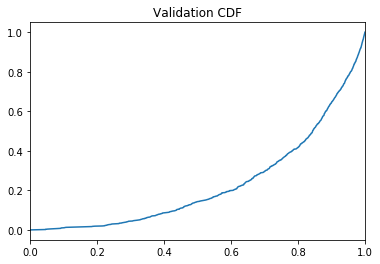

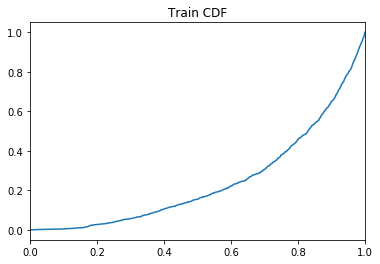

 59%|█████▉    | 561741/946094 [1:16:19<442:27:07,  4.14s/it]

Training AUC at epoch 3: 0.24391909090909092
Validation AUC epoch 3: 0.23070072727272728
Training Accuracy at epoch 3: 66.35914705882352
Validation Accuracy epoch 3: 66.32514705882353


 65%|██████▍   | 611706/946094 [1:21:40<40:04, 139.06it/s]   

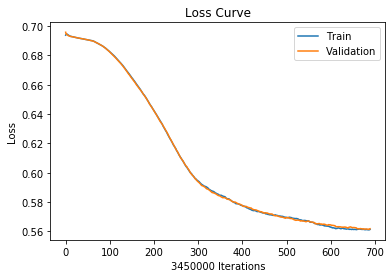

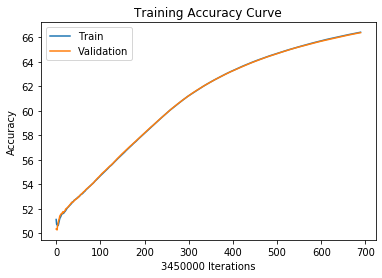

 65%|██████▍   | 611706/946094 [1:21:51<40:04, 139.06it/s]

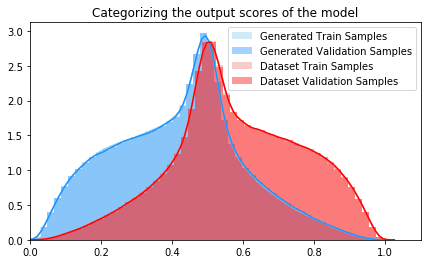

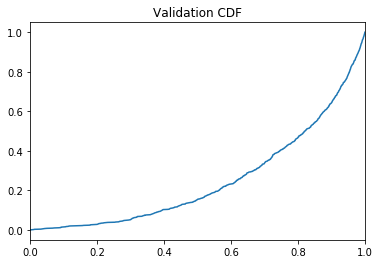

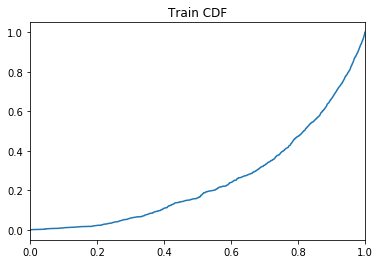

 65%|██████▍   | 611737/946094 [1:22:58<127:40:22,  1.37s/it]

Training AUC at epoch 3: 0.25283154545454545
Validation AUC epoch 3: 0.24987272727272727
Training Accuracy at epoch 3: 66.42753623188406
Validation Accuracy epoch 3: 66.39327536231885


 70%|██████▉   | 661710/946094 [1:28:21<32:31, 145.70it/s]   

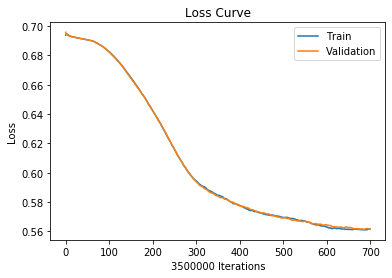

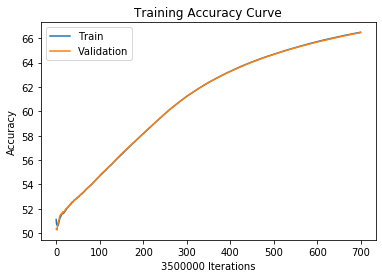

 70%|██████▉   | 661710/946094 [1:28:31<32:31, 145.70it/s]

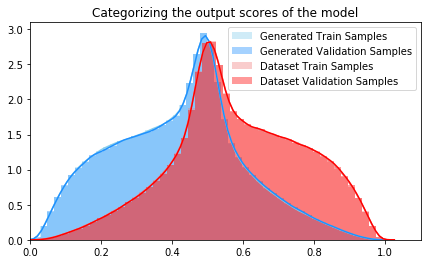

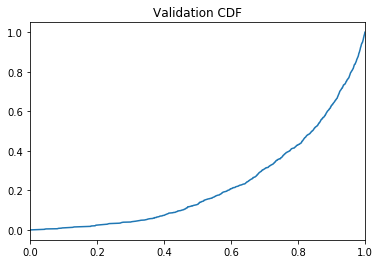

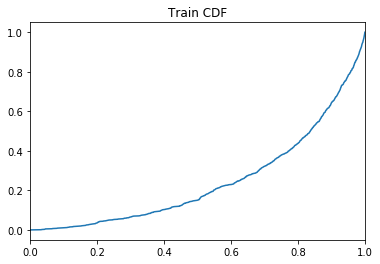

 70%|██████▉   | 661739/946094 [1:29:39<162:51:43,  2.06s/it]

Training AUC at epoch 3: 0.24548345454545456
Validation AUC epoch 3: 0.22988354545454542
Training Accuracy at epoch 3: 66.4962
Validation Accuracy epoch 3: 66.4634


 75%|███████▌  | 711696/946094 [1:35:02<26:01, 150.14it/s]   

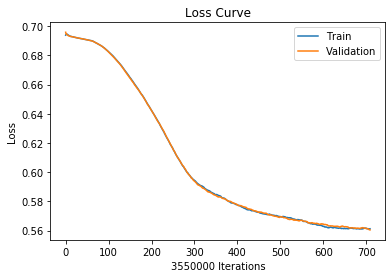

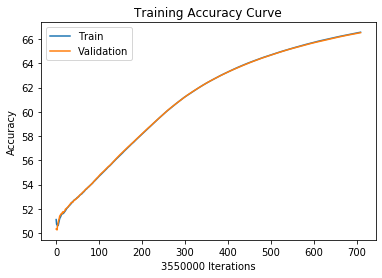

 75%|███████▌  | 711696/946094 [1:35:21<26:01, 150.14it/s]

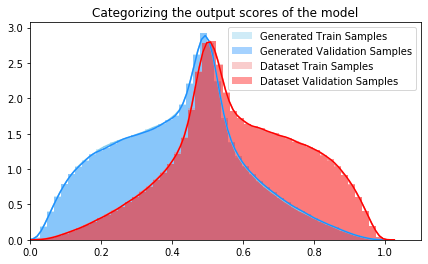

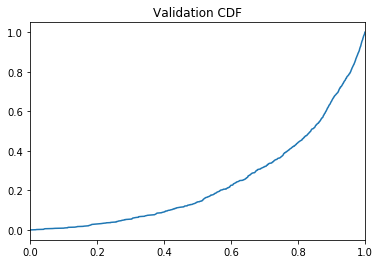

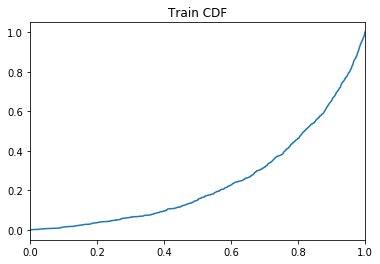

 75%|███████▌  | 711718/946094 [1:36:22<71:17:32,  1.10s/it]

Training AUC at epoch 3: 0.24783727272727274
Validation AUC epoch 3: 0.2409374545454545
Training Accuracy at epoch 3: 66.56484507042254
Validation Accuracy epoch 3: 66.52977464788732


 81%|████████  | 761714/946094 [1:41:49<19:05, 161.01it/s]  

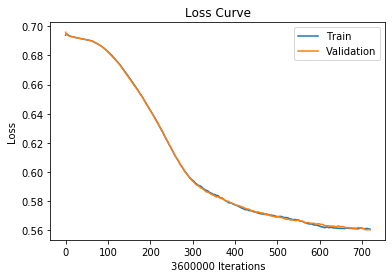

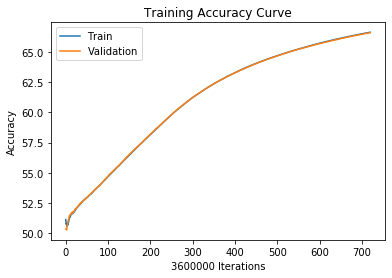

 81%|████████  | 761714/946094 [1:42:01<19:05, 161.01it/s]

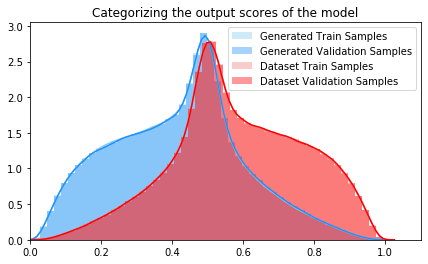

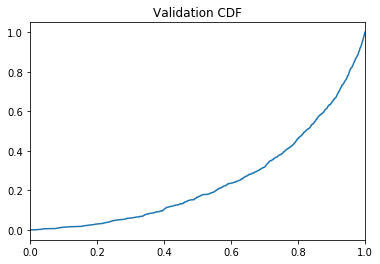

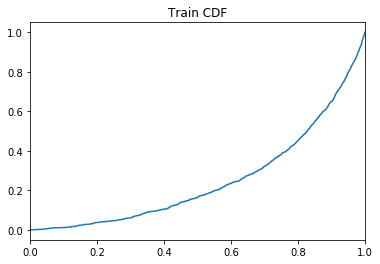

 81%|████████  | 761739/946094 [1:43:10<218:34:16,  4.27s/it]

Training AUC at epoch 3: 0.2506297272727273
Validation AUC epoch 3: 0.24887972727272728
Training Accuracy at epoch 3: 66.63205555555555
Validation Accuracy epoch 3: 66.59547222222223


 86%|████████▌ | 811702/946094 [1:48:36<17:11, 130.29it/s]   

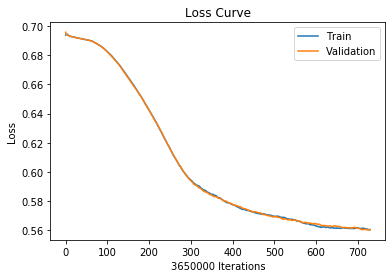

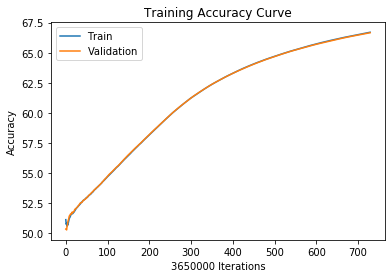

 86%|████████▌ | 811702/946094 [1:48:51<17:11, 130.29it/s]

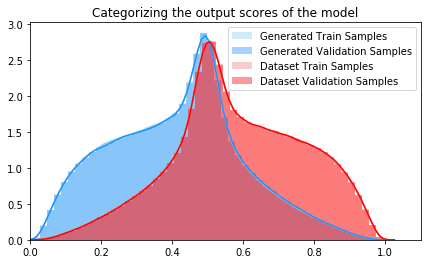

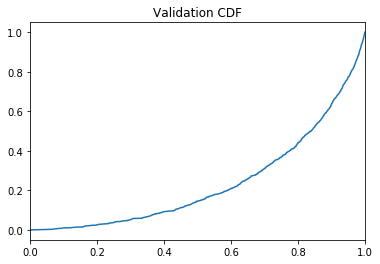

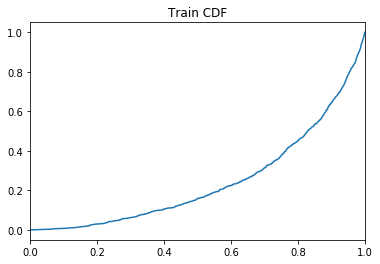

 86%|████████▌ | 811740/946094 [1:49:57<39:42:34,  1.06s/it]

Training AUC at epoch 3: 0.24403445454545453
Validation AUC epoch 3: 0.23590681818181816
Training Accuracy at epoch 3: 66.69931506849315
Validation Accuracy epoch 3: 66.65876712328767


 91%|█████████ | 861716/946094 [1:55:22<08:46, 160.25it/s]  

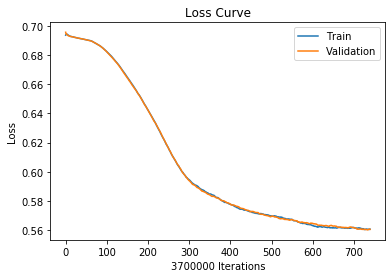

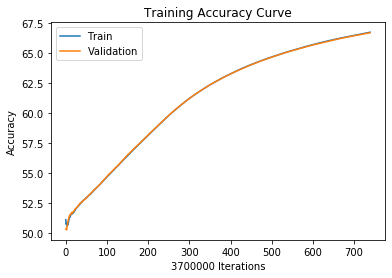

 91%|█████████ | 861716/946094 [1:55:41<08:46, 160.25it/s]

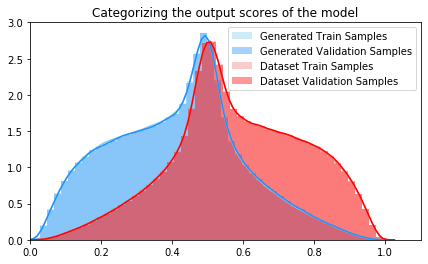

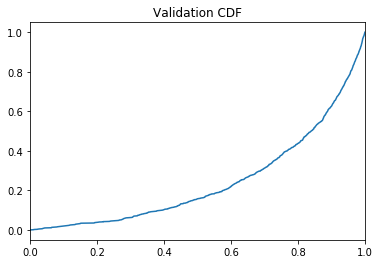

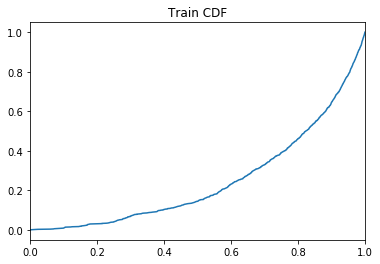

 91%|█████████ | 861739/946094 [1:56:42<198:23:49,  8.47s/it]

Training AUC at epoch 3: 0.24781372727272727
Validation AUC epoch 3: 0.2440082727272727
Training Accuracy at epoch 3: 66.76010810810811
Validation Accuracy epoch 3: 66.72037837837838


 96%|█████████▋| 911698/946094 [2:02:07<03:57, 144.59it/s]   

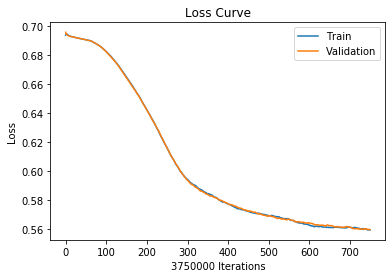

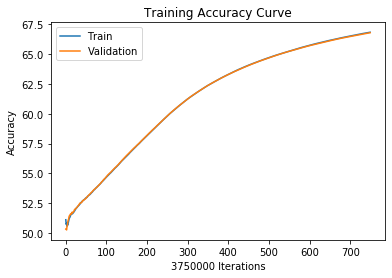

 96%|█████████▋| 911698/946094 [2:02:21<03:57, 144.59it/s]

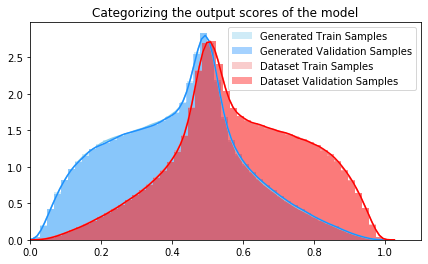

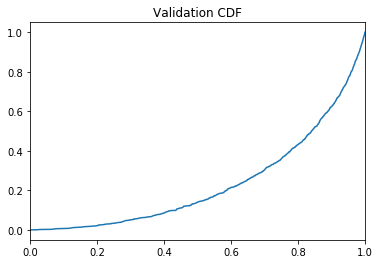

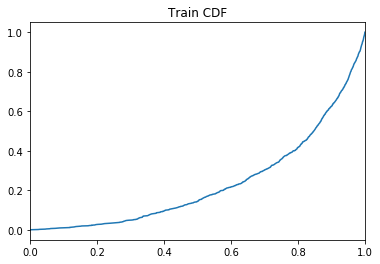

 96%|█████████▋| 911718/946094 [2:03:29<11:44:51,  1.23s/it]

Training AUC at epoch 3: 0.23459009090909091
Validation AUC epoch 3: 0.2323460909090909
Training Accuracy at epoch 3: 66.82021333333333
Validation Accuracy epoch 3: 66.78117333333333


  0%|          | 17/946094 [00:00<1:36:18, 163.74it/s]

Saving to:  model_checkpoints/binary/OHBioNet/07062020.pth
Starting epoch: 4  with learning rate:  [0.01]


  2%|▏         | 15608/946094 [01:39<1:31:13, 169.99it/s]

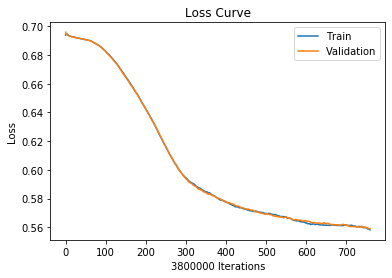

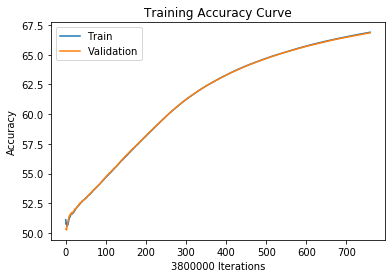

  2%|▏         | 15608/946094 [01:50<1:31:13, 169.99it/s]

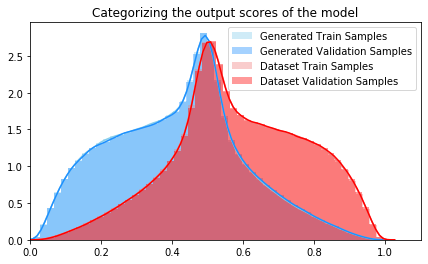

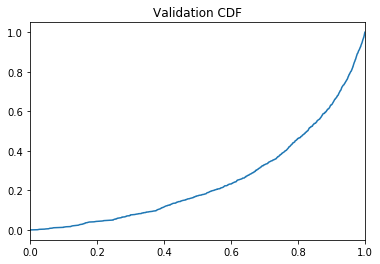

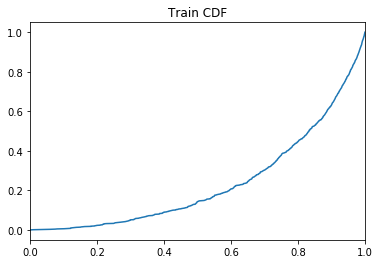

  2%|▏         | 15646/946094 [03:00<276:31:32,  1.07s/it]

Training AUC at epoch 4: 0.23486454545454544
Validation AUC epoch 4: 0.2523460909090909
Training Accuracy at epoch 4: 66.8848947368421
Validation Accuracy epoch 4: 66.84165789473684


  7%|▋         | 65618/946094 [08:33<1:59:59, 122.30it/s] 

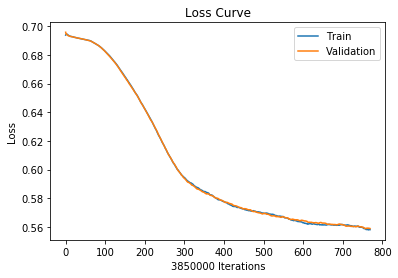

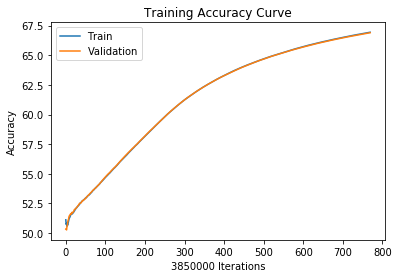

  7%|▋         | 65618/946094 [08:50<1:59:59, 122.30it/s]

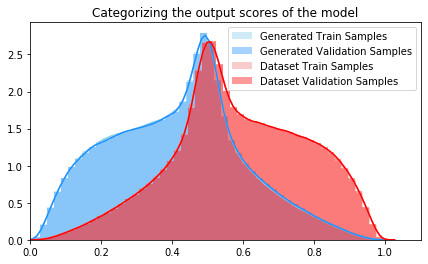

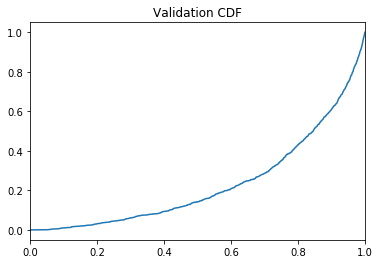

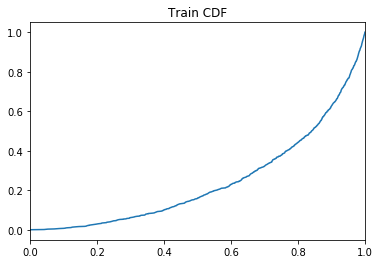

  7%|▋         | 65645/946094 [09:57<720:33:30,  2.95s/it] 

Training AUC at epoch 4: 0.243446
Validation AUC epoch 4: 0.23156827272727276
Training Accuracy at epoch 4: 66.94145454545455
Validation Accuracy epoch 4: 66.90109090909091


 12%|█▏        | 115608/946094 [15:21<1:36:58, 142.72it/s]

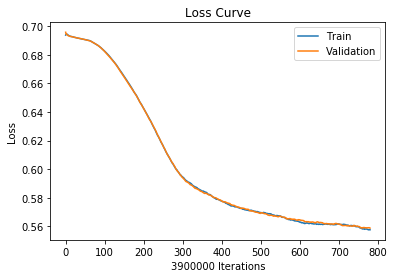

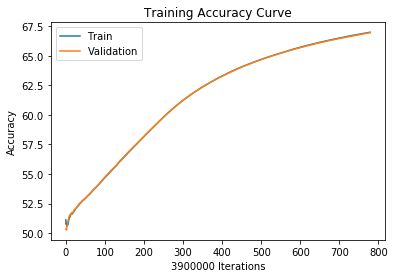

 12%|█▏        | 115608/946094 [15:40<1:36:58, 142.72it/s]

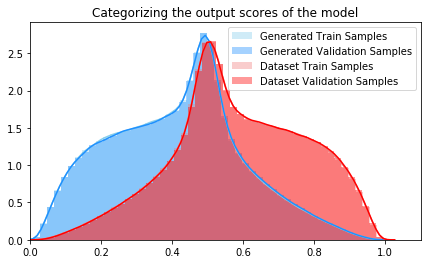

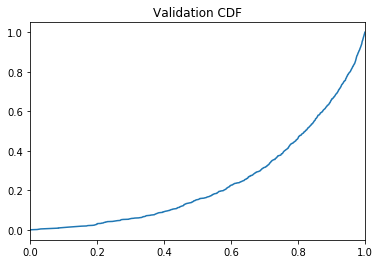

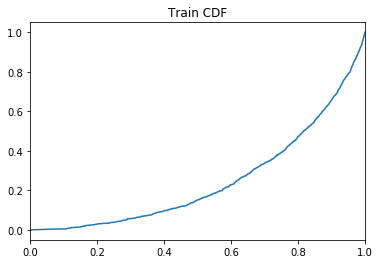

 12%|█▏        | 115646/946094 [16:44<250:15:36,  1.08s/it]

Training AUC at epoch 4: 0.24777945454545455
Validation AUC epoch 4: 0.2452242727272727
Training Accuracy at epoch 4: 66.99684615384615
Validation Accuracy epoch 4: 66.958


 18%|█▊        | 165622/946094 [22:11<1:23:19, 156.12it/s] 

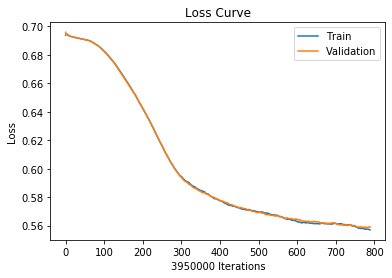

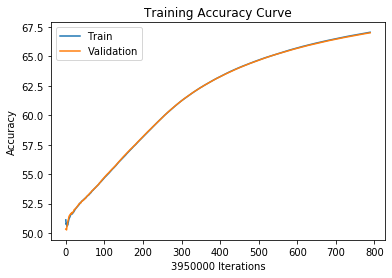

 18%|█▊        | 165622/946094 [22:30<1:23:19, 156.12it/s]

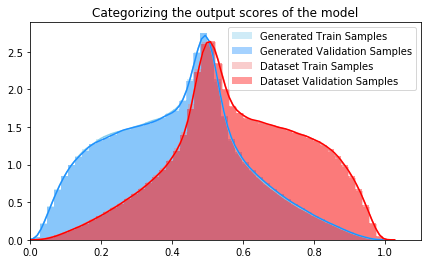

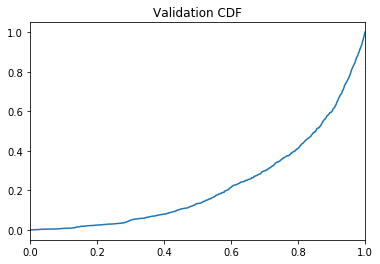

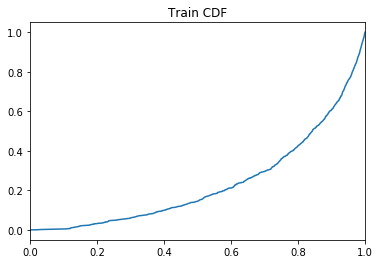

 18%|█▊        | 165624/946094 [23:33<2680:27:12, 12.36s/it]

Training AUC at epoch 4: 0.23423681818181818
Validation AUC epoch 4: 0.2276037272727273
Training Accuracy at epoch 4: 67.0579240506329
Validation Accuracy epoch 4: 67.01141772151898


 23%|██▎       | 215604/946094 [29:02<1:13:33, 165.52it/s]  

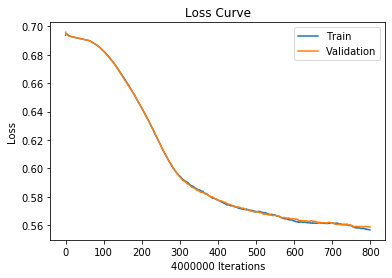

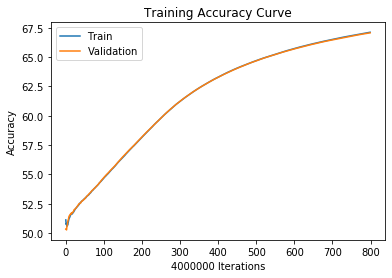

 23%|██▎       | 215604/946094 [29:20<1:13:33, 165.52it/s]

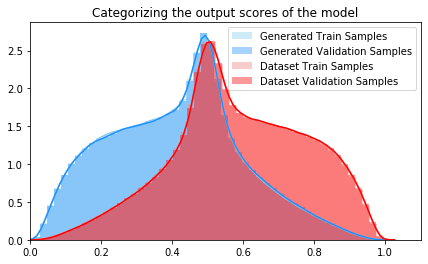

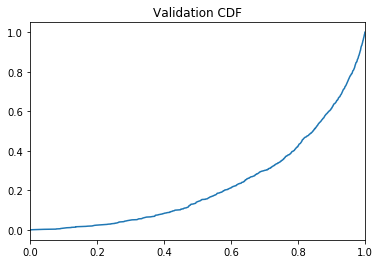

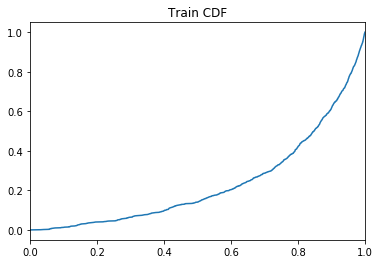

 23%|██▎       | 215646/946094 [30:24<176:26:38,  1.15it/s]

Training AUC at epoch 4: 0.23351472727272726
Validation AUC epoch 4: 0.23013381818181816
Training Accuracy at epoch 4: 67.116075
Validation Accuracy epoch 4: 67.065175


 28%|██▊       | 265617/946094 [35:51<1:24:34, 134.09it/s] 

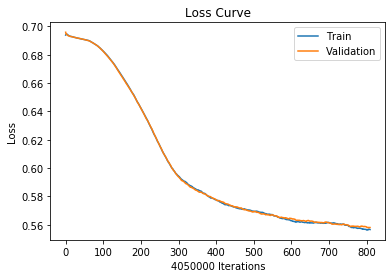

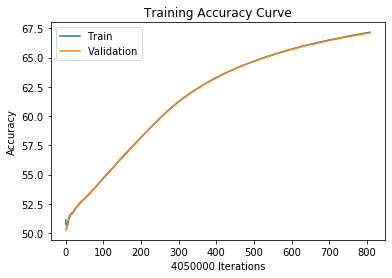

 28%|██▊       | 265617/946094 [36:10<1:24:34, 134.09it/s]

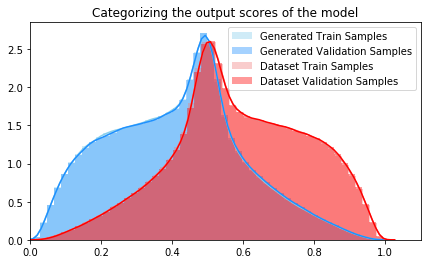

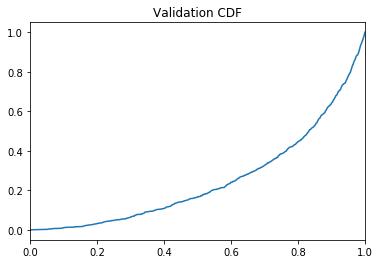

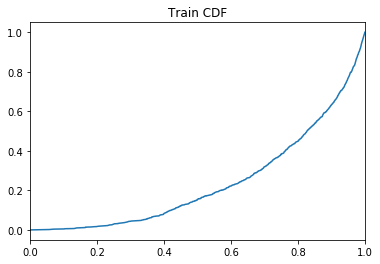

 28%|██▊       | 265645/946094 [37:15<480:41:02,  2.54s/it]

Training AUC at epoch 4: 0.23796718181818183
Validation AUC epoch 4: 0.24994127272727273
Training Accuracy at epoch 4: 67.16869135802469
Validation Accuracy epoch 4: 67.11916049382717


 33%|███▎      | 307862/946094 [41:51<1:14:41, 142.42it/s] IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 49%|████▉     | 465618/946094 [1:03:11<59:50, 133.82it/s]  

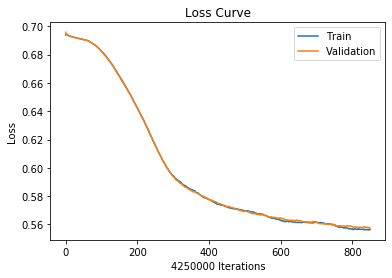

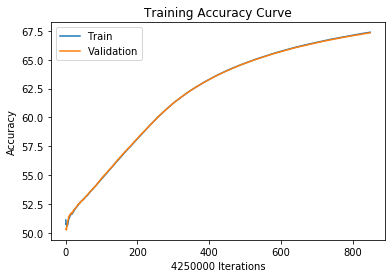

 49%|████▉     | 465618/946094 [1:03:31<59:50, 133.82it/s]

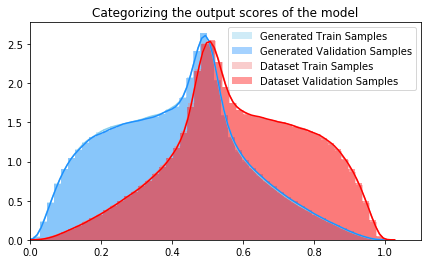

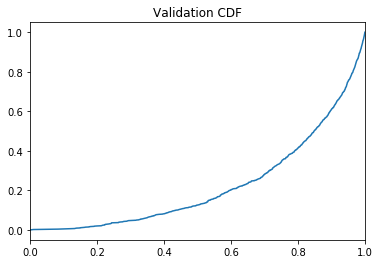

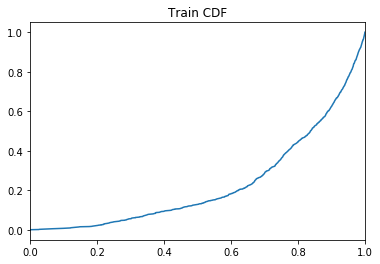

 49%|████▉     | 465646/946094 [1:04:36<399:47:06,  3.00s/it]

Training AUC at epoch 4: 0.23004136363636368
Validation AUC epoch 4: 0.22304599999999997
Training Accuracy at epoch 4: 67.37289411764706
Validation Accuracy epoch 4: 67.32538823529411


 54%|█████▍    | 511308/946094 [1:09:35<57:06, 126.91it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



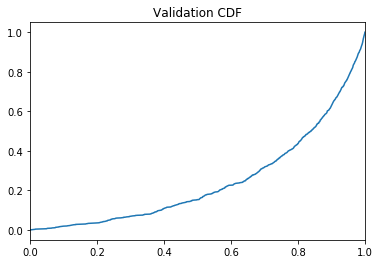

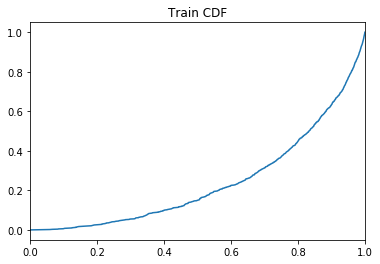

 65%|██████▌   | 615644/946094 [1:25:15<105:41:45,  1.15s/it]

Training AUC at epoch 4: 0.24028245454545455
Validation AUC epoch 4: 0.24449809090909091
Training Accuracy at epoch 4: 67.51595454545455
Validation Accuracy epoch 4: 67.46865909090909


 70%|███████   | 665610/946094 [1:30:46<34:38, 134.93it/s]   

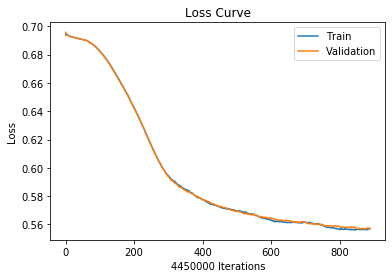

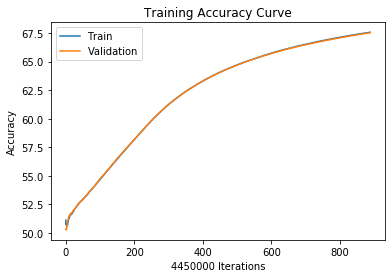

 70%|███████   | 665610/946094 [1:31:01<34:38, 134.93it/s]

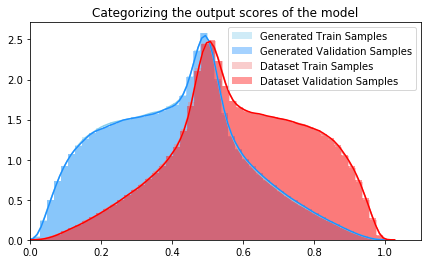

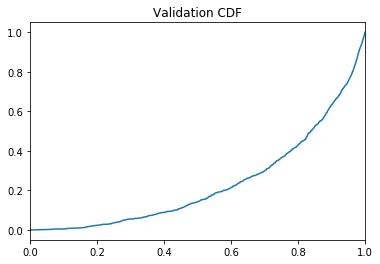

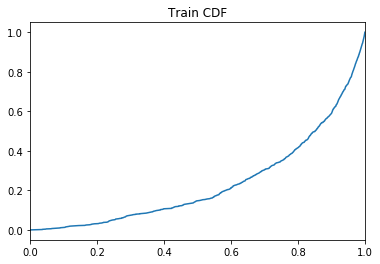

 70%|███████   | 665645/946094 [1:32:13<102:23:06,  1.31s/it]

Training AUC at epoch 4: 0.23398590909090908
Validation AUC epoch 4: 0.23351645454545455
Training Accuracy at epoch 4: 67.56094382022472
Validation Accuracy epoch 4: 67.51316853932585


 76%|███████▌  | 715602/946094 [1:37:40<25:43, 149.33it/s]   

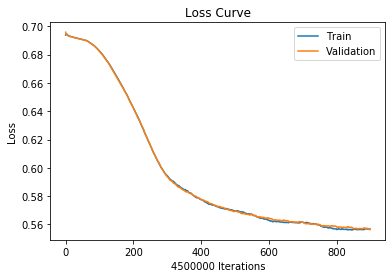

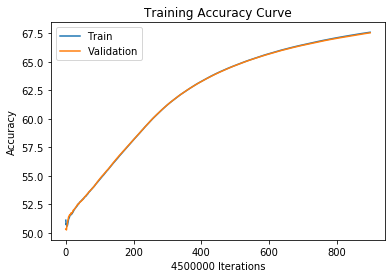

 76%|███████▌  | 715602/946094 [1:37:51<25:43, 149.33it/s]

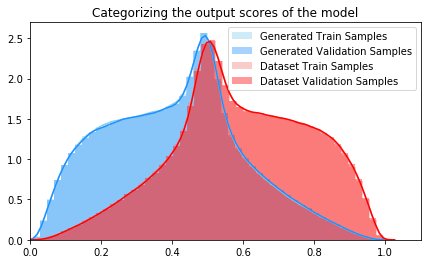

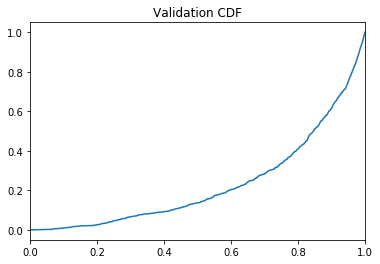

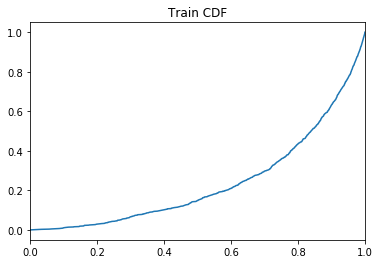

 76%|███████▌  | 715645/946094 [1:39:07<53:06:25,  1.21it/s]

Training AUC at epoch 4: 0.23799618181818183
Validation AUC epoch 4: 0.22929909090909092
Training Accuracy at epoch 4: 67.60737777777777
Validation Accuracy epoch 4: 67.55853333333333


 81%|████████  | 765613/946094 [1:44:33<21:17, 141.24it/s]  

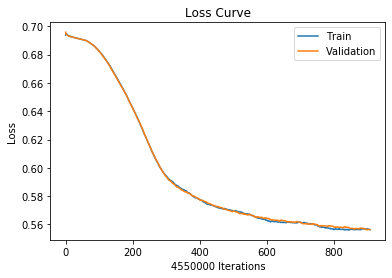

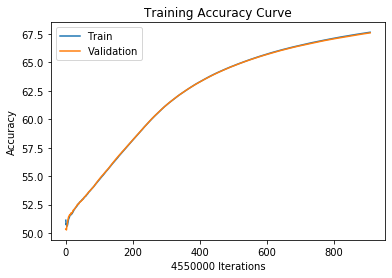

 81%|████████  | 765613/946094 [1:44:51<21:17, 141.24it/s]

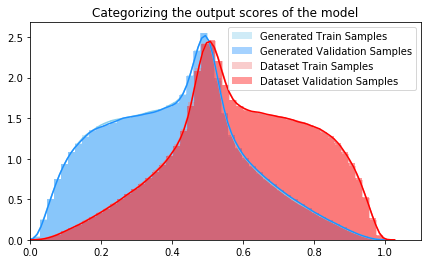

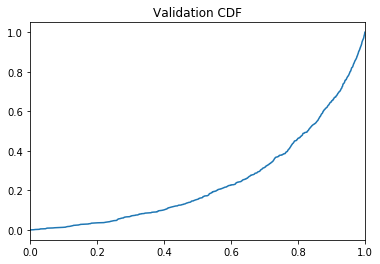

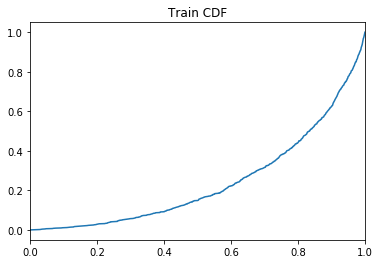

 81%|████████  | 765624/946094 [1:46:01<120:22:46,  2.40s/it]

Training AUC at epoch 4: 0.2409568181818182
Validation AUC epoch 4: 0.24778363636363634
Training Accuracy at epoch 4: 67.65424175824175
Validation Accuracy epoch 4: 67.6016923076923


 86%|████████▌ | 815604/946094 [1:51:26<13:21, 162.76it/s]   

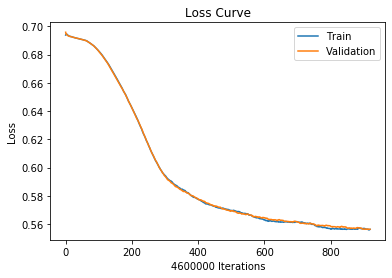

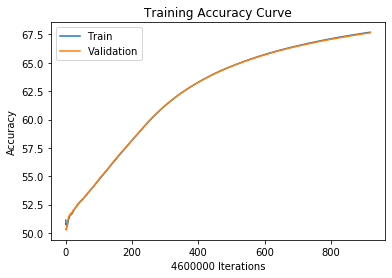

 86%|████████▌ | 815604/946094 [1:51:42<13:21, 162.76it/s]

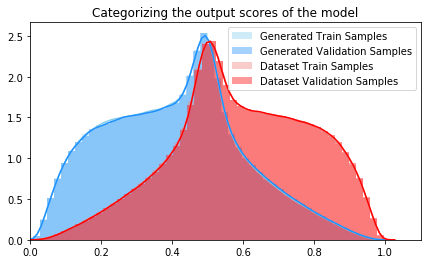

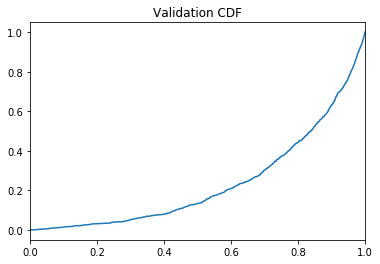

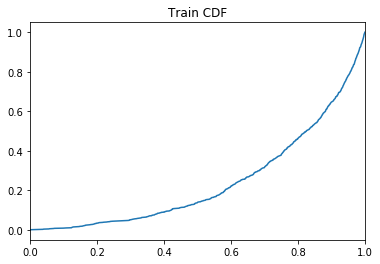

 86%|████████▌ | 815646/946094 [1:52:54<33:24:46,  1.08it/s]

Training AUC at epoch 4: 0.24147245454545457
Validation AUC epoch 4: 0.2349486363636364
Training Accuracy at epoch 4: 67.69652173913043
Validation Accuracy epoch 4: 67.64710869565218


 91%|█████████▏| 865608/946094 [1:58:18<10:05, 132.84it/s]  

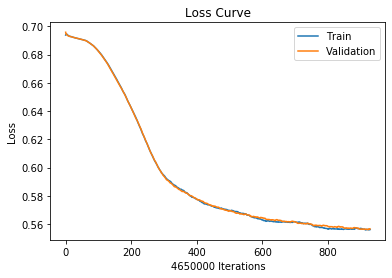

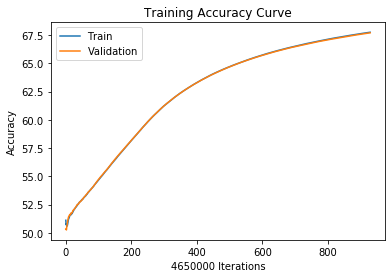

 91%|█████████▏| 865608/946094 [1:58:32<10:05, 132.84it/s]

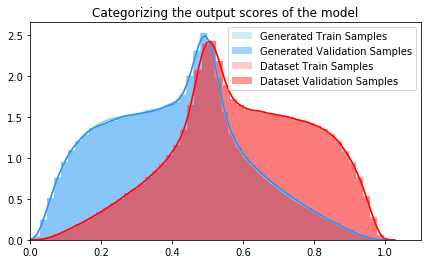

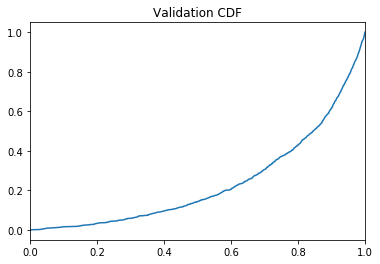

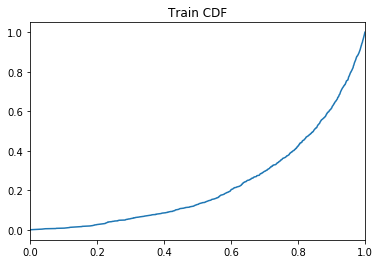

 91%|█████████▏| 865642/946094 [1:59:54<28:22:38,  1.27s/it]

Training AUC at epoch 4: 0.23028345454545457
Validation AUC epoch 4: 0.23627990909090907
Training Accuracy at epoch 4: 67.73905376344086
Validation Accuracy epoch 4: 67.68810752688172


 97%|█████████▋| 915616/946094 [2:05:18<03:29, 145.40it/s]  

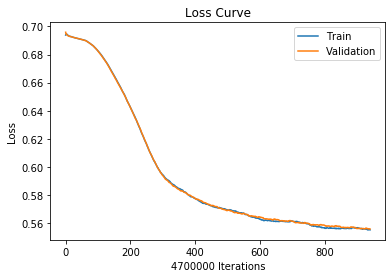

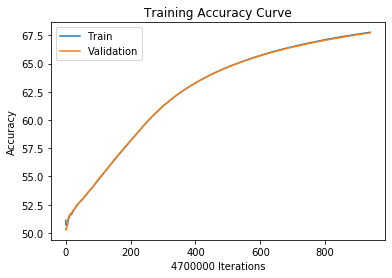

 97%|█████████▋| 915616/946094 [2:05:32<03:29, 145.40it/s]

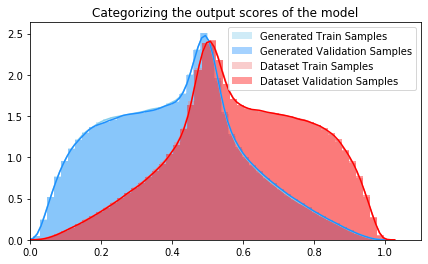

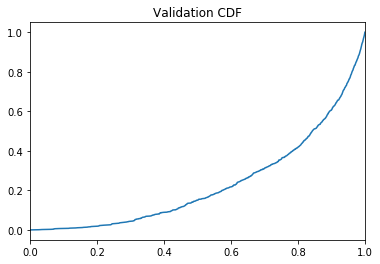

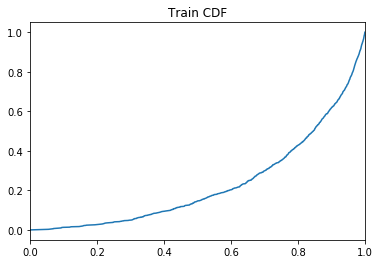

 97%|█████████▋| 915649/946094 [2:06:47<19:53:07,  2.35s/it]

Training AUC at epoch 4: 0.23164772727272726
Validation AUC epoch 4: 0.23172381818181817
Training Accuracy at epoch 4: 67.7825744680851
Validation Accuracy epoch 4: 67.7288085106383


  0%|          | 21/946094 [00:00<1:15:08, 209.82it/s]

Saving to:  model_checkpoints/binary/OHBioNet/07062020.pth
Starting epoch: 5  with learning rate:  [0.008100000000000001]


  2%|▏         | 19523/946094 [02:10<1:36:18, 160.35it/s]

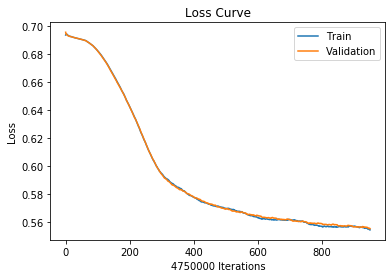

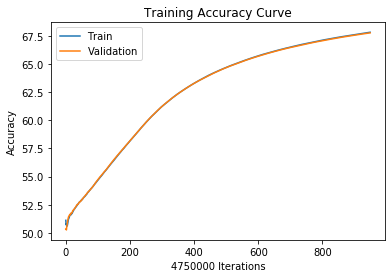

  2%|▏         | 19523/946094 [02:30<1:36:18, 160.35it/s]

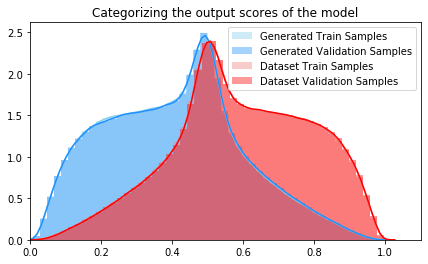

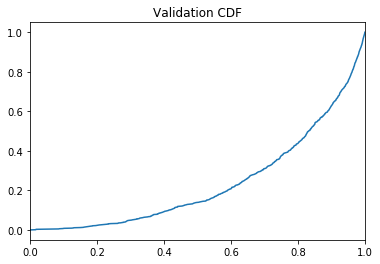

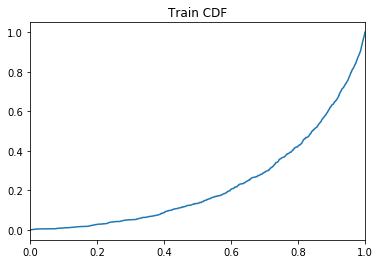

  2%|▏         | 19530/946094 [03:39<974:07:34,  3.78s/it]

Training AUC at epoch 5: 0.23075045454545456
Validation AUC epoch 5: 0.2348578181818182
Training Accuracy at epoch 5: 67.8253052631579
Validation Accuracy epoch 5: 67.77


  7%|▋         | 69515/946094 [09:01<1:31:55, 158.92it/s] 

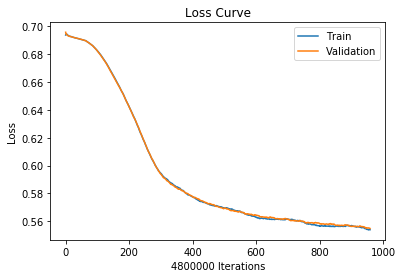

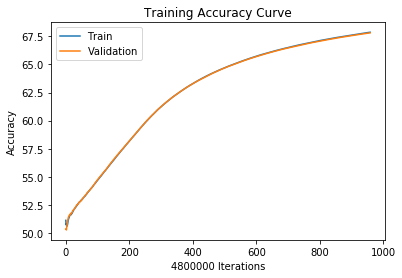

  7%|▋         | 69515/946094 [09:20<1:31:55, 158.92it/s]

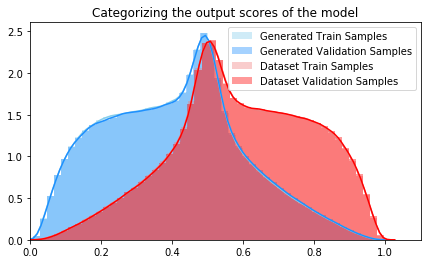

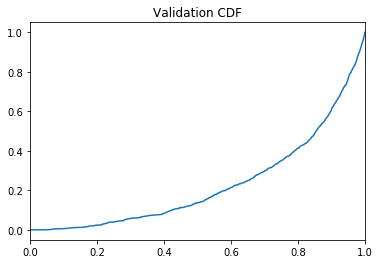

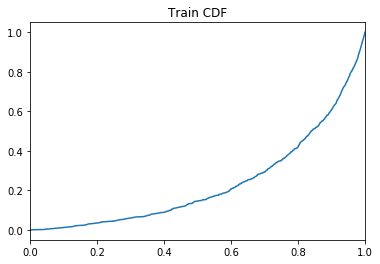

  7%|▋         | 69553/946094 [10:31<307:14:35,  1.26s/it]

Training AUC at epoch 5: 0.23330999999999996
Validation AUC epoch 5: 0.228876
Training Accuracy at epoch 5: 67.86591666666666
Validation Accuracy epoch 5: 67.8115625


 13%|█▎        | 119519/946094 [15:56<1:40:45, 136.72it/s]

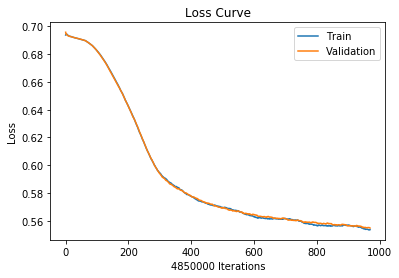

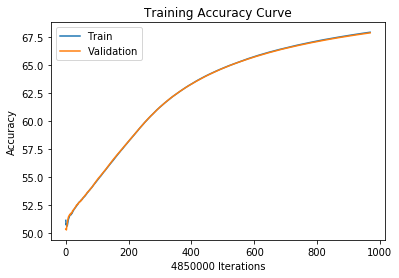

 13%|█▎        | 119519/946094 [16:10<1:40:45, 136.72it/s]

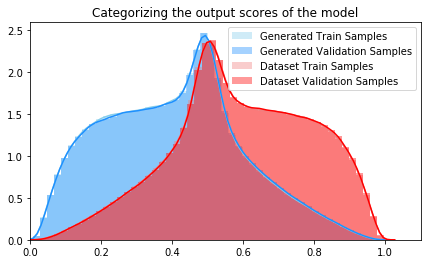

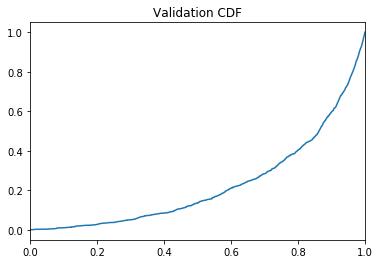

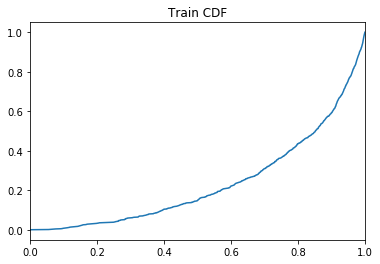

 13%|█▎        | 119552/946094 [17:25<389:41:25,  1.70s/it]

Training AUC at epoch 5: 0.23592145454545455
Validation AUC epoch 5: 0.2249101818181818
Training Accuracy at epoch 5: 67.90480412371134
Validation Accuracy epoch 5: 67.85212371134021


 18%|█▊        | 169515/946094 [22:45<1:23:39, 154.70it/s] 

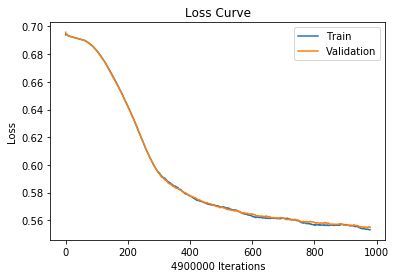

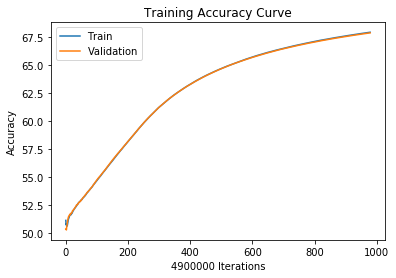

 18%|█▊        | 169515/946094 [23:00<1:23:39, 154.70it/s]

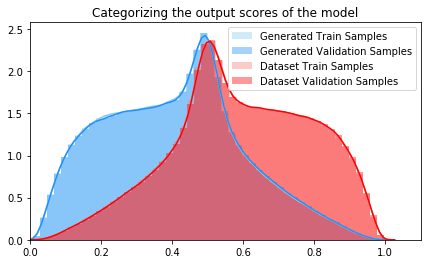

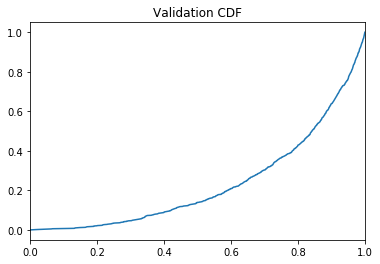

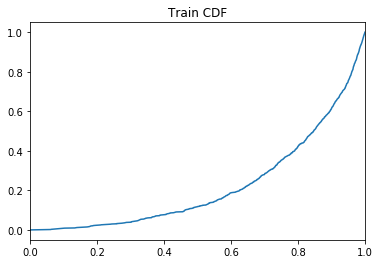

 18%|█▊        | 169550/946094 [24:15<271:18:40,  1.26s/it]

Training AUC at epoch 5: 0.22122309090909087
Validation AUC epoch 5: 0.23287227272727273
Training Accuracy at epoch 5: 67.94604081632653
Validation Accuracy epoch 5: 67.89016326530613


 23%|██▎       | 219518/946094 [29:33<1:21:03, 149.38it/s] 

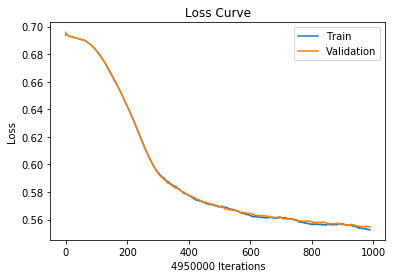

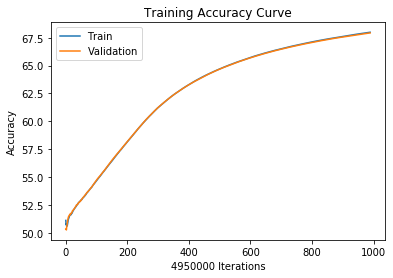

 23%|██▎       | 219518/946094 [29:50<1:21:03, 149.38it/s]

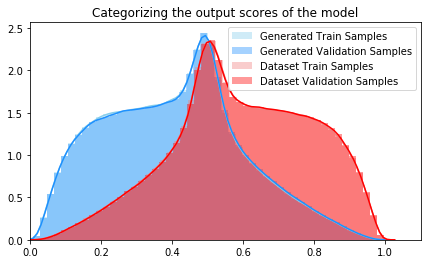

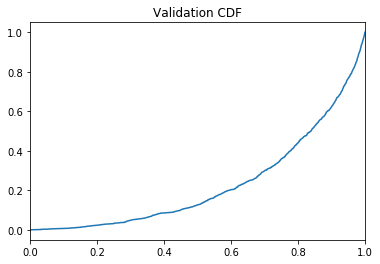

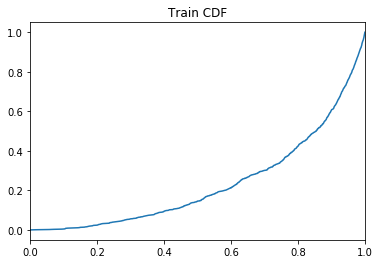

 23%|██▎       | 219530/946094 [31:04<460:18:09,  2.28s/it]

Training AUC at epoch 5: 0.2317369090909091
Validation AUC epoch 5: 0.22976327272727273
Training Accuracy at epoch 5: 67.9870101010101
Validation Accuracy epoch 5: 67.92543434343435


 27%|██▋       | 250808/946094 [34:23<1:12:21, 160.16it/s] IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 76%|███████▌  | 719514/946094 [1:37:59<28:37, 131.94it/s]

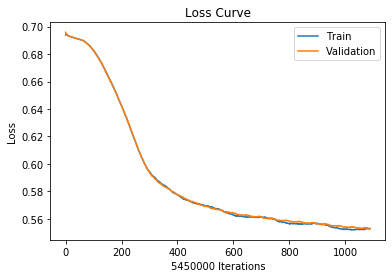

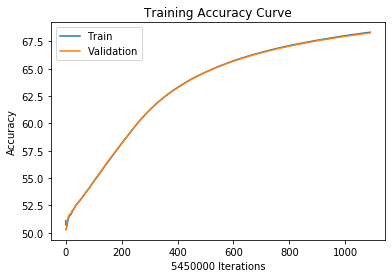

 76%|███████▌  | 719514/946094 [1:38:11<28:37, 131.94it/s]

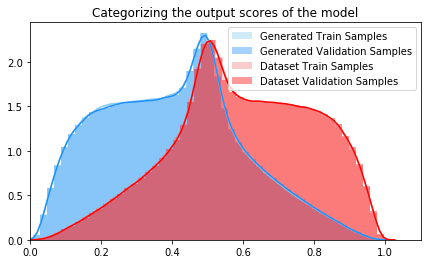

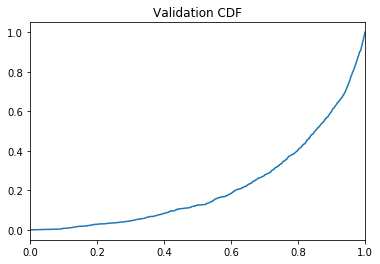

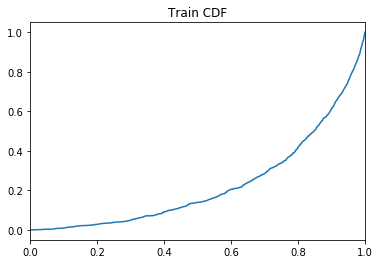

 76%|███████▌  | 719551/946094 [1:39:31<76:50:28,  1.22s/it] 

Training AUC at epoch 5: 0.2273955454545455
Validation AUC epoch 5: 0.2199610909090909
Training Accuracy at epoch 5: 68.34135779816513
Validation Accuracy epoch 5: 68.28137614678899


 81%|████████▏ | 769508/946094 [1:44:42<21:32, 136.66it/s]  

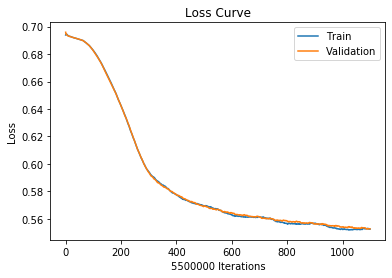

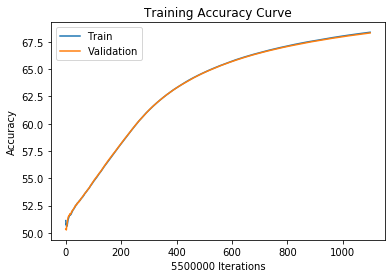

 81%|████████▏ | 769508/946094 [1:45:01<21:32, 136.66it/s]

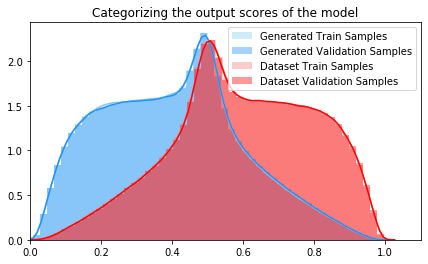

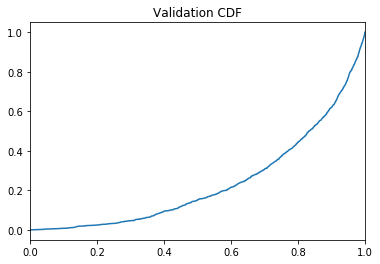

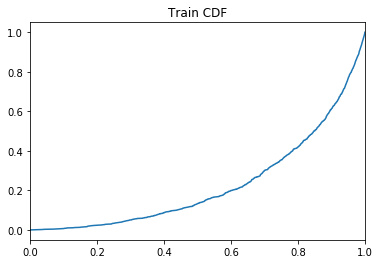

 81%|████████▏ | 769551/946094 [1:46:14<43:31:08,  1.13it/s]

Training AUC at epoch 5: 0.22702963636363638
Validation AUC epoch 5: 0.23612554545454545
Training Accuracy at epoch 5: 68.37645454545455
Validation Accuracy epoch 5: 68.31361818181819


 83%|████████▎ | 785478/946094 [1:47:51<16:03, 166.62it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 97%|█████████▋| 919516/946094 [2:05:04<03:19, 133.11it/s]

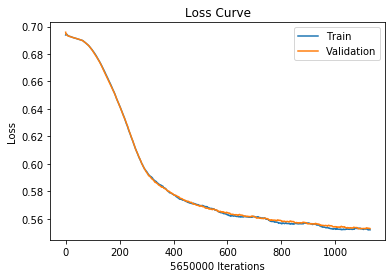

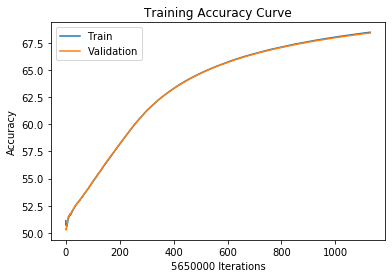

 97%|█████████▋| 919516/946094 [2:05:22<03:19, 133.11it/s]

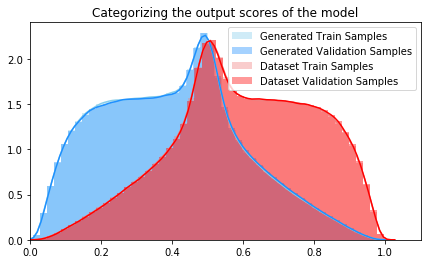

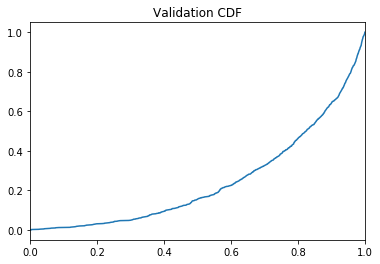

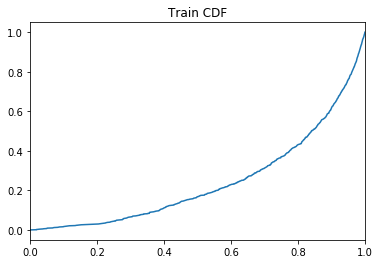

 97%|█████████▋| 919552/946094 [2:06:39<10:30:01,  1.42s/it]

Training AUC at epoch 5: 0.24289654545454548
Validation AUC epoch 5: 0.24443654545454546
Training Accuracy at epoch 5: 68.47237168141594
Validation Accuracy epoch 5: 68.40408849557522


 29%|██▉       | 273432/946094 [37:03<1:08:15, 164.22it/s]  

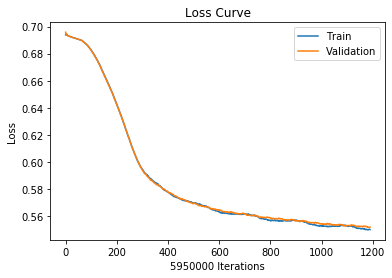

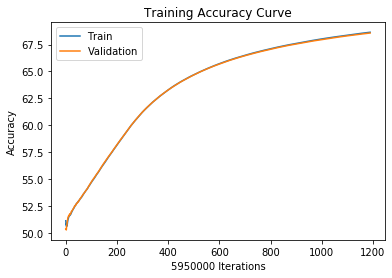

 29%|██▉       | 273432/946094 [37:20<1:08:15, 164.22it/s]

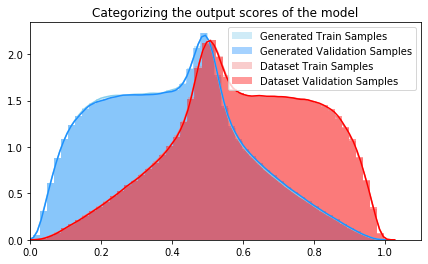

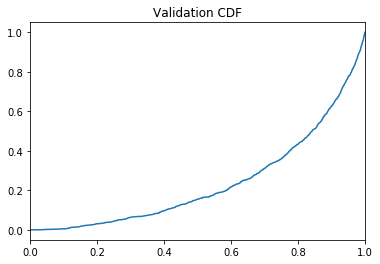

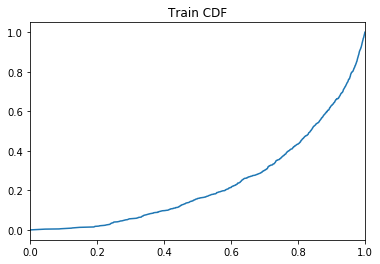

 29%|██▉       | 273436/946094 [38:41<1371:00:13,  7.34s/it]

Training AUC at epoch 6: 0.23659736363636363
Validation AUC epoch 6: 0.23756072727272728
Training Accuracy at epoch 6: 68.65067226890757
Validation Accuracy epoch 6: 68.57821848739496


 34%|███▍      | 323242/946094 [43:59<1:00:39, 171.15it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 50%|█████     | 473412/946094 [1:04:52<49:01, 160.69it/s]  

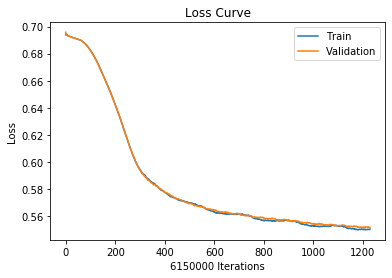

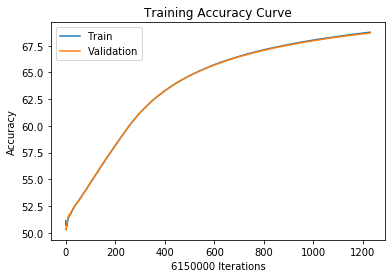

 50%|█████     | 473412/946094 [1:05:11<49:01, 160.69it/s]

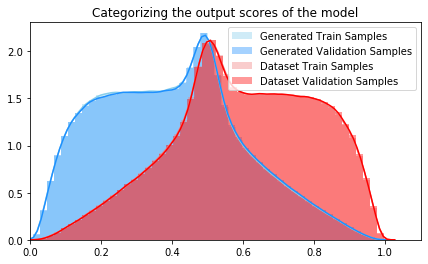

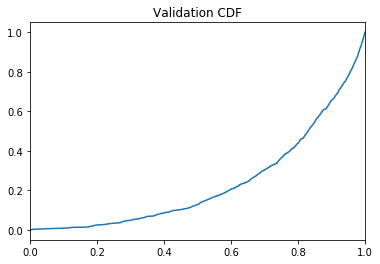

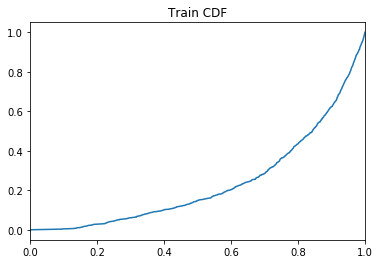

 50%|█████     | 473436/946094 [1:06:31<162:58:12,  1.24s/it]

Training AUC at epoch 6: 0.23533127272727272
Validation AUC epoch 6: 0.2348160909090909
Training Accuracy at epoch 6: 68.75990243902439
Validation Accuracy epoch 6: 68.68915447154471


 55%|█████▌    | 523416/946094 [1:11:51<42:21, 166.31it/s]   

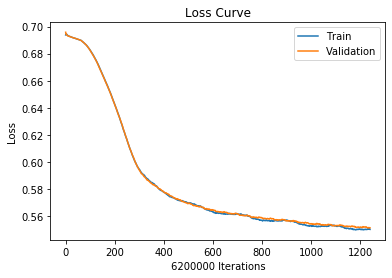

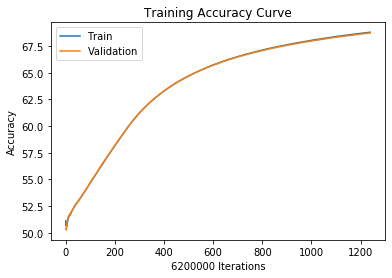

 55%|█████▌    | 523416/946094 [1:12:11<42:21, 166.31it/s]

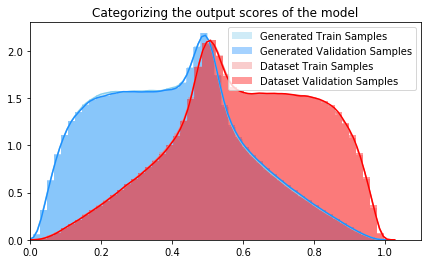

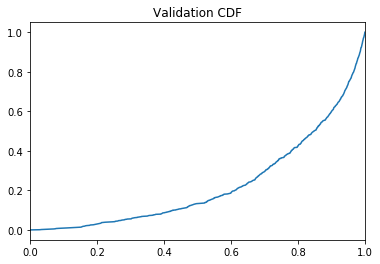

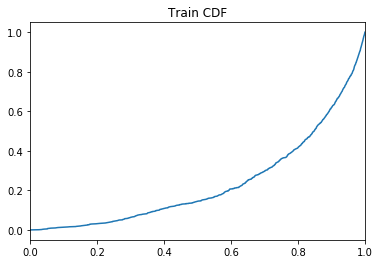

 55%|█████▌    | 523458/946094 [1:13:31<122:58:38,  1.05s/it]

Training AUC at epoch 6: 0.2341948181818182
Validation AUC epoch 6: 0.22682927272727277
Training Accuracy at epoch 6: 68.78764516129033
Validation Accuracy epoch 6: 68.7177741935484


 56%|█████▋    | 532839/946094 [1:14:29<43:45, 157.40it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 71%|███████   | 673427/946094 [1:33:02<30:16, 150.13it/s]

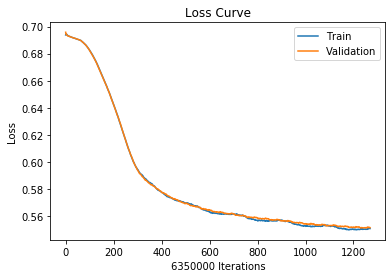

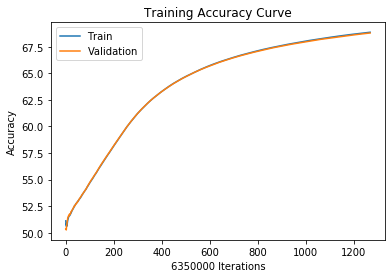

 71%|███████   | 673427/946094 [1:33:21<30:16, 150.13it/s]

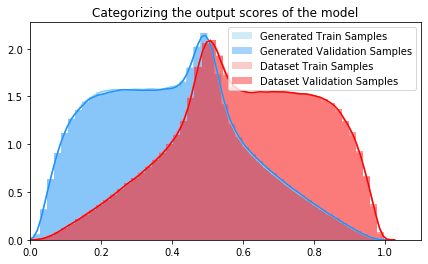

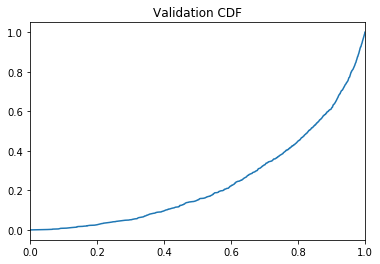

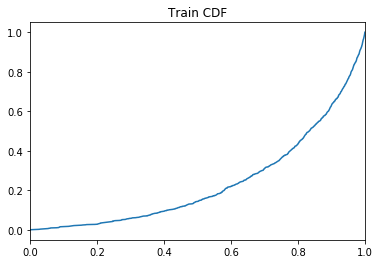

 71%|███████   | 673436/946094 [1:34:42<252:00:50,  3.33s/it]

Training AUC at epoch 6: 0.2382169090909091
Validation AUC epoch 6: 0.24093327272727275
Training Accuracy at epoch 6: 68.86436220472442
Validation Accuracy epoch 6: 68.79251968503937


 76%|███████▋  | 723428/946094 [1:40:05<21:09, 175.42it/s]   

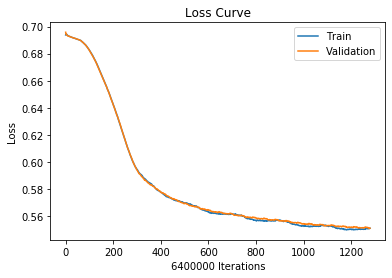

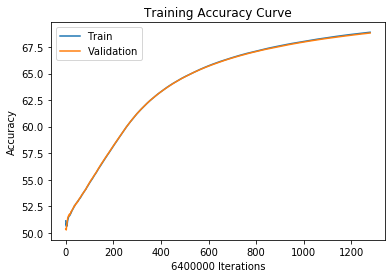

 76%|███████▋  | 723428/946094 [1:40:21<21:09, 175.42it/s]

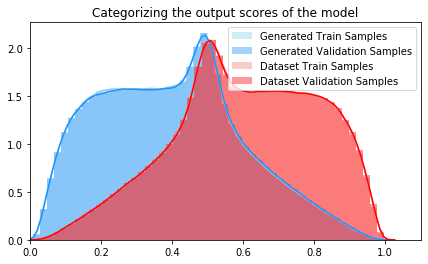

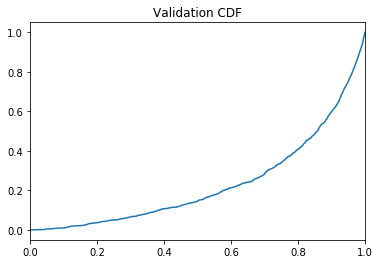

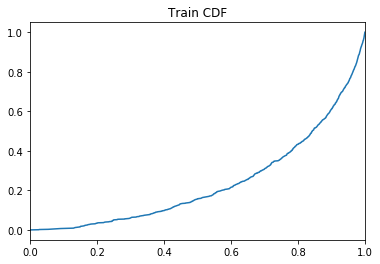

 76%|███████▋  | 723457/946094 [1:41:46<164:57:08,  2.67s/it]

Training AUC at epoch 6: 0.236598
Validation AUC epoch 6: 0.2310888181818182
Training Accuracy at epoch 6: 68.889125
Validation Accuracy epoch 6: 68.818578125


 78%|███████▊  | 738266/946094 [1:43:27<21:31, 160.87it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 98%|█████████▊| 923420/946094 [2:08:20<02:11, 171.86it/s]

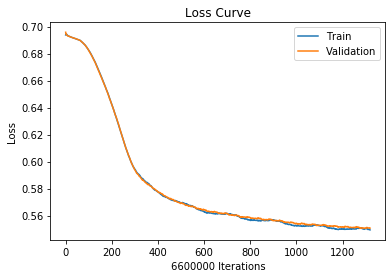

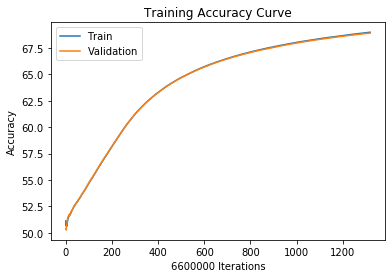

 98%|█████████▊| 923420/946094 [2:08:32<02:11, 171.86it/s]

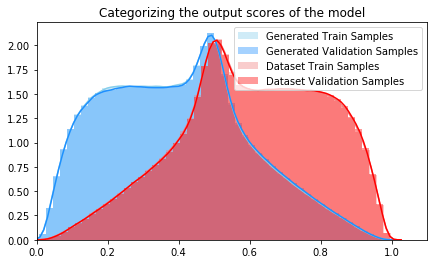

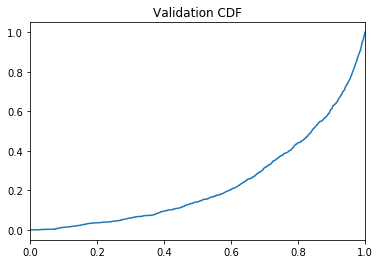

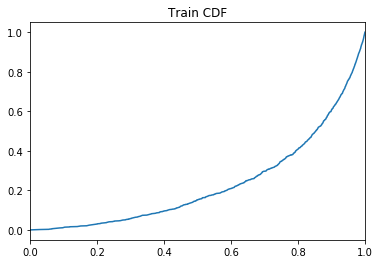

 98%|█████████▊| 923458/946094 [2:10:04<8:36:39,  1.37s/it] 

Training AUC at epoch 6: 0.23090190909090907
Validation AUC epoch 6: 0.23492545454545455
Training Accuracy at epoch 6: 68.99137878787879
Validation Accuracy epoch 6: 68.91413636363636


100%|█████████▉| 941997/946094 [2:12:02<00:31, 129.96it/s] IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 13%|█▎        | 127341/946094 [17:10<1:17:43, 175.58it/s]

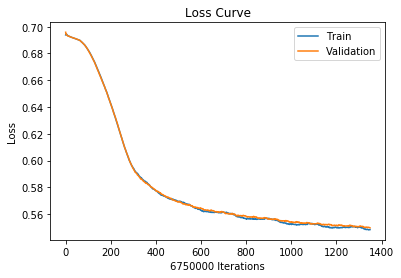

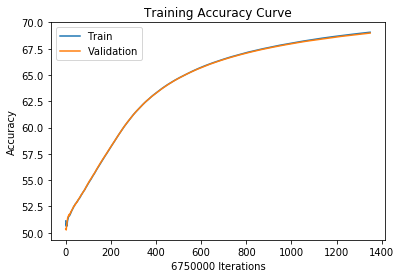

 13%|█▎        | 127341/946094 [17:30<1:17:43, 175.58it/s]

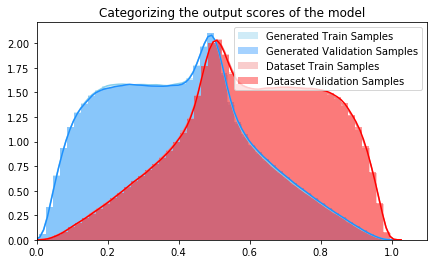

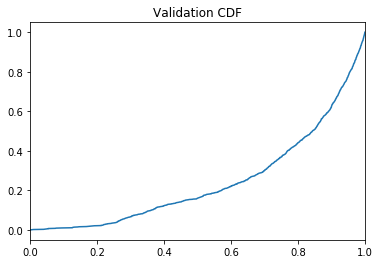

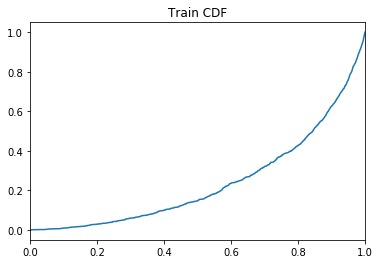

 13%|█▎        | 127342/946094 [18:54<7114:49:14, 31.28s/it]

Training AUC at epoch 7: 0.23894236363636362
Validation AUC epoch 7: 0.24261563636363637
Training Accuracy at epoch 7: 69.06125925925926
Validation Accuracy epoch 7: 68.98437037037037


 19%|█▊        | 177335/946094 [24:19<1:18:39, 162.89it/s]  

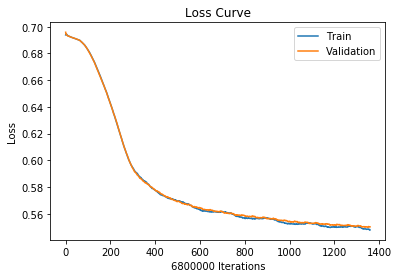

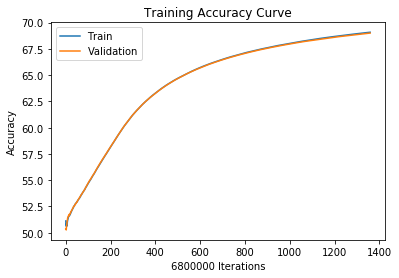

 19%|█▊        | 177335/946094 [24:30<1:18:39, 162.89it/s]

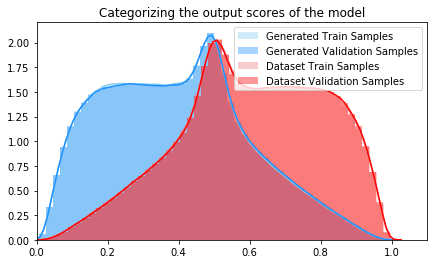

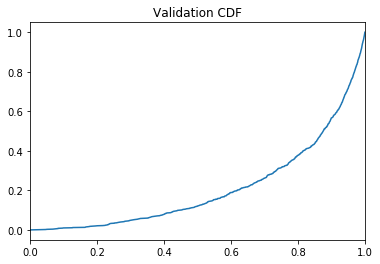

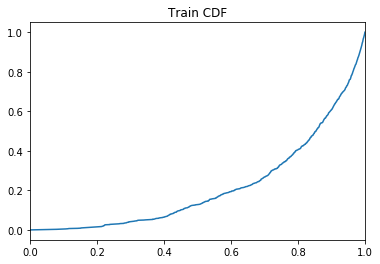

 19%|█▊        | 177363/946094 [26:03<665:02:25,  3.11s/it]

Training AUC at epoch 7: 0.21745718181818183
Validation AUC epoch 7: 0.20928945454545456
Training Accuracy at epoch 7: 69.08532352941177
Validation Accuracy epoch 7: 69.00552941176471


 20%|█▉        | 185341/946094 [26:58<1:20:03, 158.36it/s] IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 35%|███▍      | 327329/946094 [45:41<1:07:40, 152.39it/s]

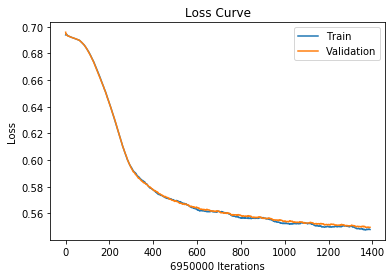

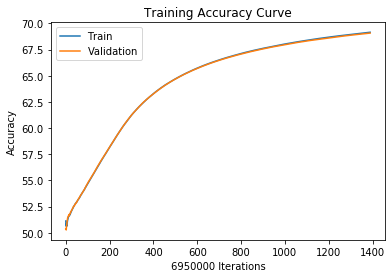

 35%|███▍      | 327329/946094 [46:00<1:07:40, 152.39it/s]

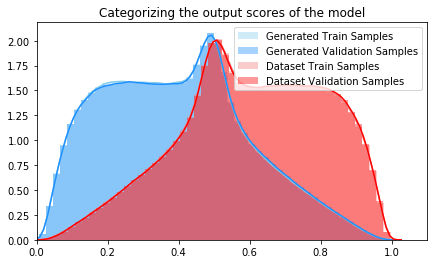

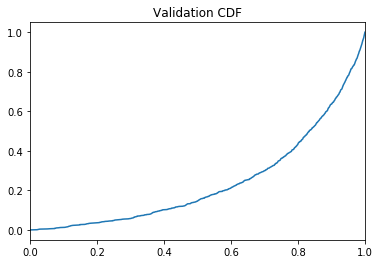

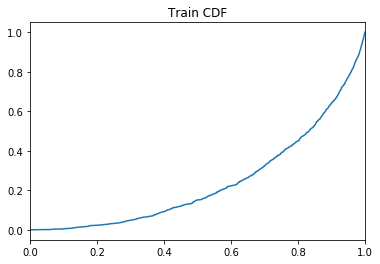

 35%|███▍      | 327342/946094 [47:26<419:57:54,  2.44s/it]

Training AUC at epoch 7: 0.2405289090909091
Validation AUC epoch 7: 0.23979781818181822
Training Accuracy at epoch 7: 69.15221582733813
Validation Accuracy epoch 7: 69.07146762589927


 40%|███▉      | 377322/946094 [52:45<57:47, 164.01it/s]   

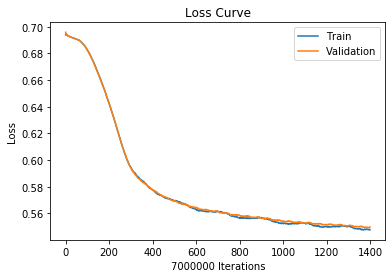

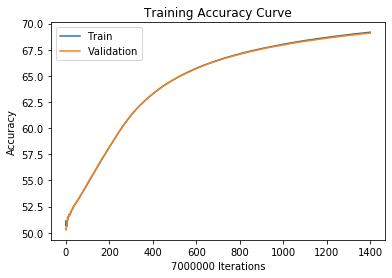

 40%|███▉      | 377322/946094 [53:00<57:47, 164.01it/s]

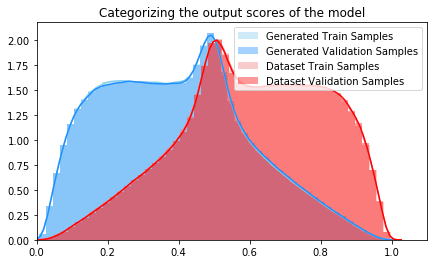

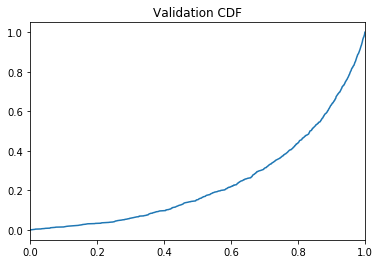

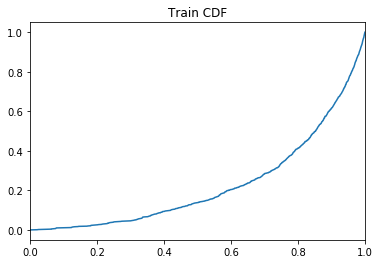

 40%|███▉      | 377363/946094 [54:30<174:48:48,  1.11s/it]

Training AUC at epoch 7: 0.22663109090909092
Validation AUC epoch 7: 0.24195827272727272
Training Accuracy at epoch 7: 69.17411428571428
Validation Accuracy epoch 7: 69.09314285714285


 41%|████      | 389490/946094 [55:43<49:03, 189.10it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 56%|█████▌    | 527338/946094 [1:13:58<41:49, 166.85it/s]

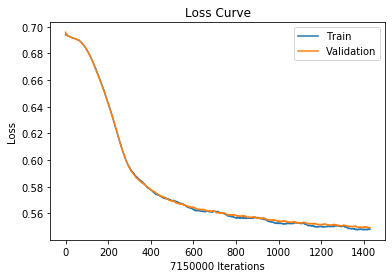

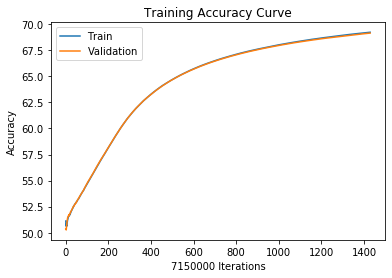

 56%|█████▌    | 527338/946094 [1:14:11<41:49, 166.85it/s]

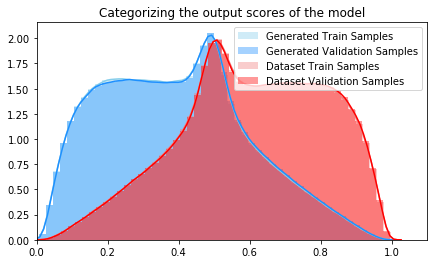

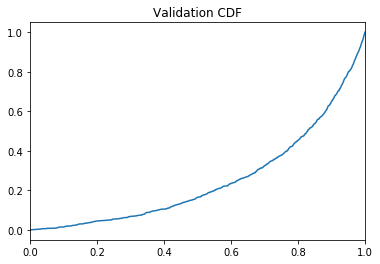

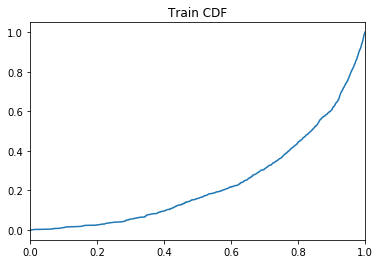

 56%|█████▌    | 527342/946094 [1:15:44<924:13:05,  7.95s/it]

Training AUC at epoch 7: 0.23799545454545457
Validation AUC epoch 7: 0.2511110909090909
Training Accuracy at epoch 7: 69.23742657342657
Validation Accuracy epoch 7: 69.15546853146853


 61%|██████    | 577322/946094 [1:21:10<37:23, 164.37it/s]   

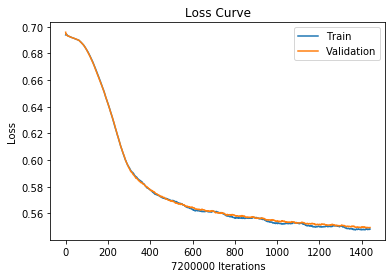

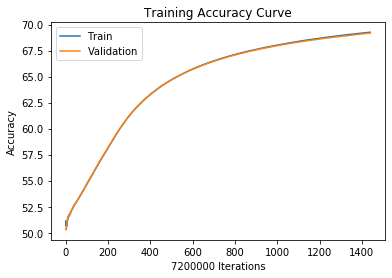

 61%|██████    | 577322/946094 [1:21:21<37:23, 164.37it/s]

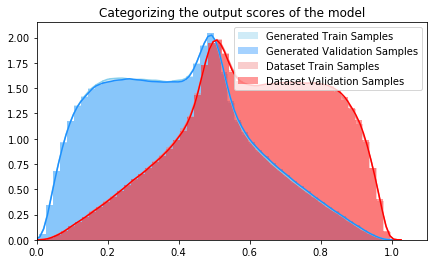

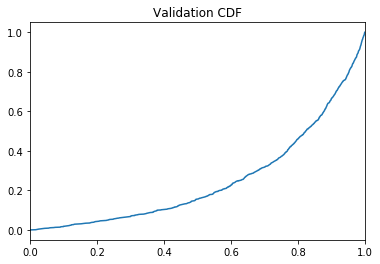

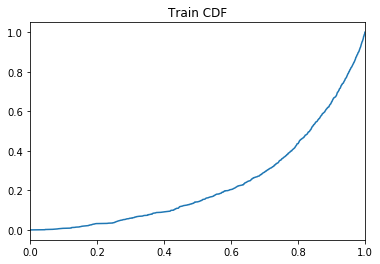

 61%|██████    | 577364/946094 [1:23:01<119:54:34,  1.17s/it]

Training AUC at epoch 7: 0.23681718181818182
Validation AUC epoch 7: 0.25036536363636364
Training Accuracy at epoch 7: 69.25745833333333
Validation Accuracy epoch 7: 69.176375


 66%|██████▋   | 627338/946094 [1:28:41<34:08, 155.60it/s]   

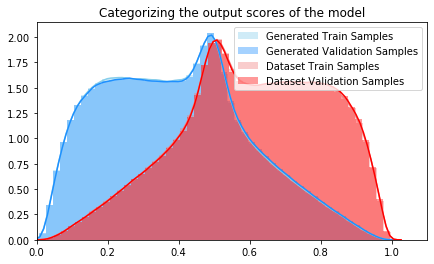

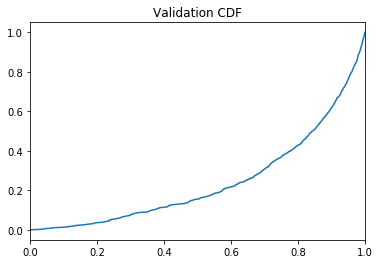

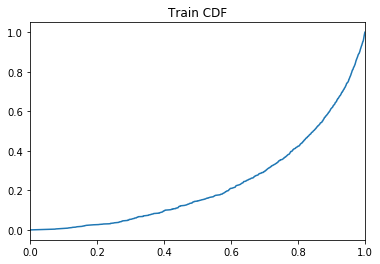

 66%|██████▋   | 627364/946094 [1:30:12<506:04:13,  5.72s/it]

Training AUC at epoch 7: 0.23163545454545453
Validation AUC epoch 7: 0.24174318181818183
Training Accuracy at epoch 7: 69.27773793103448
Validation Accuracy epoch 7: 69.19464827586206


 72%|███████▏  | 677319/946094 [1:35:36<30:29, 146.91it/s]   

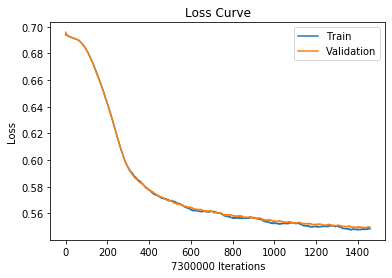

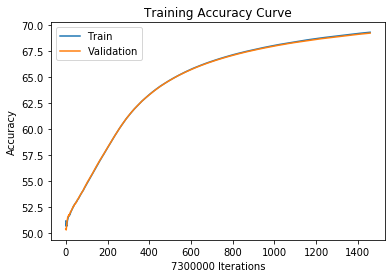

 72%|███████▏  | 677319/946094 [1:35:51<30:29, 146.91it/s]

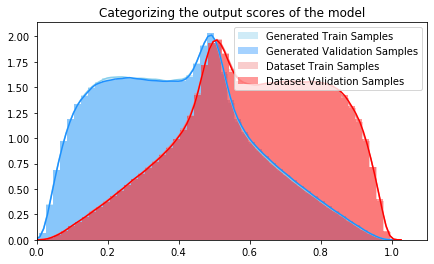

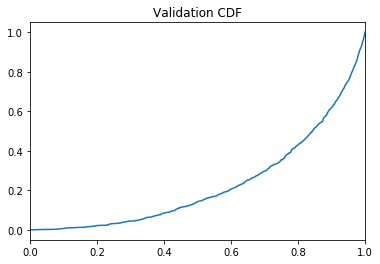

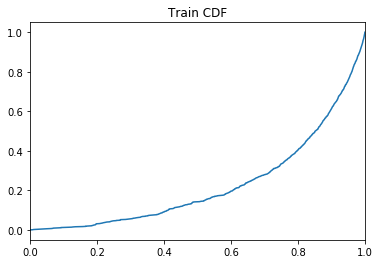

 72%|███████▏  | 677363/946094 [1:37:23<73:22:49,  1.02it/s] 

Training AUC at epoch 7: 0.22750790909090907
Validation AUC epoch 7: 0.22910554545454548
Training Accuracy at epoch 7: 69.29790410958904
Validation Accuracy epoch 7: 69.21486301369863


 73%|███████▎  | 692714/946094 [1:39:06<25:49, 163.54it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 93%|█████████▎| 877328/946094 [2:04:15<08:09, 140.40it/s]

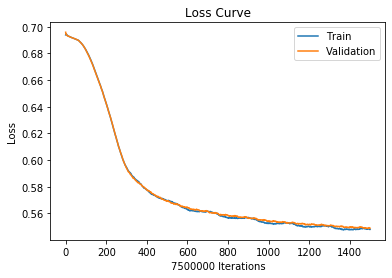

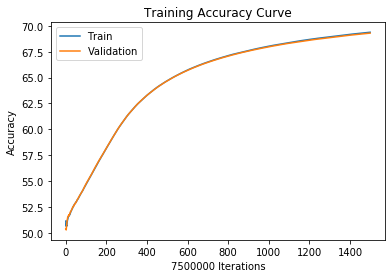

 93%|█████████▎| 877328/946094 [2:04:31<08:09, 140.40it/s]

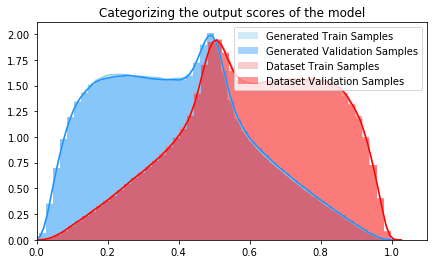

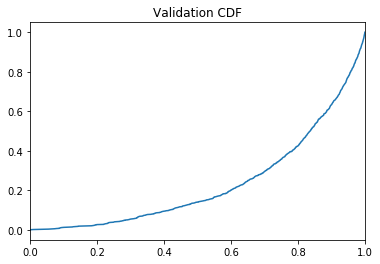

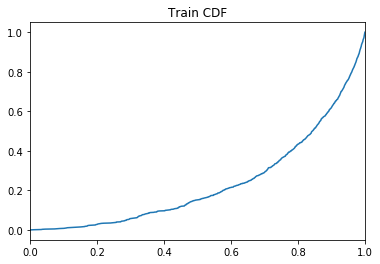

 93%|█████████▎| 877367/946094 [2:06:06<31:38:10,  1.66s/it]

Training AUC at epoch 7: 0.23453827272727273
Validation AUC epoch 7: 0.23414318181818183
Training Accuracy at epoch 7: 69.37909333333333
Validation Accuracy epoch 7: 69.29352


 95%|█████████▍| 895721/946094 [2:08:03<05:14, 160.30it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

  9%|▊         | 81246/946094 [10:41<1:41:54, 141.45it/s]

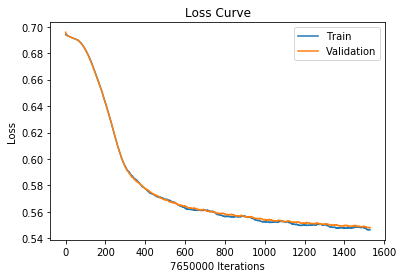

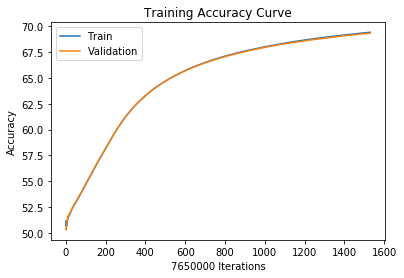

  9%|▊         | 81246/946094 [11:00<1:41:54, 141.45it/s]

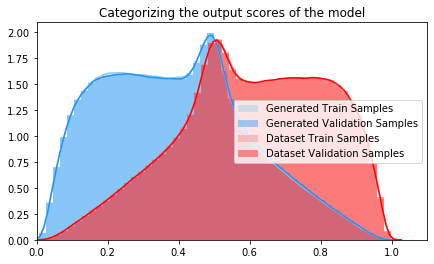

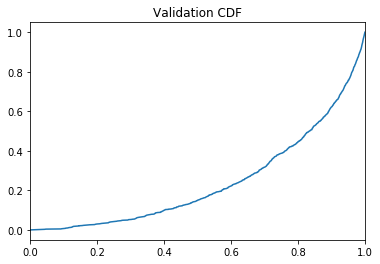

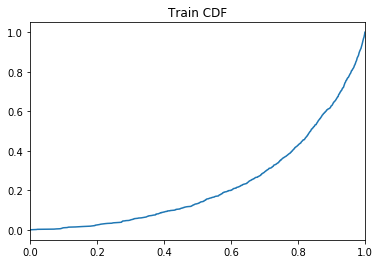

  9%|▊         | 81270/946094 [12:34<2845:04:14, 11.84s/it]

Training AUC at epoch 8: 0.23125318181818183
Validation AUC epoch 8: 0.23985545454545457
Training Accuracy at epoch 8: 69.43781699346405
Validation Accuracy epoch 8: 69.35037908496732


 14%|█▍        | 131226/946094 [17:58<1:29:27, 151.81it/s] 

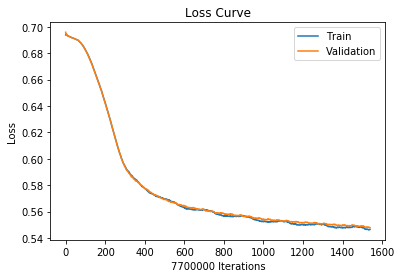

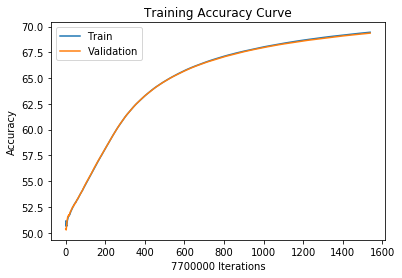

 14%|█▍        | 131226/946094 [18:10<1:29:27, 151.81it/s]

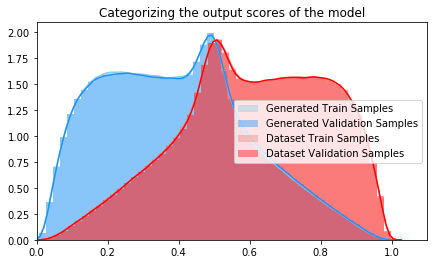

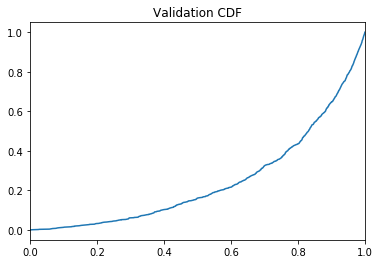

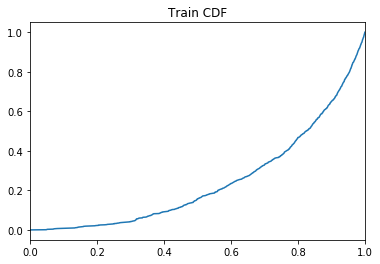

 14%|█▍        | 131269/946094 [19:50<241:14:31,  1.07s/it]

Training AUC at epoch 8: 0.24426272727272727
Validation AUC epoch 8: 0.2450199090909091
Training Accuracy at epoch 8: 69.45532467532468
Validation Accuracy epoch 8: 69.37011688311688


 18%|█▊        | 174044/946094 [24:22<1:22:09, 156.62it/s] IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 35%|███▌      | 331242/946094 [46:38<1:06:34, 153.91it/s]

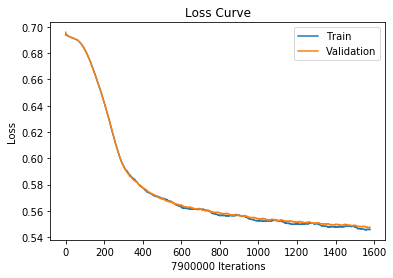

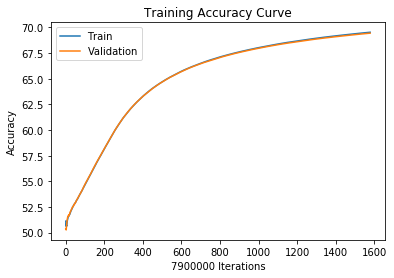

 35%|███▌      | 331242/946094 [46:50<1:06:34, 153.91it/s]

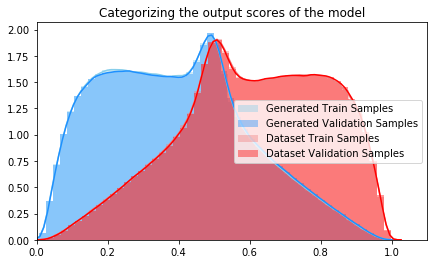

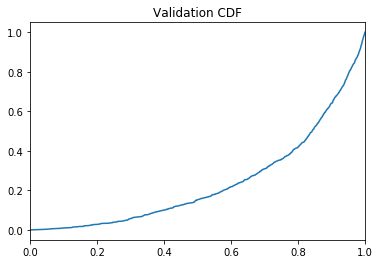

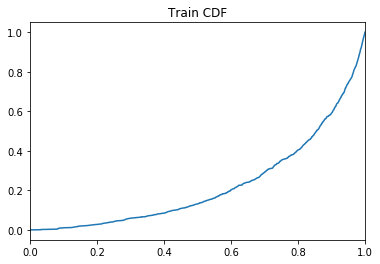

 35%|███▌      | 331269/946094 [48:30<669:49:56,  3.92s/it]

Training AUC at epoch 8: 0.224704
Validation AUC epoch 8: 0.23830663636363636
Training Accuracy at epoch 8: 69.53031645569621
Validation Accuracy epoch 8: 69.44046835443038


 39%|███▉      | 367050/946094 [52:22<54:27, 177.21it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 56%|█████▌    | 531230/946094 [1:15:39<49:34, 139.46it/s]  

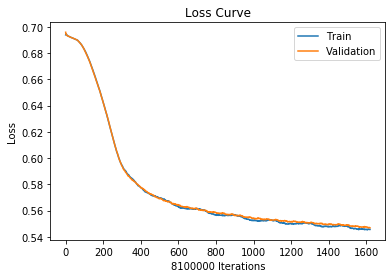

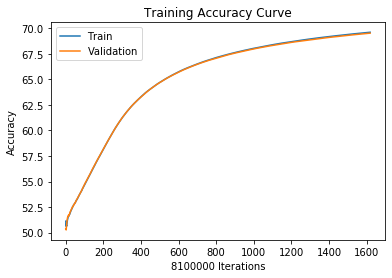

 56%|█████▌    | 531230/946094 [1:15:51<49:34, 139.46it/s]

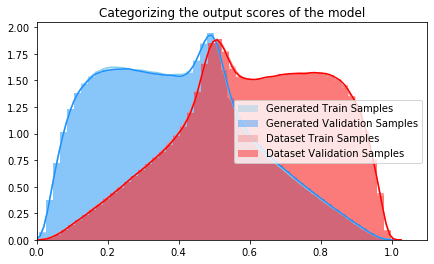

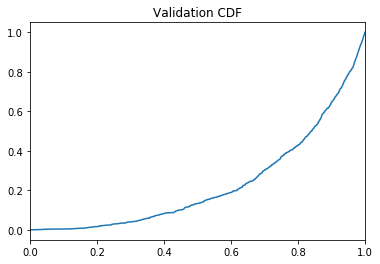

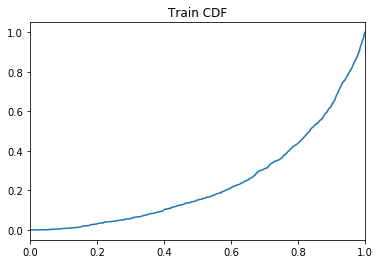

 56%|█████▌    | 531270/946094 [1:17:35<156:37:51,  1.36s/it]

Training AUC at epoch 8: 0.23981609090909092
Validation AUC epoch 8: 0.22961845454545454
Training Accuracy at epoch 8: 69.60113580246913
Validation Accuracy epoch 8: 69.51235802469135


 59%|█████▉    | 555861/946094 [1:20:23<53:24, 121.79it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 77%|███████▋  | 731228/946094 [1:46:02<29:01, 123.35it/s]

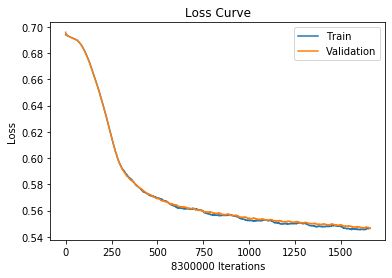

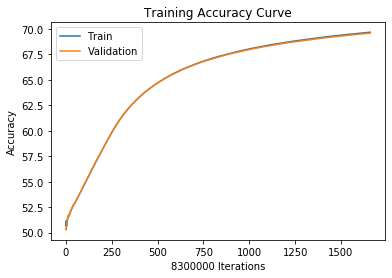

 77%|███████▋  | 731228/946094 [1:46:21<29:01, 123.35it/s]

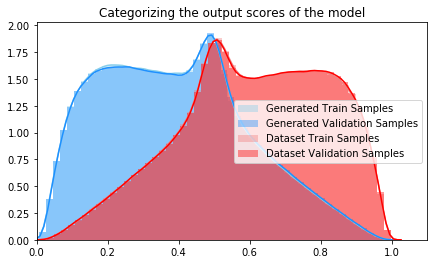

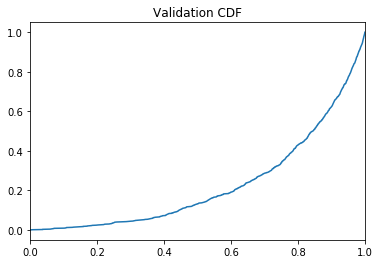

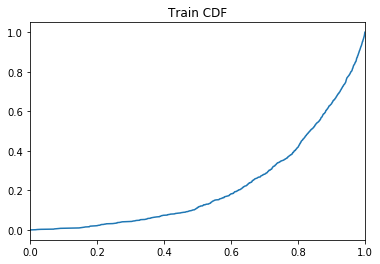

 77%|███████▋  | 731270/946094 [1:48:04<76:35:13,  1.28s/it] 

Training AUC at epoch 8: 0.22376227272727273
Validation AUC epoch 8: 0.2263227272727273
Training Accuracy at epoch 8: 69.6683734939759
Validation Accuracy epoch 8: 69.57880722891566


 79%|███████▉  | 751926/946094 [1:50:11<20:11, 160.33it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 93%|█████████▎| 881232/946094 [2:09:01<08:07, 133.08it/s]

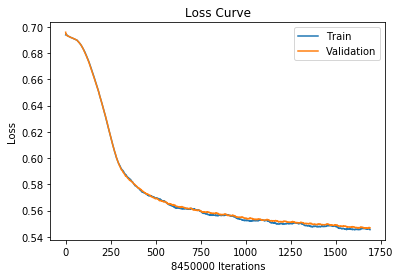

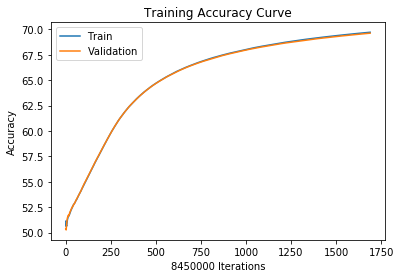

 93%|█████████▎| 881232/946094 [2:09:11<08:07, 133.08it/s]

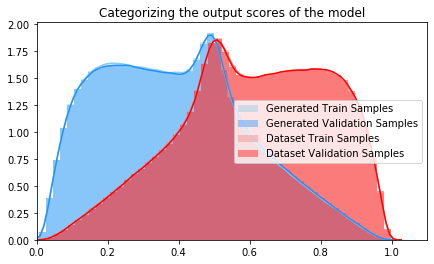

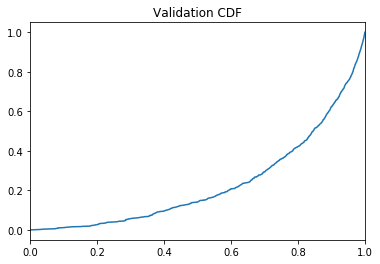

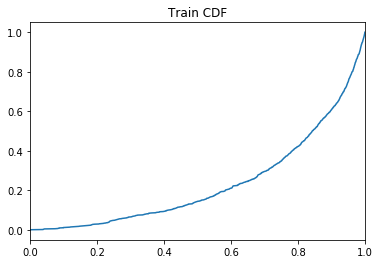

 93%|█████████▎| 881268/946094 [2:11:16<32:07:32,  1.78s/it]

Training AUC at epoch 8: 0.2331141818181818
Validation AUC epoch 8: 0.23156454545454547
Training Accuracy at epoch 8: 69.71984615384615
Validation Accuracy epoch 8: 69.62744378698225


 98%|█████████▊| 931238/946094 [2:16:56<01:44, 142.38it/s]  

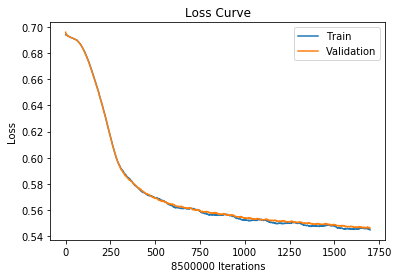

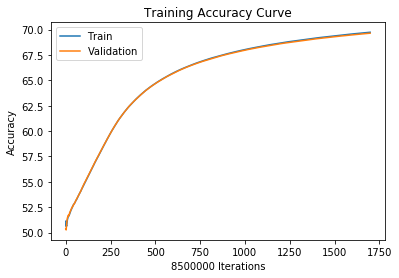

 98%|█████████▊| 931238/946094 [2:17:12<01:44, 142.38it/s]

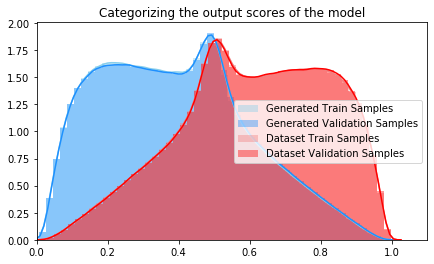

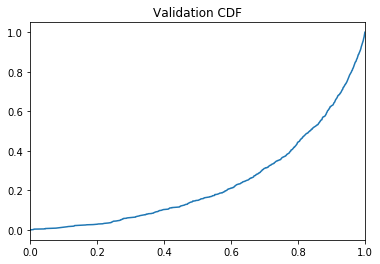

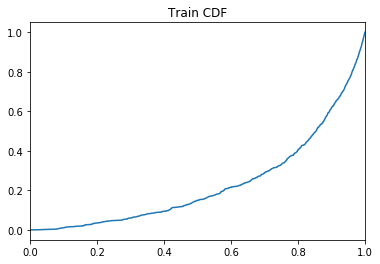

 98%|█████████▊| 931268/946094 [2:19:11<11:37:48,  2.82s/it]

Training AUC at epoch 8: 0.23041
Validation AUC epoch 8: 0.23828727272727274
Training Accuracy at epoch 8: 69.73645882352942
Validation Accuracy epoch 8: 69.64231764705882


 99%|█████████▉| 936663/946094 [2:19:48<01:15, 124.09it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 14%|█▍        | 135138/946094 [19:57<1:37:24, 138.75it/s]

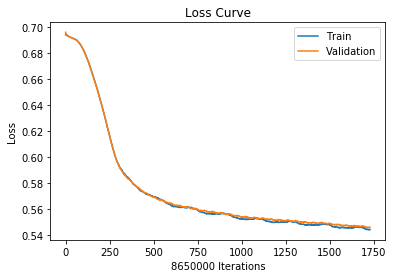

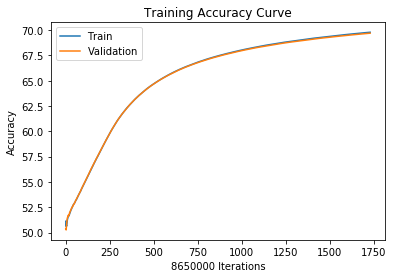

 14%|█▍        | 135138/946094 [20:10<1:37:24, 138.75it/s]

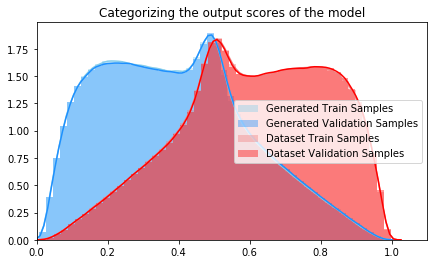

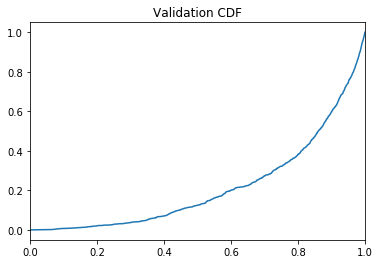

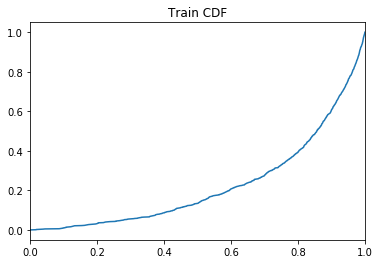

 14%|█▍        | 135175/946094 [22:14<404:54:18,  1.80s/it]

Training AUC at epoch 9: 0.22551163636363636
Validation AUC epoch 9: 0.215149
Training Accuracy at epoch 9: 69.78354913294798
Validation Accuracy epoch 9: 69.69053179190752


 15%|█▌        | 144034/946094 [23:14<1:47:53, 123.90it/s] IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 19%|█▉        | 179426/946094 [27:10<1:37:50, 130.59it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 30%|███       | 285140/946094 [43:28<1:10:29, 156.26it/s]

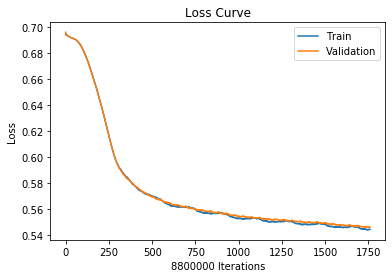

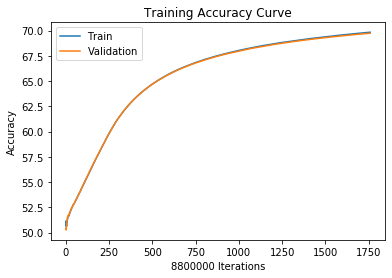

 30%|███       | 285140/946094 [43:40<1:10:29, 156.26it/s]

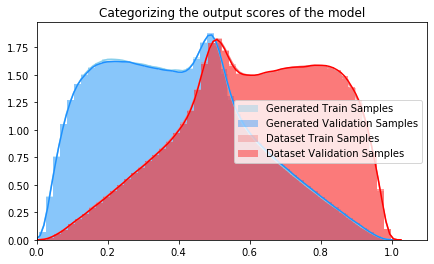

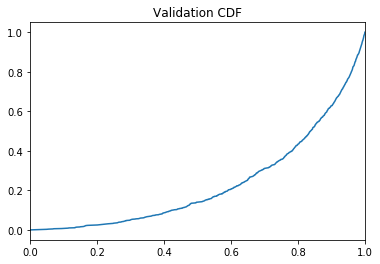

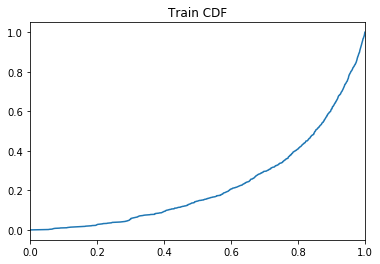

 30%|███       | 285176/946094 [45:48<385:38:43,  2.10s/it]

Training AUC at epoch 9: 0.22916490909090909
Validation AUC epoch 9: 0.23307427272727274
Training Accuracy at epoch 9: 69.83017045454545
Validation Accuracy epoch 9: 69.73382954545454


 35%|███▌      | 333010/946094 [51:15<59:11, 172.62it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 41%|████      | 385150/946094 [59:18<1:07:18, 138.89it/s]

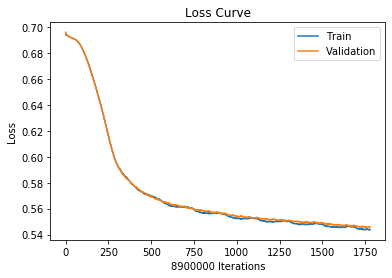

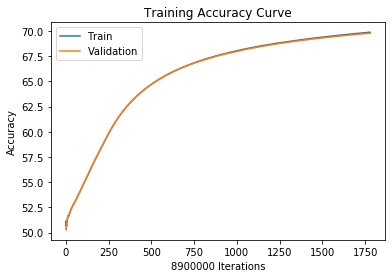

 41%|████      | 385150/946094 [59:31<1:07:18, 138.89it/s]

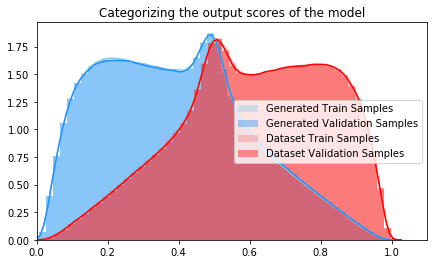

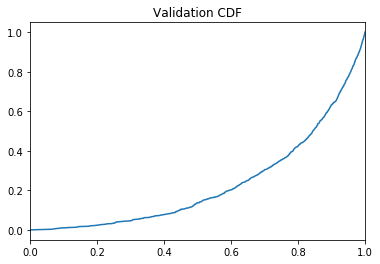

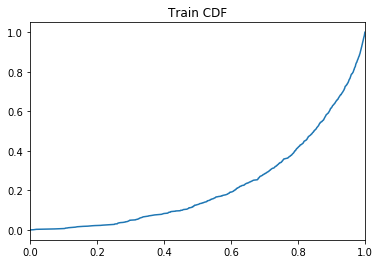

 41%|████      | 385175/946094 [1:01:38<1139:11:46,  7.31s/it]

Training AUC at epoch 9: 0.22354581818181818
Validation AUC epoch 9: 0.22982054545454544
Training Accuracy at epoch 9: 69.86076404494382
Validation Accuracy epoch 9: 69.76515730337078


 44%|████▍     | 417259/946094 [1:05:19<1:09:59, 125.94it/s]  IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 45%|████▌     | 428371/946094 [1:06:38<56:26, 152.90it/s]  

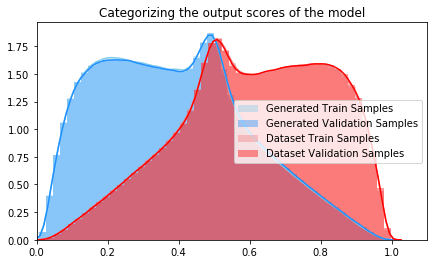

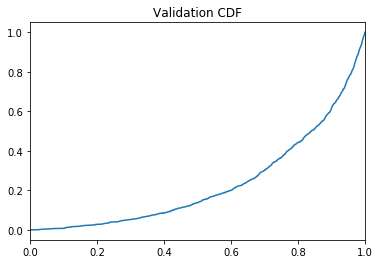

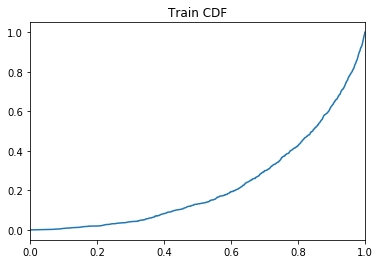

 46%|████▌     | 435154/946094 [1:09:50<1538:58:36, 10.84s/it]

Training AUC at epoch 9: 0.22675454545454543
Validation AUC epoch 9: 0.23287718181818184
Training Accuracy at epoch 9: 69.87645810055866
Validation Accuracy epoch 9: 69.77915083798882


 51%|█████▏    | 485140/946094 [1:15:25<45:09, 170.10it/s]    

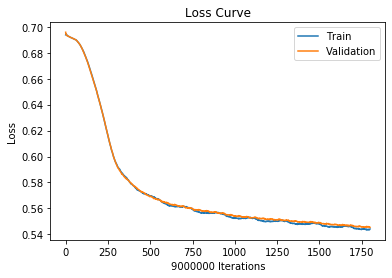

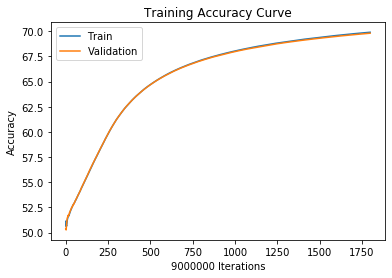

 51%|█████▏    | 485140/946094 [1:15:41<45:09, 170.10it/s]

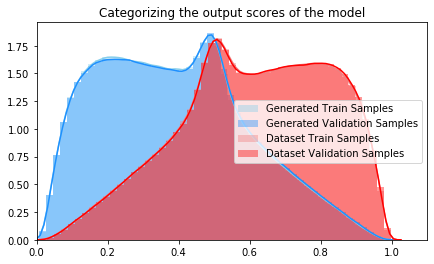

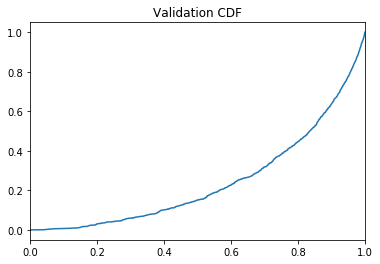

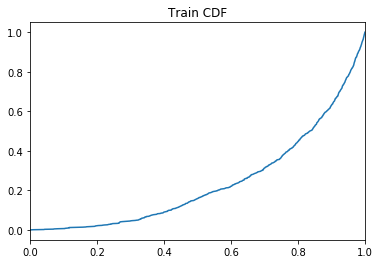

 51%|█████▏    | 485196/946094 [1:17:43<185:52:31,  1.45s/it]

Training AUC at epoch 9: 0.23932090909090908
Validation AUC epoch 9: 0.24244981818181816
Training Accuracy at epoch 9: 69.89028888888889
Validation Accuracy epoch 9: 69.79475555555555


 53%|█████▎    | 499298/946094 [1:19:18<57:56, 128.54it/s]   IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 57%|█████▋    | 535144/946094 [1:23:20<51:39, 132.60it/s]  

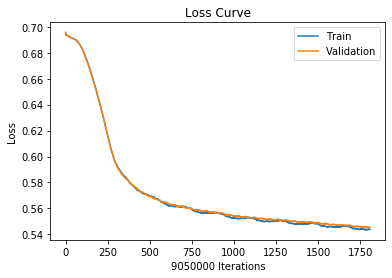

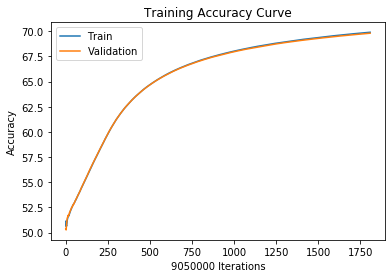

 57%|█████▋    | 535144/946094 [1:23:32<51:39, 132.60it/s]

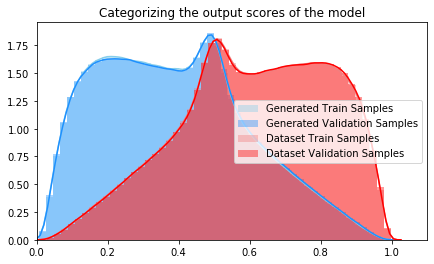

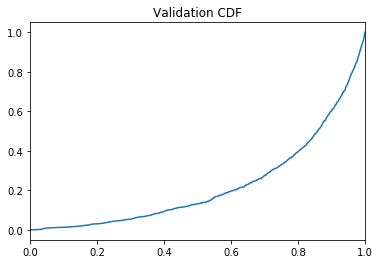

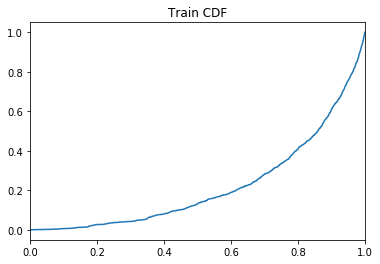

 57%|█████▋    | 535175/946094 [1:25:39<334:23:07,  2.93s/it]

Training AUC at epoch 9: 0.22065363636363639
Validation AUC epoch 9: 0.22349772727272726
Training Accuracy at epoch 9: 69.90660773480663
Validation Accuracy epoch 9: 69.81051933701657


 62%|██████▏   | 585133/946094 [1:31:18<47:29, 126.69it/s]   

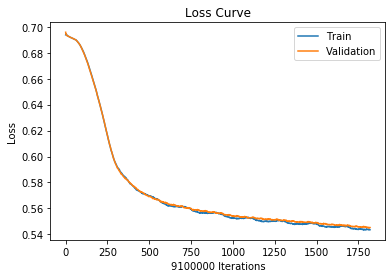

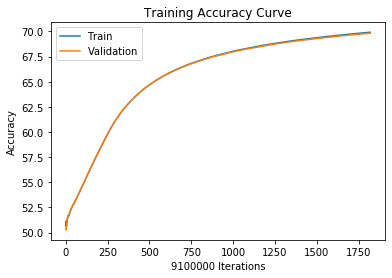

 62%|██████▏   | 585133/946094 [1:31:32<47:29, 126.69it/s]

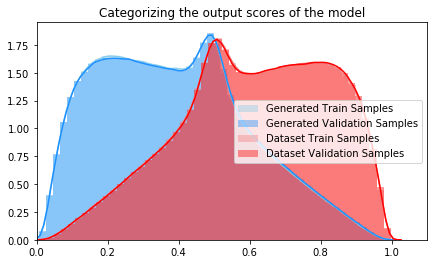

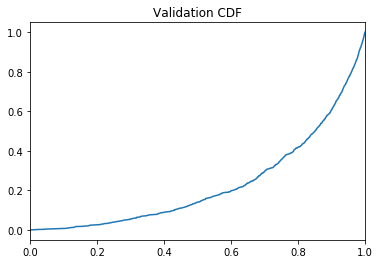

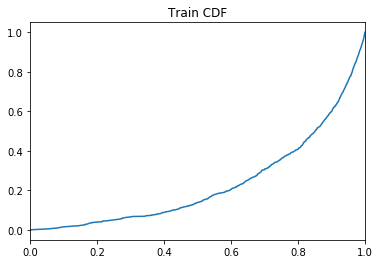

 62%|██████▏   | 585174/946094 [1:33:40<142:27:37,  1.42s/it]

Training AUC at epoch 9: 0.2320449090909091
Validation AUC epoch 9: 0.22872272727272724
Training Accuracy at epoch 9: 69.92117582417582
Validation Accuracy epoch 9: 69.82542857142857


 67%|██████▋   | 635137/946094 [1:39:17<37:52, 136.86it/s]   

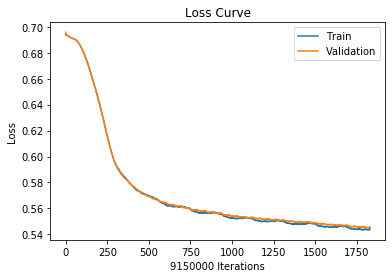

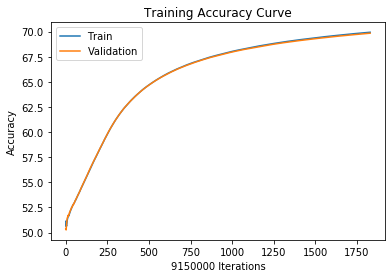

 67%|██████▋   | 635137/946094 [1:39:32<37:52, 136.86it/s]

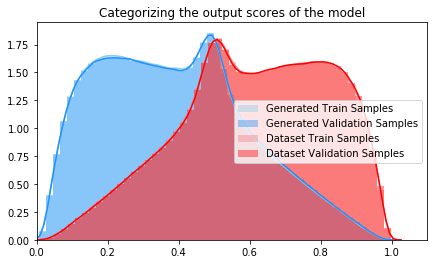

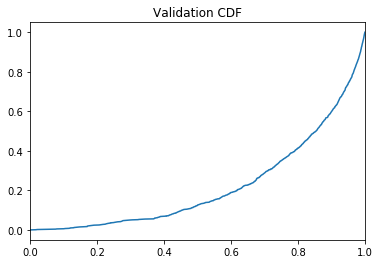

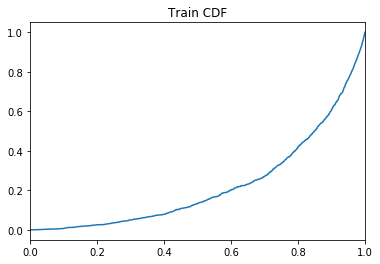

 67%|██████▋   | 635154/946094 [1:41:39<216:58:37,  2.51s/it]

Training AUC at epoch 9: 0.22467954545454547
Validation AUC epoch 9: 0.21979354545454546
Training Accuracy at epoch 9: 69.93493989071038
Validation Accuracy epoch 9: 69.83868852459017


 72%|███████▏  | 685153/946094 [1:47:18<26:07, 166.51it/s]   

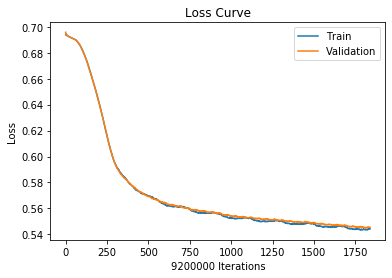

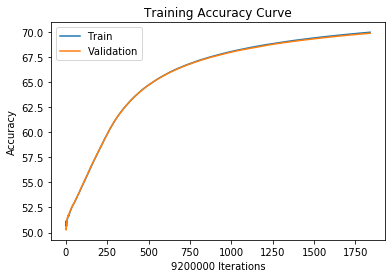

 72%|███████▏  | 685153/946094 [1:47:32<26:07, 166.51it/s]

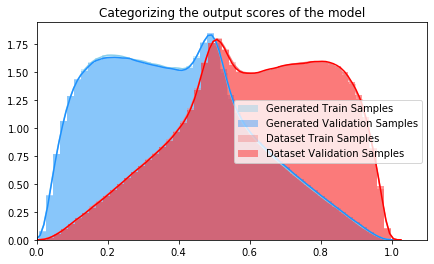

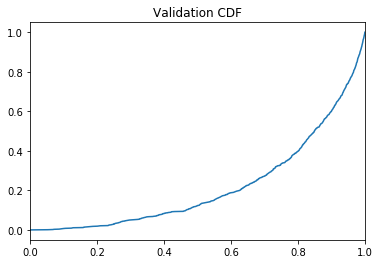

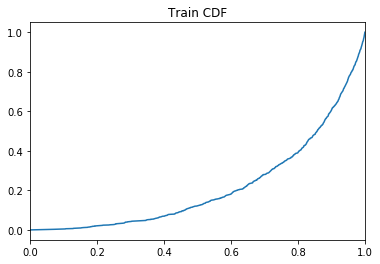

 72%|███████▏  | 685176/946094 [1:49:40<2168:33:13, 29.92s/it]

Training AUC at epoch 9: 0.2168052727272727
Validation AUC epoch 9: 0.2186479090909091
Training Accuracy at epoch 9: 69.94964130434782
Validation Accuracy epoch 9: 69.85271739130435


 78%|███████▊  | 735138/946094 [1:55:19<25:41, 136.82it/s]    

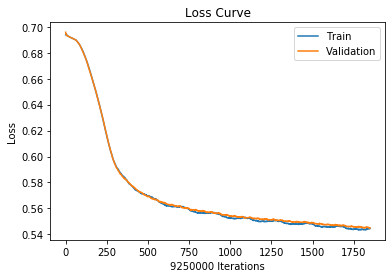

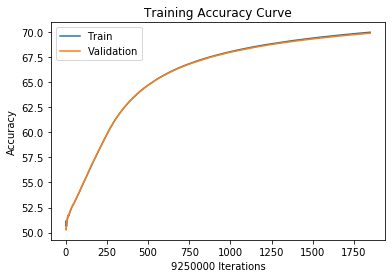

 78%|███████▊  | 735138/946094 [1:55:32<25:41, 136.82it/s]

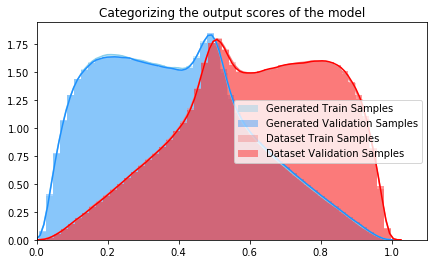

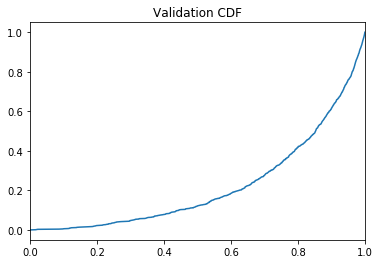

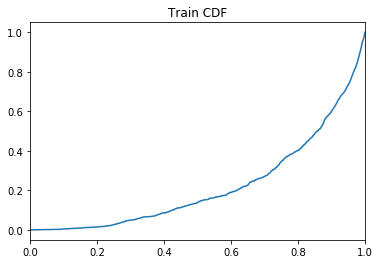

 78%|███████▊  | 735174/946094 [1:57:40<108:32:04,  1.85s/it]

Training AUC at epoch 9: 0.22034527272727272
Validation AUC epoch 9: 0.2210160909090909
Training Accuracy at epoch 9: 69.96385945945946
Validation Accuracy epoch 9: 69.86736216216217


 83%|████████▎ | 785146/946094 [2:03:19<16:35, 161.63it/s]   

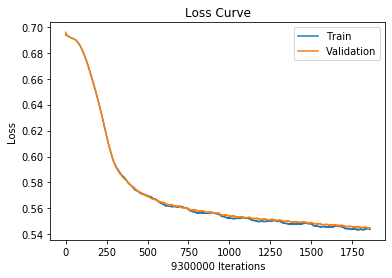

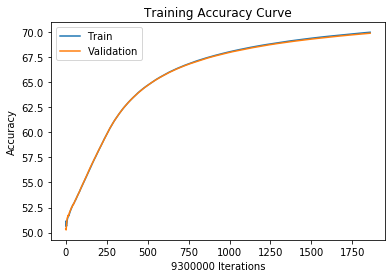

 83%|████████▎ | 785146/946094 [2:03:32<16:35, 161.63it/s]

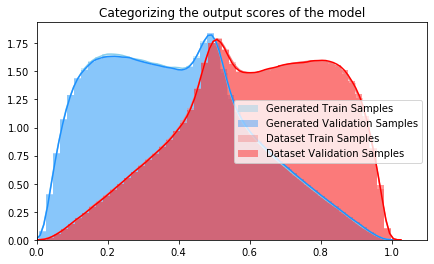

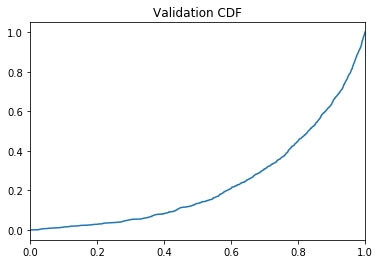

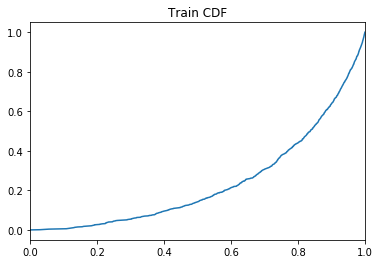

 83%|████████▎ | 785175/946094 [2:05:36<161:07:22,  3.60s/it]

Training AUC at epoch 9: 0.23781945454545456
Validation AUC epoch 9: 0.236159
Training Accuracy at epoch 9: 69.97874193548387
Validation Accuracy epoch 9: 69.8815376344086


 88%|████████▊ | 835142/946094 [2:11:08<13:09, 140.59it/s]   

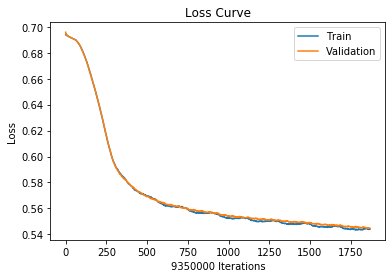

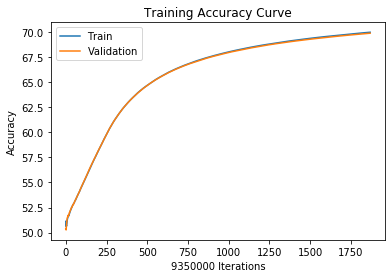

 88%|████████▊ | 835142/946094 [2:11:23<13:09, 140.59it/s]

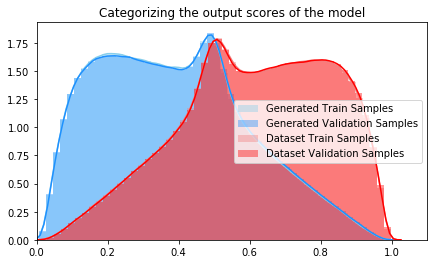

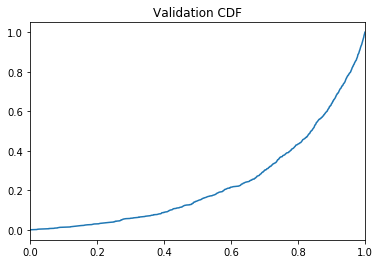

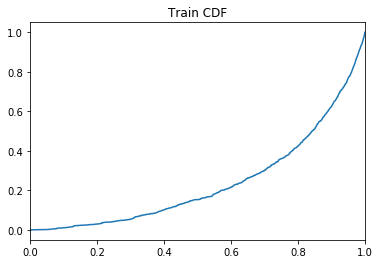

 88%|████████▊ | 835154/946094 [2:13:26<106:51:22,  3.47s/it]

Training AUC at epoch 9: 0.23784536363636363
Validation AUC epoch 9: 0.2372180909090909
Training Accuracy at epoch 9: 69.99178609625669
Validation Accuracy epoch 9: 69.89567914438503


 94%|█████████▎| 885153/946094 [2:18:50<05:42, 177.72it/s]   

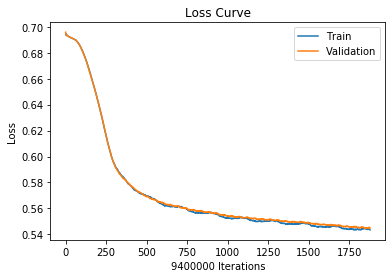

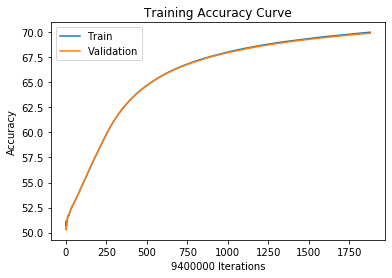

 94%|█████████▎| 885153/946094 [2:19:03<05:42, 177.72it/s]

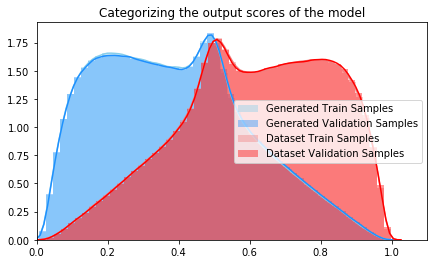

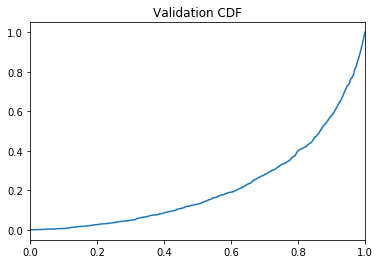

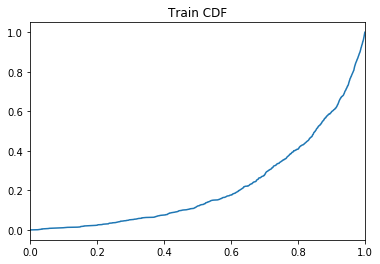

 94%|█████████▎| 885176/946094 [2:21:10<494:57:03, 29.25s/it]

Training AUC at epoch 9: 0.2197740909090909
Validation AUC epoch 9: 0.21816072727272728
Training Accuracy at epoch 9: 70.00626595744681
Validation Accuracy epoch 9: 69.9088085106383


 99%|█████████▉| 935142/946094 [2:26:43<01:22, 132.87it/s]   

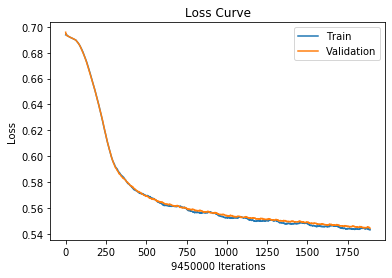

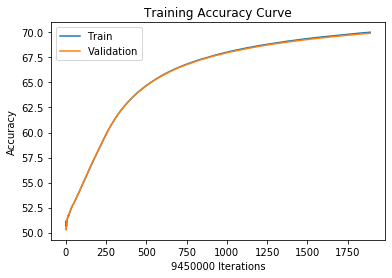

 99%|█████████▉| 935142/946094 [2:26:53<01:22, 132.87it/s]

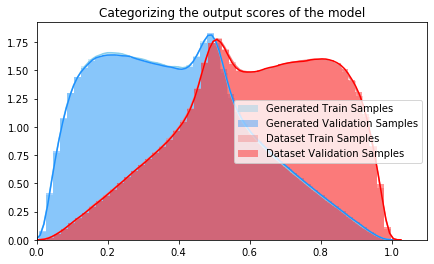

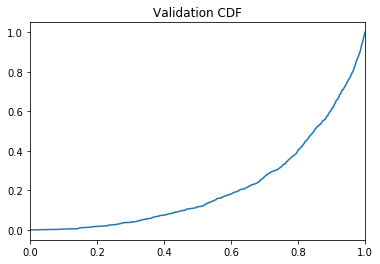

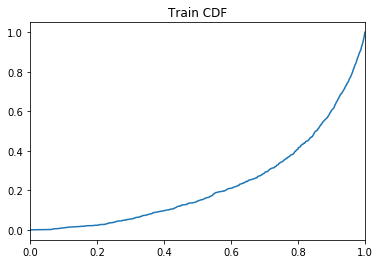

 99%|█████████▉| 935175/946094 [2:29:05<7:35:49,  2.50s/it] 

Training AUC at epoch 9: 0.22926636363636366
Validation AUC epoch 9: 0.21599181818181817
Training Accuracy at epoch 9: 70.01978835978836
Validation Accuracy epoch 9: 69.92150264550264


  0%|          | 21/946094 [00:00<1:17:58, 202.22it/s]

Saving to:  model_checkpoints/binary/OHBioNet/07062020.pth
Starting epoch: 10  with learning rate:  [0.007290000000000001]


  4%|▍         | 39045/946094 [04:23<1:55:43, 130.63it/s]

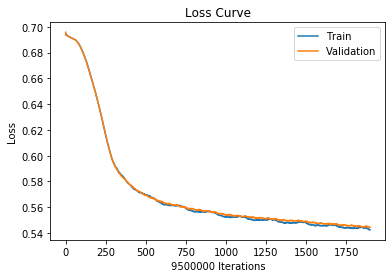

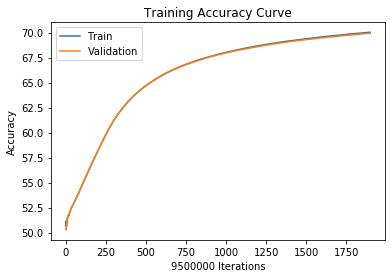

  4%|▍         | 39045/946094 [04:40<1:55:43, 130.63it/s]

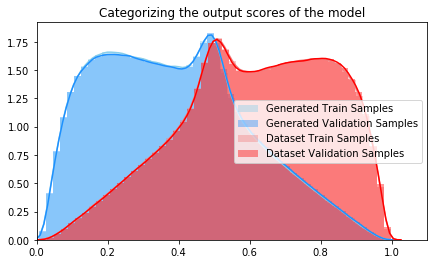

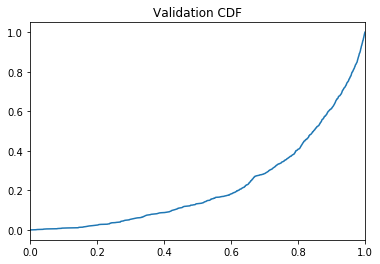

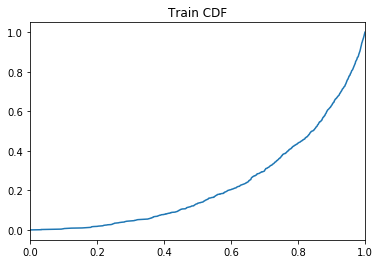

  4%|▍         | 39080/946094 [06:46<503:14:30,  2.00s/it]

Training AUC at epoch 10: 0.22961054545454546
Validation AUC epoch 10: 0.22528736363636365
Training Accuracy at epoch 10: 70.03396842105263
Validation Accuracy epoch 10: 69.93538947368421


  9%|▉         | 89040/946094 [12:36<1:37:47, 146.07it/s] 

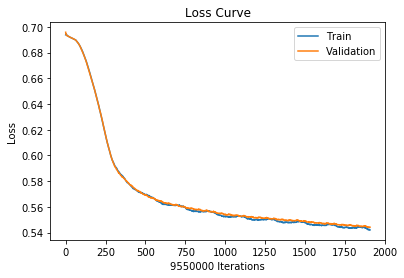

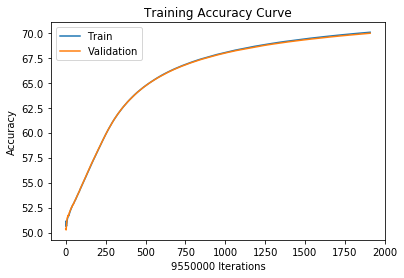

  9%|▉         | 89040/946094 [12:50<1:37:47, 146.07it/s]

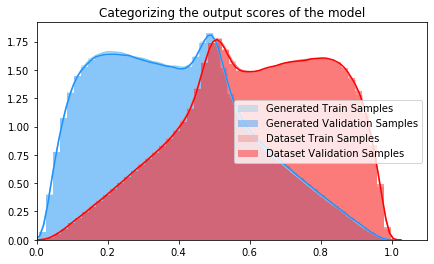

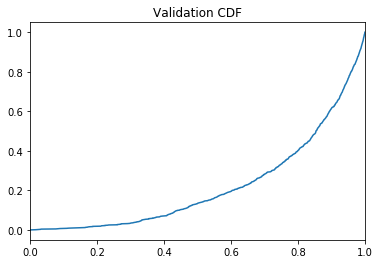

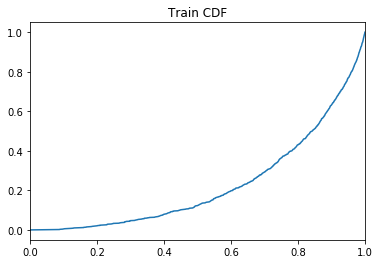

  9%|▉         | 89060/946094 [15:02<522:06:00,  2.19s/it]

Training AUC at epoch 10: 0.226769
Validation AUC epoch 10: 0.21993090909090907
Training Accuracy at epoch 10: 70.04849214659686
Validation Accuracy epoch 10: 69.94957068062827


 15%|█▍        | 139044/946094 [20:45<1:20:00, 168.11it/s]

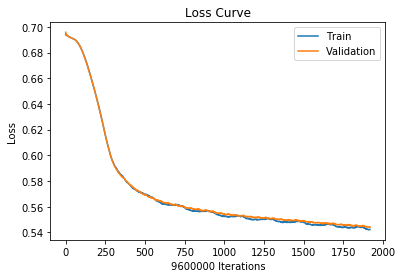

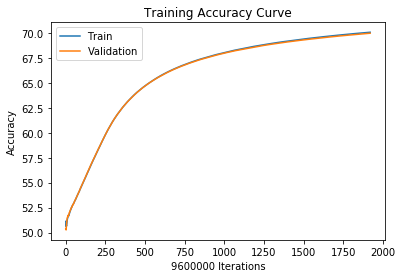

 15%|█▍        | 139044/946094 [21:00<1:20:00, 168.11it/s]

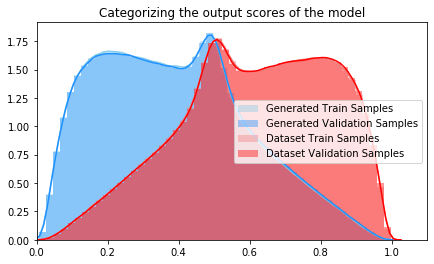

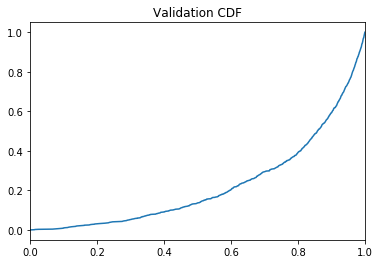

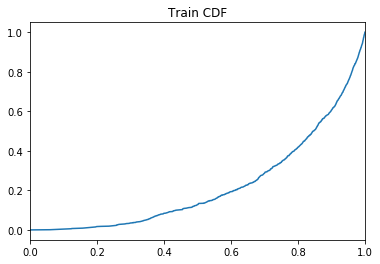

 15%|█▍        | 139080/946094 [23:09<426:51:07,  1.90s/it]

Training AUC at epoch 10: 0.22113872727272726
Validation AUC epoch 10: 0.22465636363636365
Training Accuracy at epoch 10: 70.06104166666667
Validation Accuracy epoch 10: 69.96259375


 20%|█▉        | 189042/946094 [28:41<1:16:13, 165.55it/s] 

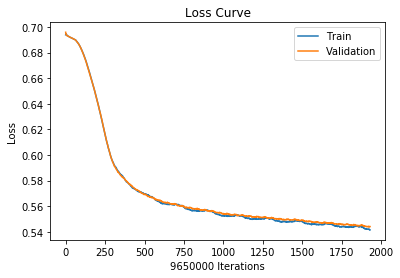

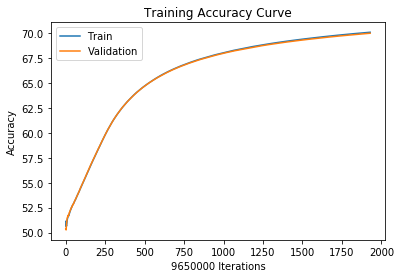

 20%|█▉        | 189042/946094 [29:00<1:16:13, 165.55it/s]

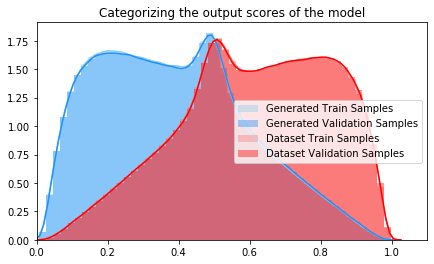

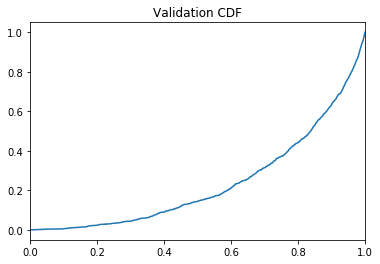

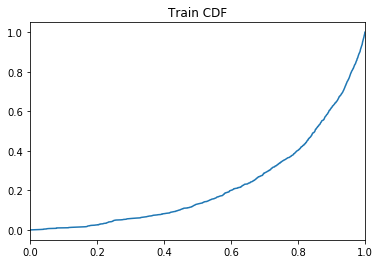

 20%|█▉        | 189081/946094 [31:08<363:19:31,  1.73s/it]

Training AUC at epoch 10: 0.22541518181818182
Validation AUC epoch 10: 0.2359710909090909
Training Accuracy at epoch 10: 70.07580310880829
Validation Accuracy epoch 10: 69.97548186528498


 25%|██▌       | 239049/946094 [36:45<1:21:32, 144.53it/s] 

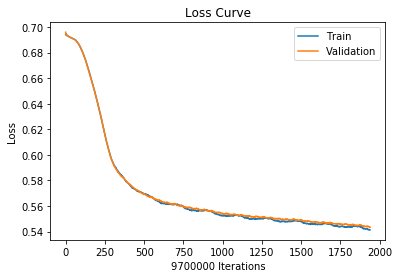

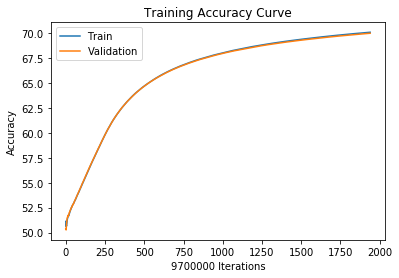

 25%|██▌       | 239049/946094 [37:00<1:21:32, 144.53it/s]

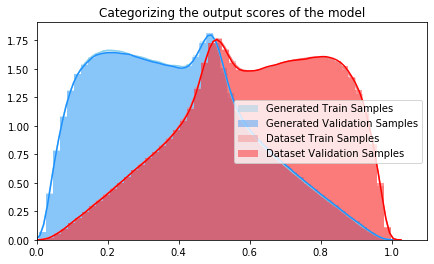

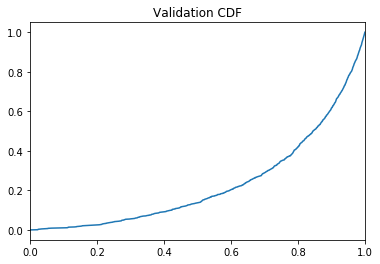

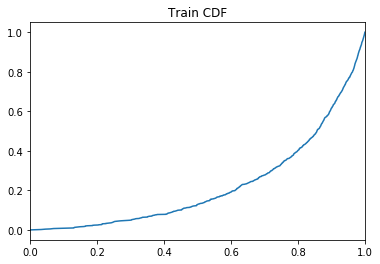

 25%|██▌       | 239079/946094 [39:15<563:10:38,  2.87s/it]

Training AUC at epoch 10: 0.22320163636363638
Validation AUC epoch 10: 0.23087327272727273
Training Accuracy at epoch 10: 70.08960824742267
Validation Accuracy epoch 10: 69.98851546391752


 31%|███       | 289052/946094 [44:56<1:13:09, 149.68it/s] 

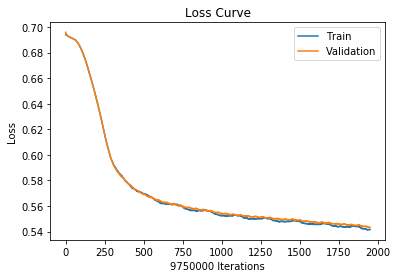

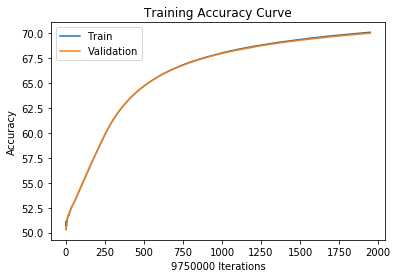

 31%|███       | 289052/946094 [45:10<1:13:09, 149.68it/s]

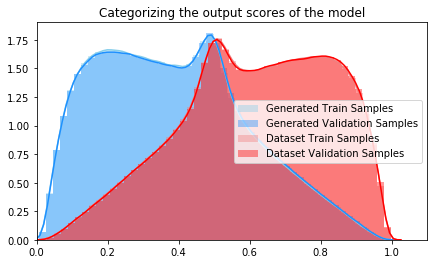

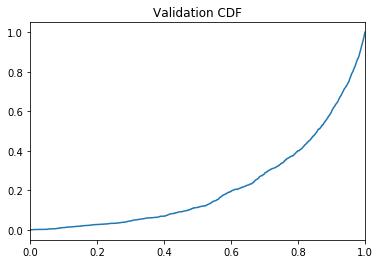

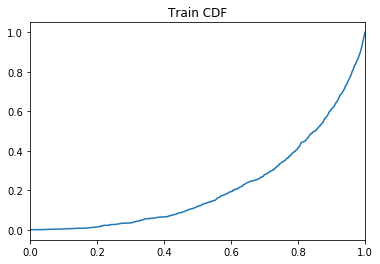

 31%|███       | 289060/946094 [47:23<1004:41:01,  5.50s/it]

Training AUC at epoch 10: 0.21841481818181818
Validation AUC epoch 10: 0.21810254545454547
Training Accuracy at epoch 10: 70.10244102564103
Validation Accuracy epoch 10: 70.00180512820513


 36%|███▌      | 339056/946094 [53:03<1:01:35, 164.27it/s]  

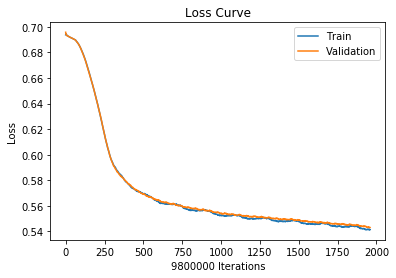

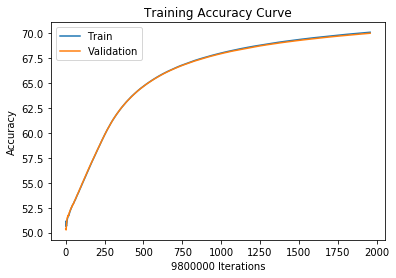

 36%|███▌      | 339056/946094 [53:20<1:01:35, 164.27it/s]

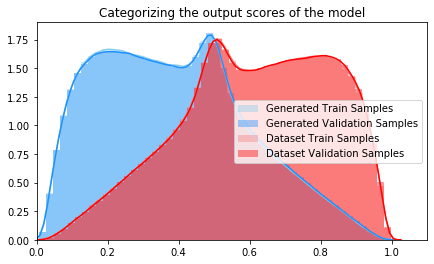

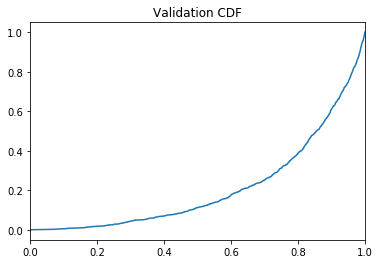

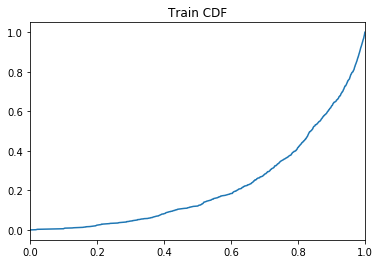

 36%|███▌      | 339082/946094 [55:31<1304:48:04,  7.74s/it]

Training AUC at epoch 10: 0.2241559090909091
Validation AUC epoch 10: 0.21150509090909092
Training Accuracy at epoch 10: 70.11629591836734
Validation Accuracy epoch 10: 70.01669387755102


 41%|████      | 389058/946094 [1:01:04<1:13:49, 125.77it/s]

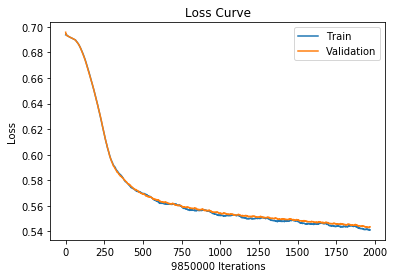

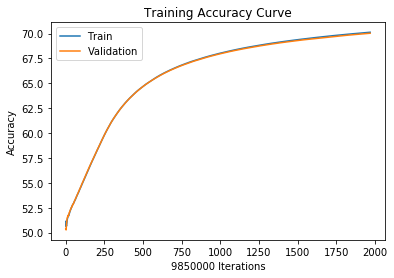

 41%|████      | 389058/946094 [1:01:20<1:13:49, 125.77it/s]

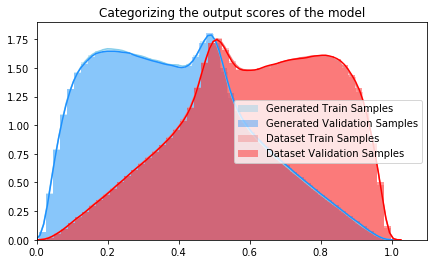

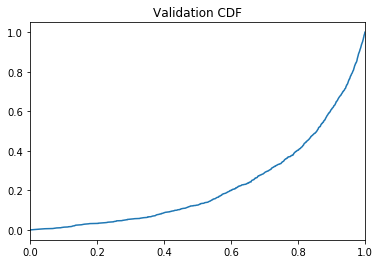

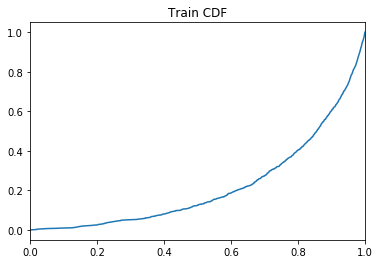

 41%|████      | 389079/946094 [1:03:35<2455:50:27, 15.87s/it]

Training AUC at epoch 10: 0.21995572727272727
Validation AUC epoch 10: 0.22550363636363635
Training Accuracy at epoch 10: 70.12957360406091
Validation Accuracy epoch 10: 70.02920812182741


 46%|████▋     | 439059/946094 [1:09:11<1:00:24, 139.90it/s]  

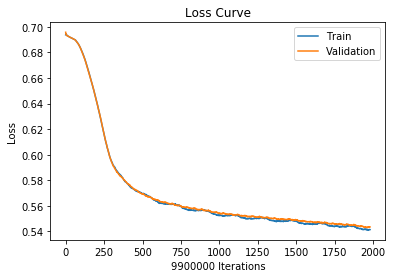

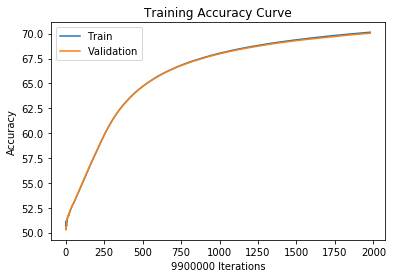

 46%|████▋     | 439059/946094 [1:09:21<1:00:24, 139.90it/s]

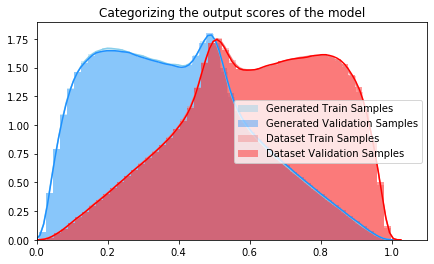

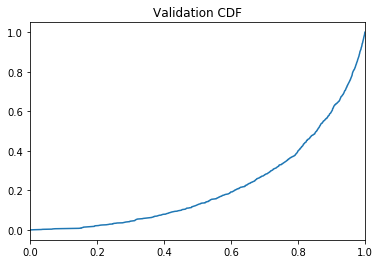

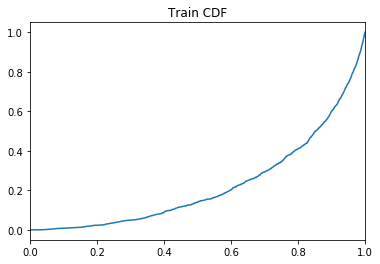

 46%|████▋     | 439077/946094 [1:11:41<4433:37:43, 31.48s/it]

Training AUC at epoch 10: 0.22519054545454545
Validation AUC epoch 10: 0.2186016363636364
Training Accuracy at epoch 10: 70.14157575757575
Validation Accuracy epoch 10: 70.04212121212122


 52%|█████▏    | 489054/946094 [1:16:54<46:32, 163.68it/s]    

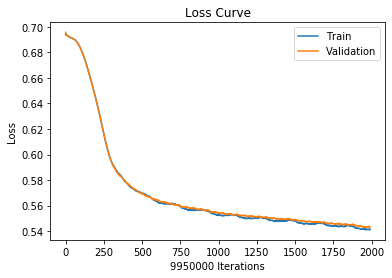

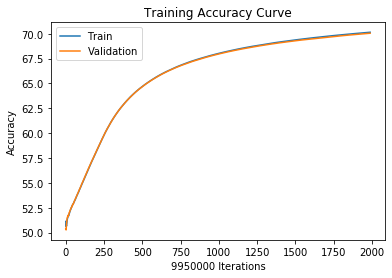

 52%|█████▏    | 489054/946094 [1:17:11<46:32, 163.68it/s]

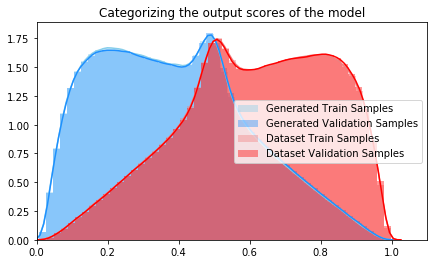

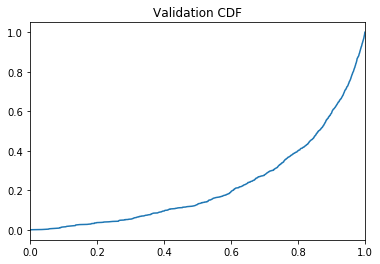

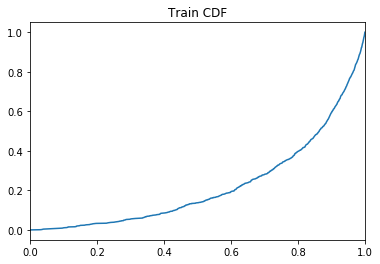

 52%|█████▏    | 489060/946094 [1:19:13<886:12:40,  6.98s/it]

Training AUC at epoch 10: 0.22257818181818181
Validation AUC epoch 10: 0.22360045454545457
Training Accuracy at epoch 10: 70.15470351758793
Validation Accuracy epoch 10: 70.05573869346733


 57%|█████▋    | 539037/946094 [1:24:08<41:10, 164.77it/s]   

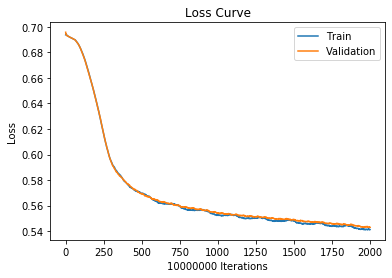

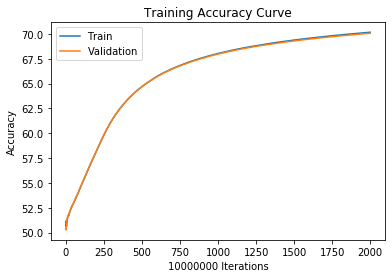

 57%|█████▋    | 539037/946094 [1:24:21<41:10, 164.77it/s]

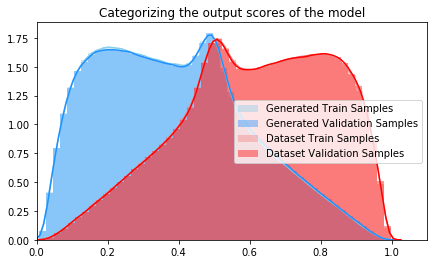

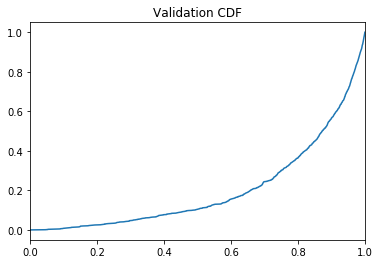

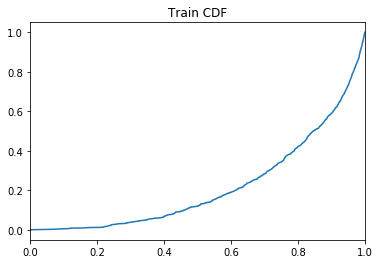

 57%|█████▋    | 539084/946094 [1:26:28<145:02:13,  1.28s/it]

Training AUC at epoch 10: 0.21793772727272726
Validation AUC epoch 10: 0.20155772727272725
Training Accuracy at epoch 10: 70.16831
Validation Accuracy epoch 10: 70.06871


 62%|██████▏   | 589049/946094 [1:31:27<41:19, 144.00it/s]   

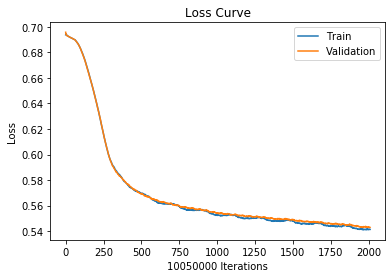

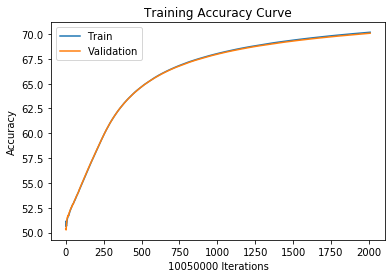

 62%|██████▏   | 589049/946094 [1:31:41<41:19, 144.00it/s]

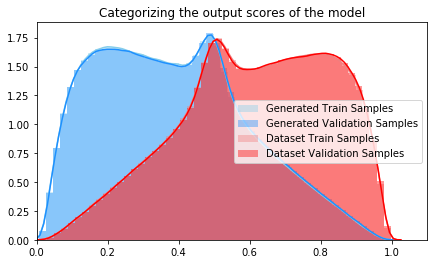

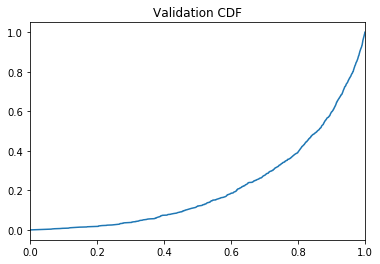

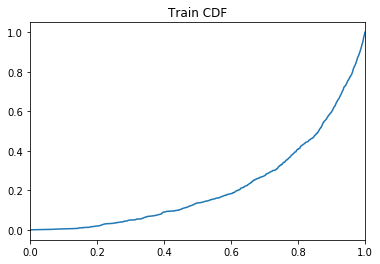

 62%|██████▏   | 589083/946094 [1:33:59<288:00:44,  2.90s/it]

Training AUC at epoch 10: 0.22018318181818183
Validation AUC epoch 10: 0.21630554545454544
Training Accuracy at epoch 10: 70.18020895522388
Validation Accuracy epoch 10: 70.08208955223881


 68%|██████▊   | 639037/946094 [1:39:04<35:39, 143.51it/s]   

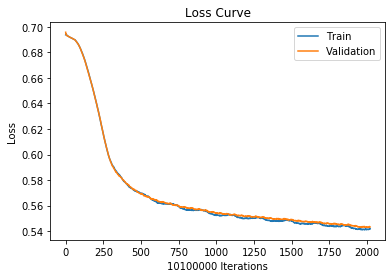

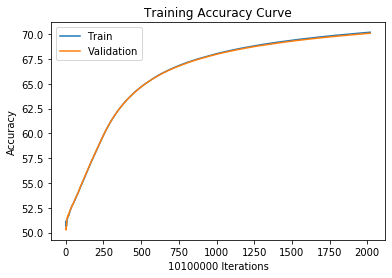

 68%|██████▊   | 639037/946094 [1:39:21<35:39, 143.51it/s]

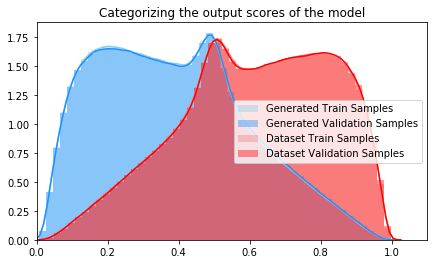

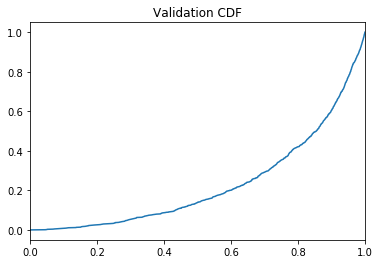

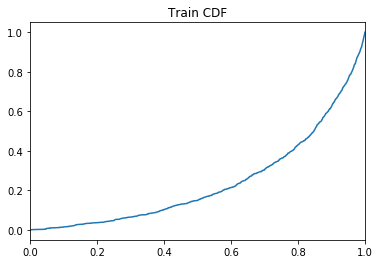

 68%|██████▊   | 639084/946094 [1:41:24<109:17:13,  1.28s/it]

Training AUC at epoch 10: 0.2395006363636364
Validation AUC epoch 10: 0.22837254545454544
Training Accuracy at epoch 10: 70.19284158415842
Validation Accuracy epoch 10: 70.0939702970297


 73%|███████▎  | 689051/946094 [1:46:29<23:38, 181.19it/s]   

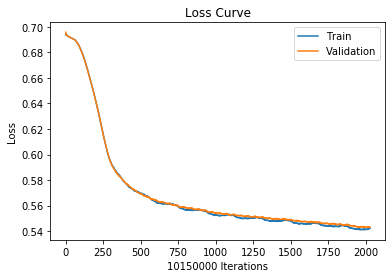

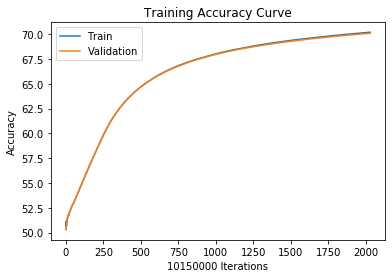

 73%|███████▎  | 689051/946094 [1:46:41<23:38, 181.19it/s]

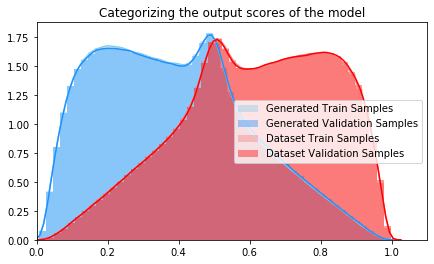

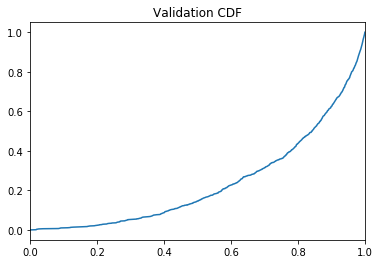

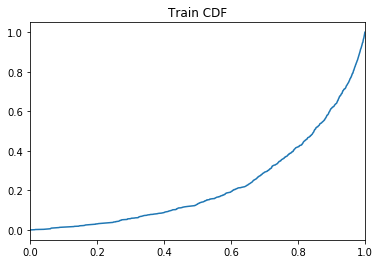

 73%|███████▎  | 689060/946094 [1:48:50<336:47:30,  4.72s/it]

Training AUC at epoch 10: 0.22745700000000002
Validation AUC epoch 10: 0.2364311818181818
Training Accuracy at epoch 10: 70.20578325123152
Validation Accuracy epoch 10: 70.10534975369458


 78%|███████▊  | 739035/946094 [1:53:53<19:14, 179.35it/s]   

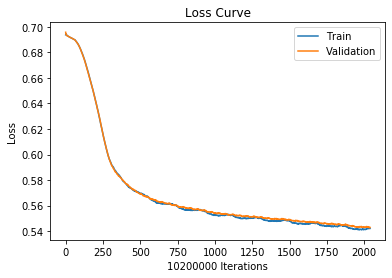

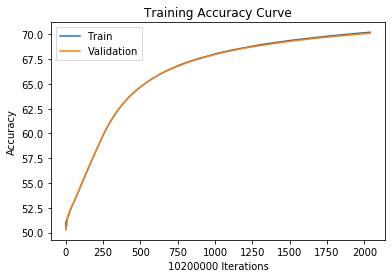

 78%|███████▊  | 739035/946094 [1:54:12<19:14, 179.35it/s]

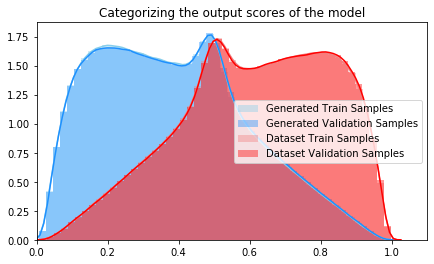

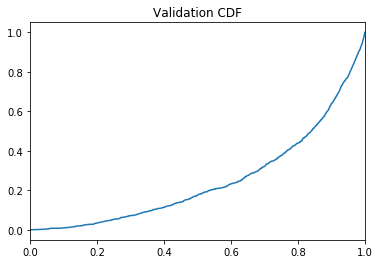

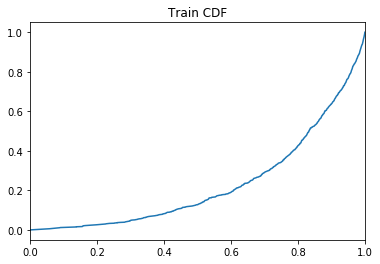

 78%|███████▊  | 739082/946094 [1:56:14<68:15:30,  1.19s/it]

Training AUC at epoch 10: 0.23014363636363638
Validation AUC epoch 10: 0.24917754545454546
Training Accuracy at epoch 10: 70.21840196078432
Validation Accuracy epoch 10: 70.11840196078431


 83%|████████▎ | 789049/946094 [2:01:31<18:55, 138.28it/s]  

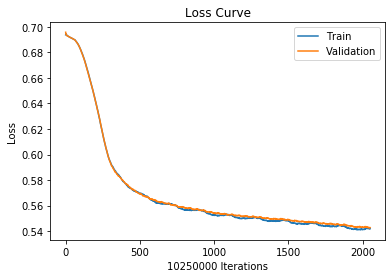

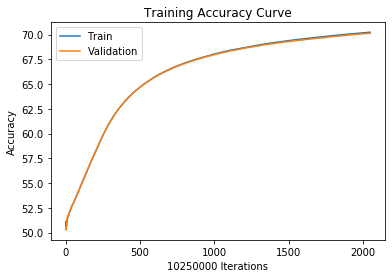

 83%|████████▎ | 789049/946094 [2:01:42<18:55, 138.28it/s]

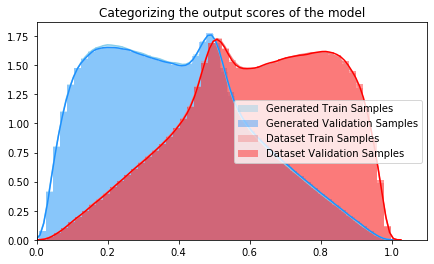

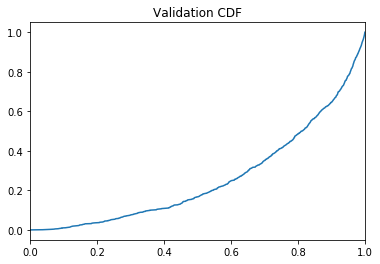

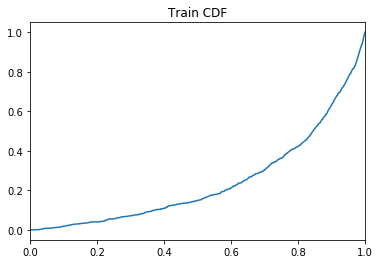

 83%|████████▎ | 789082/946094 [2:03:54<119:02:11,  2.73s/it]

Training AUC at epoch 10: 0.24193454545454546
Validation AUC epoch 10: 0.25879709090909087
Training Accuracy at epoch 10: 70.2311512195122
Validation Accuracy epoch 10: 70.13102439024391


 89%|████████▊ | 839053/946094 [2:09:19<10:51, 164.31it/s]   

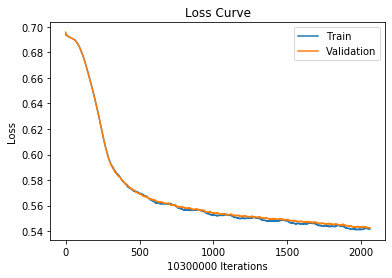

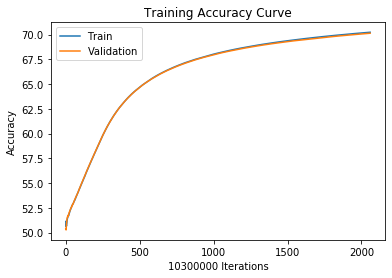

 89%|████████▊ | 839053/946094 [2:09:32<10:51, 164.31it/s]

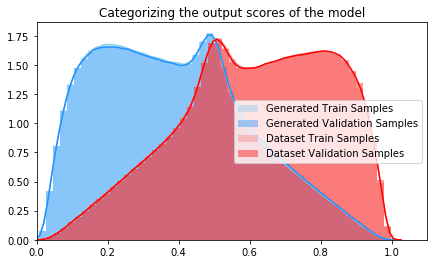

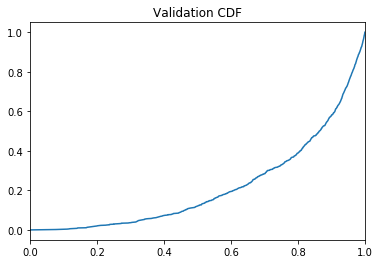

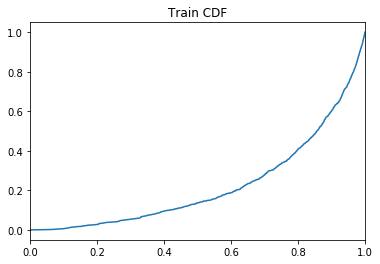

 89%|████████▊ | 839079/946094 [2:11:42<127:29:45,  4.29s/it]

Training AUC at epoch 10: 0.22302236363636363
Validation AUC epoch 10: 0.21519154545454547
Training Accuracy at epoch 10: 70.24322330097087
Validation Accuracy epoch 10: 70.1442427184466


 94%|█████████▍| 889042/946094 [2:17:15<06:58, 136.41it/s]   

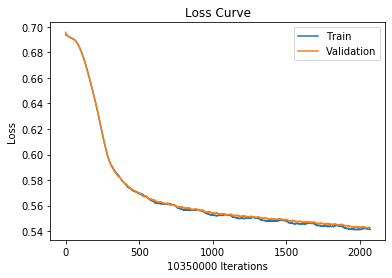

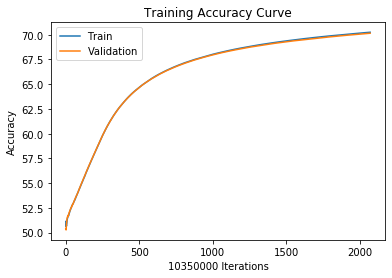

 94%|█████████▍| 889042/946094 [2:17:32<06:58, 136.41it/s]

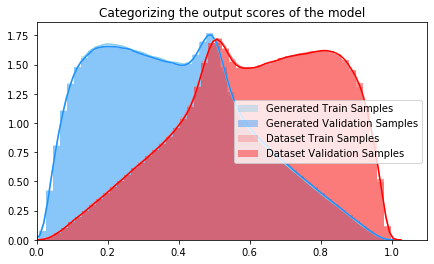

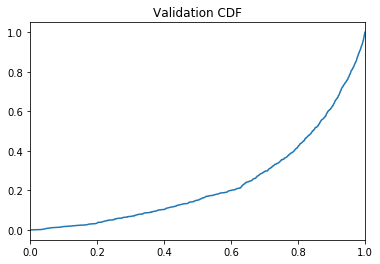

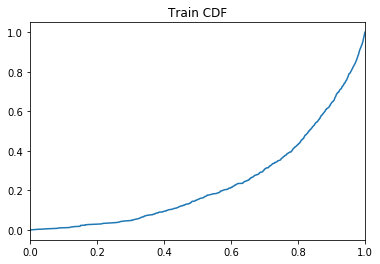

 94%|█████████▍| 889060/946094 [2:19:47<40:15:08,  2.54s/it]

Training AUC at epoch 10: 0.2383597272727273
Validation AUC epoch 10: 0.23661327272727273
Training Accuracy at epoch 10: 70.25609661835749
Validation Accuracy epoch 10: 70.15606763285024


 99%|█████████▉| 939055/946094 [2:25:06<00:41, 168.89it/s]  

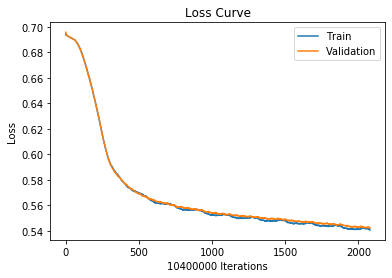

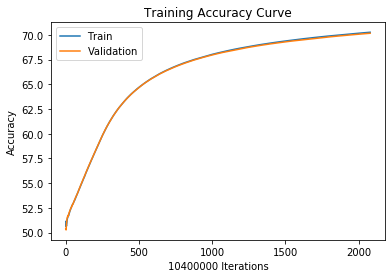

 99%|█████████▉| 939055/946094 [2:25:23<00:41, 168.89it/s]

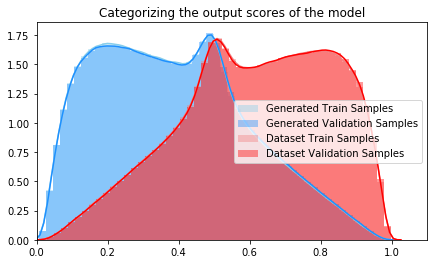

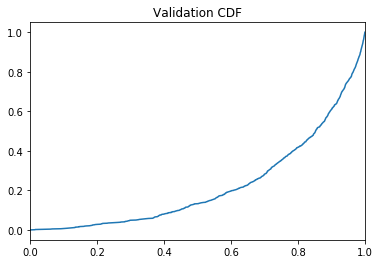

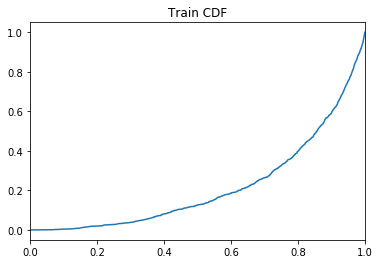

 99%|█████████▉| 939080/946094 [2:27:39<12:30:05,  6.42s/it]

Training AUC at epoch 10: 0.21600309090909092
Validation AUC epoch 10: 0.2231398181818182
Training Accuracy at epoch 10: 70.26875
Validation Accuracy epoch 10: 70.16647115384616


  0%|          | 16/946094 [00:00<1:39:22, 158.67it/s]

Saving to:  model_checkpoints/binary/OHBioNet/07062020.pth
Starting epoch: 11  with learning rate:  [0.008100000000000001]


  5%|▍         | 42956/946094 [04:53<2:06:47, 118.71it/s]

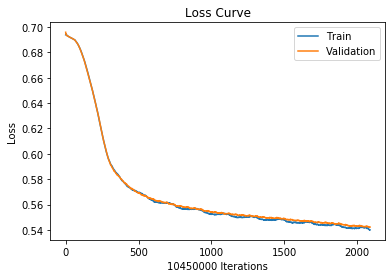

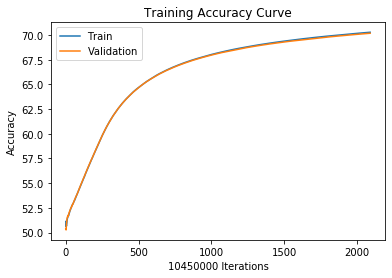

  5%|▍         | 42956/946094 [05:10<2:06:47, 118.71it/s]

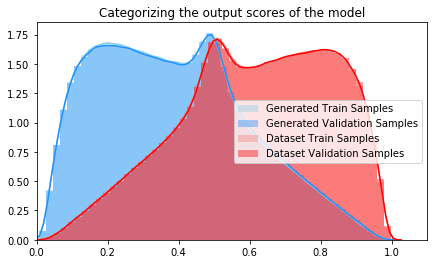

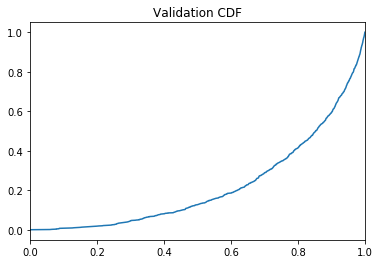

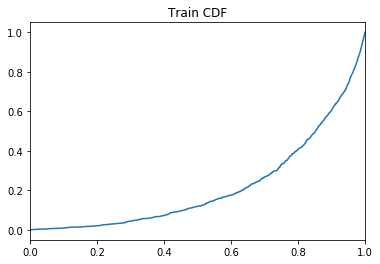

  5%|▍         | 42984/946094 [07:23<791:10:00,  3.15s/it] 

Training AUC at epoch 11: 0.21662036363636364
Validation AUC epoch 11: 0.220765
Training Accuracy at epoch 11: 70.28045933014354
Validation Accuracy epoch 11: 70.17847846889953


 10%|▉         | 92956/946094 [13:13<1:45:06, 135.28it/s] 

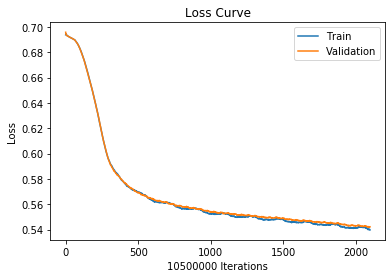

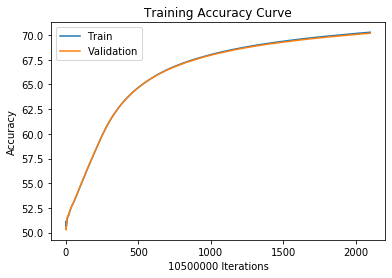

 10%|▉         | 92956/946094 [13:30<1:45:06, 135.28it/s]

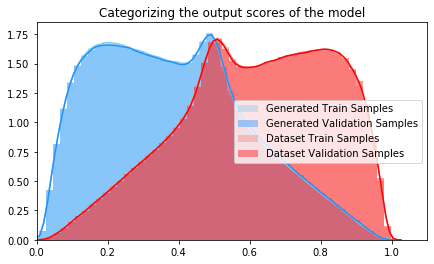

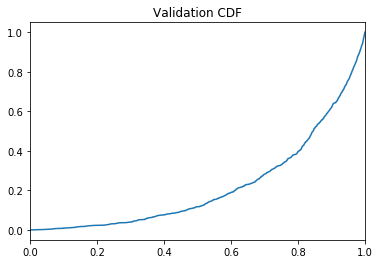

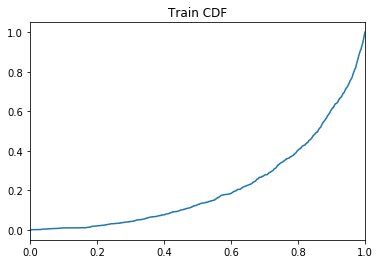

 10%|▉         | 92986/946094 [15:53<794:55:34,  3.35s/it] 

Training AUC at epoch 11: 0.21780354545454544
Validation AUC epoch 11: 0.22026381818181814
Training Accuracy at epoch 11: 70.29278095238095
Validation Accuracy epoch 11: 70.1913619047619


 15%|█▌        | 142952/946094 [21:43<1:26:22, 154.98it/s]

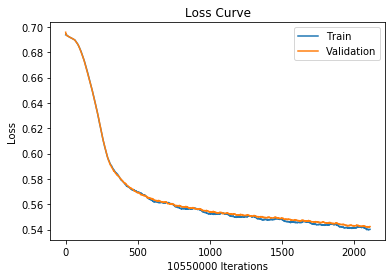

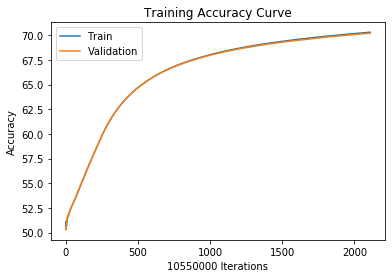

 15%|█▌        | 142952/946094 [22:00<1:26:22, 154.98it/s]

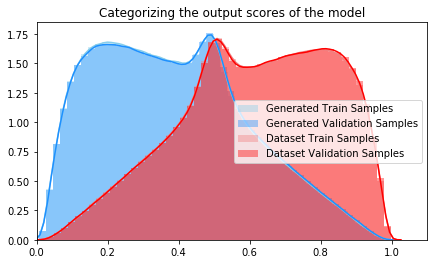

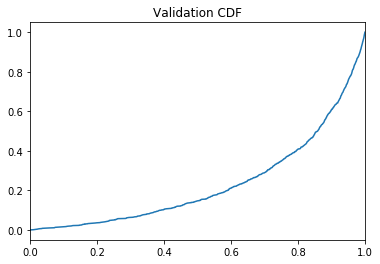

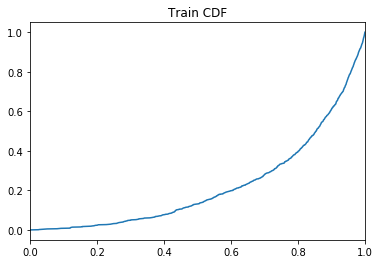

 15%|█▌        | 142966/946094 [24:15<724:46:15,  3.25s/it]

Training AUC at epoch 11: 0.222644
Validation AUC epoch 11: 0.23237809090909092
Training Accuracy at epoch 11: 70.30389573459716
Validation Accuracy epoch 11: 70.2025971563981


 20%|██        | 192948/946094 [30:03<1:25:24, 146.97it/s] 

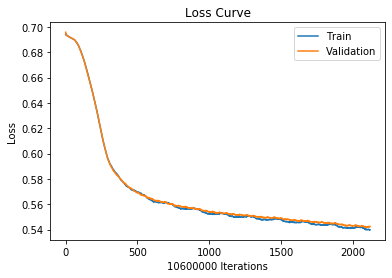

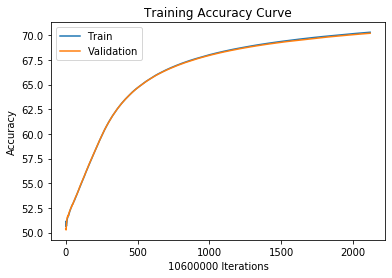

 20%|██        | 192948/946094 [30:20<1:25:24, 146.97it/s]

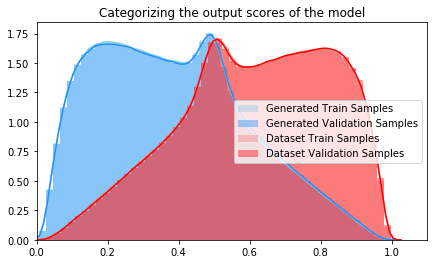

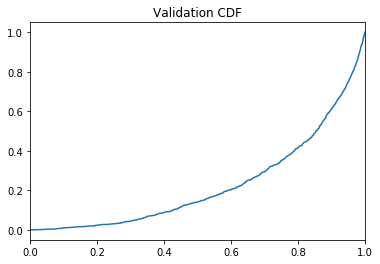

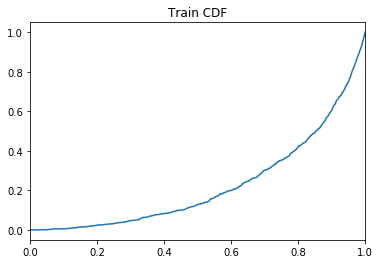

 20%|██        | 192984/946094 [32:39<382:31:04,  1.83s/it]

Training AUC at epoch 11: 0.22477309090909092
Validation AUC epoch 11: 0.22715409090909092
Training Accuracy at epoch 11: 70.31601886792453
Validation Accuracy epoch 11: 70.21327358490566


 26%|██▌       | 242956/946094 [38:27<1:35:32, 122.65it/s] 

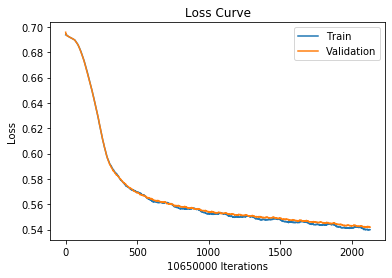

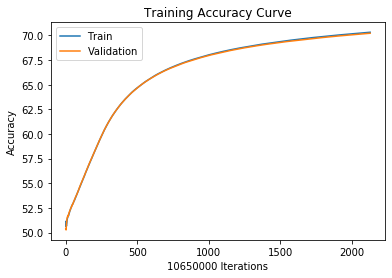

 26%|██▌       | 242956/946094 [38:40<1:35:32, 122.65it/s]

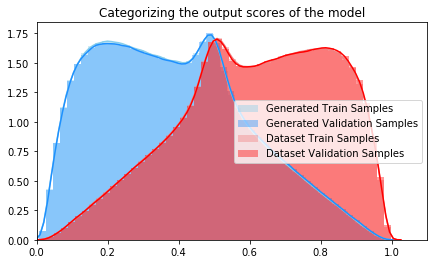

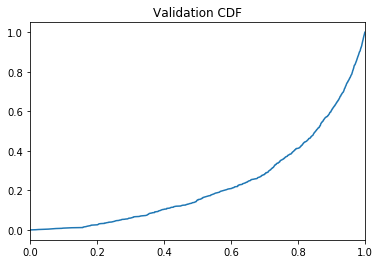

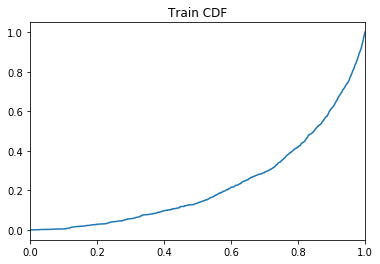

 26%|██▌       | 242985/946094 [41:02<637:33:41,  3.26s/it]

Training AUC at epoch 11: 0.2310190909090909
Validation AUC epoch 11: 0.23099209090909092
Training Accuracy at epoch 11: 70.32748356807512
Validation Accuracy epoch 11: 70.22496713615024


 31%|███       | 292950/946094 [46:48<1:25:30, 127.30it/s] 

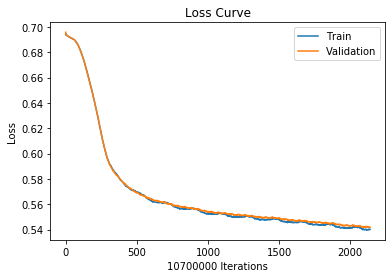

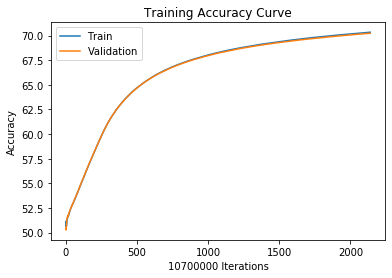

 31%|███       | 292950/946094 [47:00<1:25:30, 127.30it/s]

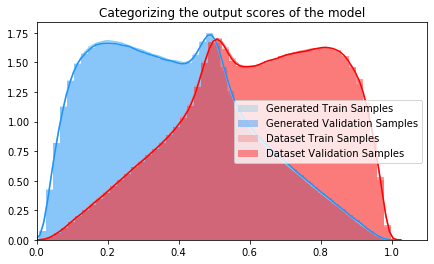

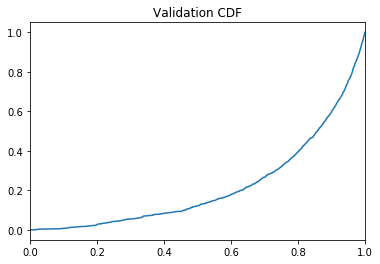

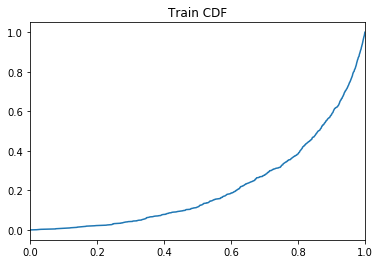

 31%|███       | 292987/946094 [49:24<371:14:31,  2.05s/it]

Training AUC at epoch 11: 0.21526336363636364
Validation AUC epoch 11: 0.21796954545454544
Training Accuracy at epoch 11: 70.33884112149532
Validation Accuracy epoch 11: 70.23655140186916


 36%|███▌      | 342949/946094 [55:14<1:18:46, 127.62it/s] 

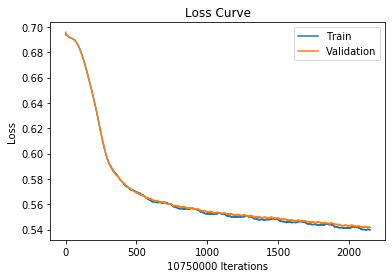

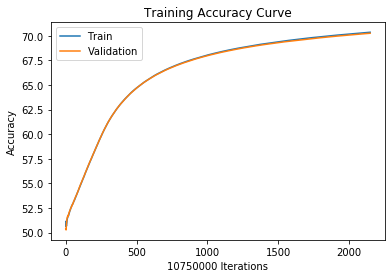

 36%|███▌      | 342949/946094 [55:31<1:18:46, 127.62it/s]

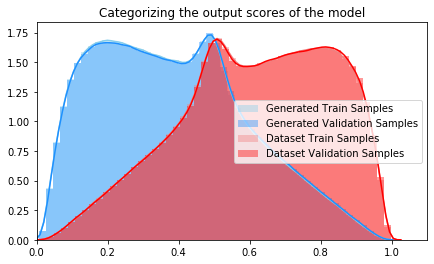

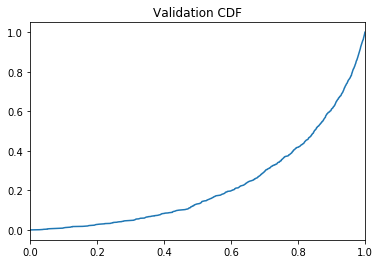

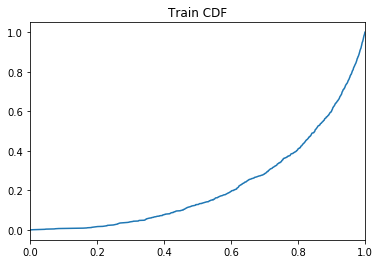

 36%|███▋      | 342966/946094 [57:49<459:09:55,  2.74s/it]

Training AUC at epoch 11: 0.2219928181818182
Validation AUC epoch 11: 0.22645681818181818
Training Accuracy at epoch 11: 70.35058604651162
Validation Accuracy epoch 11: 70.24918139534884


 42%|████▏     | 392953/946094 [1:03:35<52:59, 173.96it/s]  

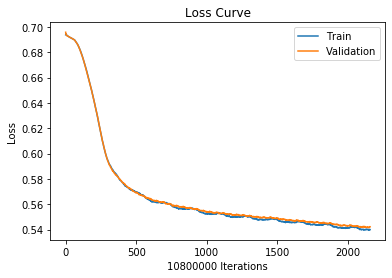

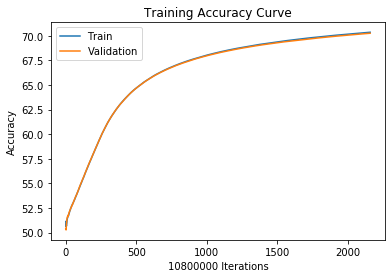

 42%|████▏     | 392953/946094 [1:03:51<52:59, 173.96it/s]

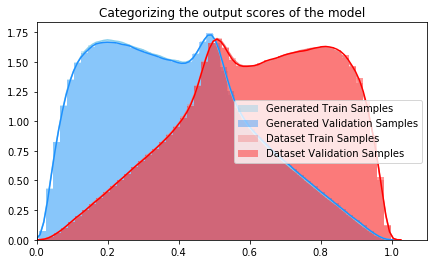

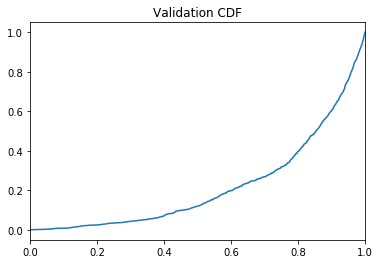

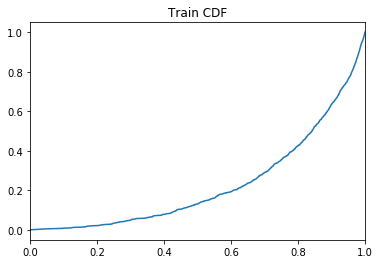

 42%|████▏     | 392987/946094 [1:06:11<387:20:59,  2.52s/it]

Training AUC at epoch 11: 0.22839472727272728
Validation AUC epoch 11: 0.21937981818181818
Training Accuracy at epoch 11: 70.36143518518519
Validation Accuracy epoch 11: 70.25967592592593


 47%|████▋     | 442963/946094 [1:11:50<1:06:04, 126.92it/s] 

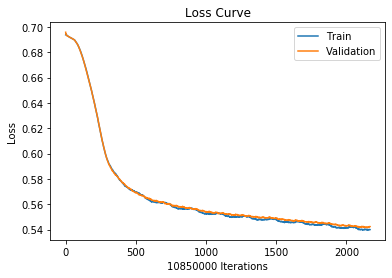

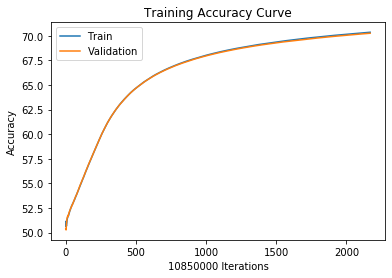

 47%|████▋     | 442963/946094 [1:12:01<1:06:04, 126.92it/s]

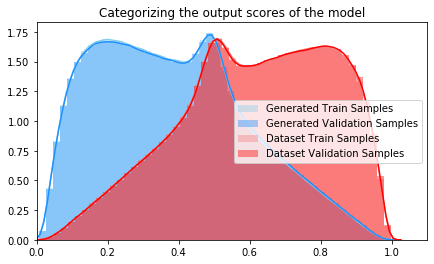

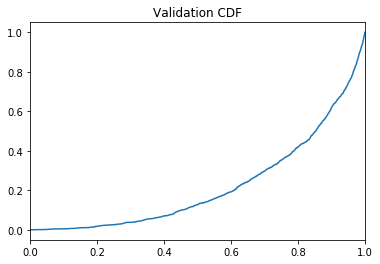

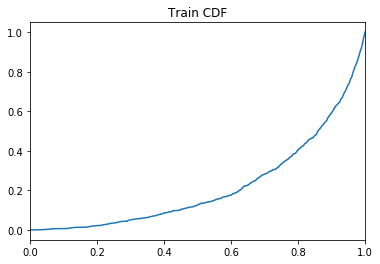

 47%|████▋     | 442987/946094 [1:14:27<1533:04:27, 10.97s/it]

Training AUC at epoch 11: 0.21767963636363638
Validation AUC epoch 11: 0.22166881818181816
Training Accuracy at epoch 11: 70.37239631336405
Validation Accuracy epoch 11: 70.26998156682028


 52%|█████▏    | 492951/946094 [1:20:06<57:03, 132.37it/s]    

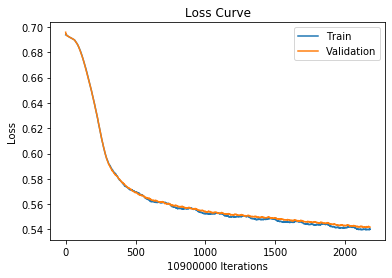

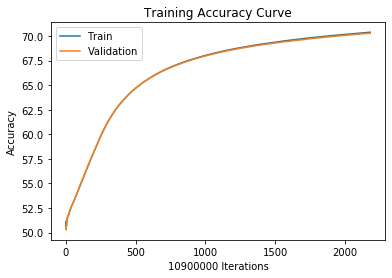

 52%|█████▏    | 492951/946094 [1:20:21<57:03, 132.37it/s]

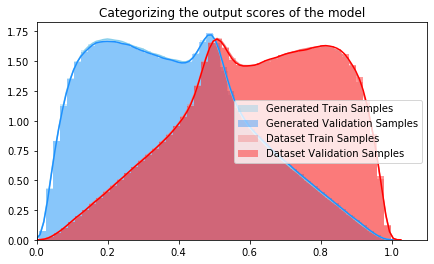

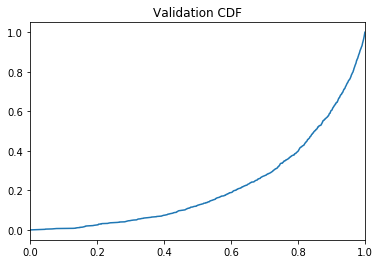

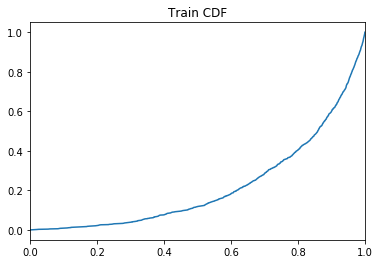

 52%|█████▏    | 492985/946094 [1:22:42<275:18:59,  2.19s/it]

Training AUC at epoch 11: 0.21820654545454546
Validation AUC epoch 11: 0.2197783636363636
Training Accuracy at epoch 11: 70.38359633027522
Validation Accuracy epoch 11: 70.28216513761468


 57%|█████▋    | 542949/946094 [1:28:29<44:10, 152.10it/s]   

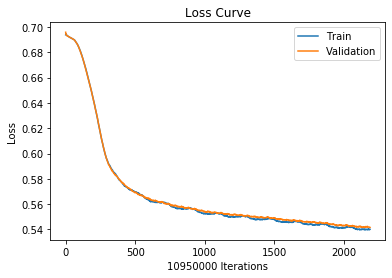

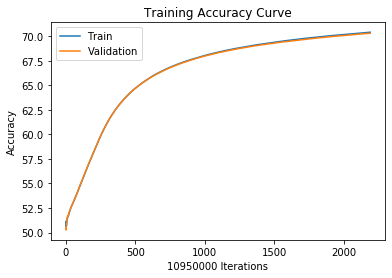

 57%|█████▋    | 542949/946094 [1:28:42<44:10, 152.10it/s]

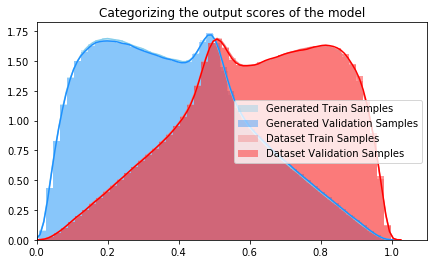

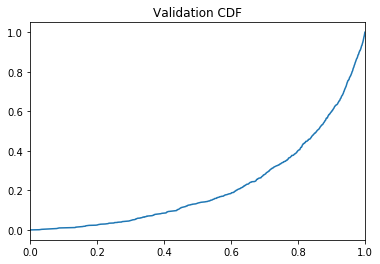

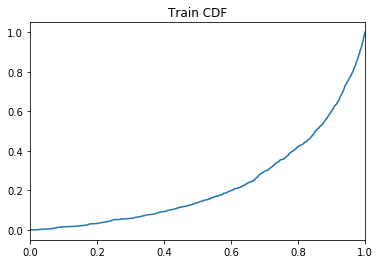

 57%|█████▋    | 542966/946094 [1:31:07<313:28:29,  2.80s/it]

Training AUC at epoch 11: 0.22910245454545458
Validation AUC epoch 11: 0.22209463636363636
Training Accuracy at epoch 11: 70.39591780821918
Validation Accuracy epoch 11: 70.293899543379


 63%|██████▎   | 592965/946094 [1:36:56<36:46, 160.02it/s]   

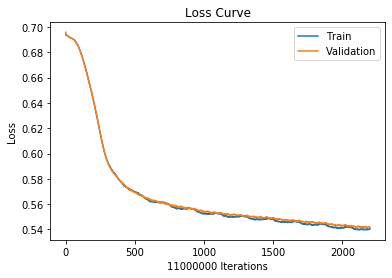

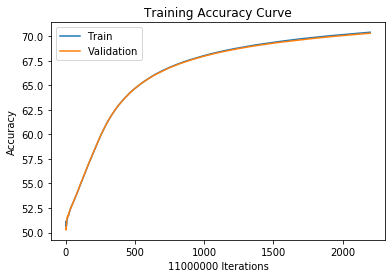

 63%|██████▎   | 592965/946094 [1:37:12<36:46, 160.02it/s]

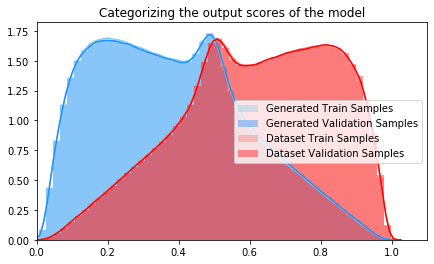

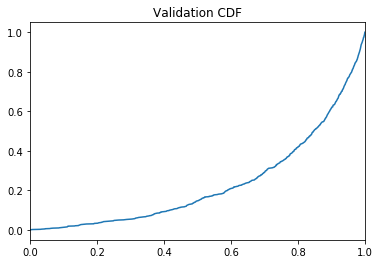

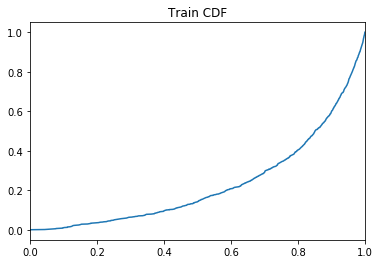

 63%|██████▎   | 592987/946094 [1:39:35<3269:14:47, 33.33s/it]

Training AUC at epoch 11: 0.23022209090909093
Validation AUC epoch 11: 0.23185236363636363
Training Accuracy at epoch 11: 70.40633636363637
Validation Accuracy epoch 11: 70.30528181818181


 68%|██████▊   | 642964/946094 [1:45:21<45:04, 112.07it/s]    

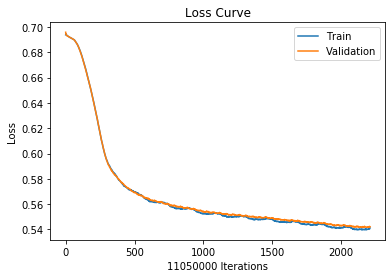

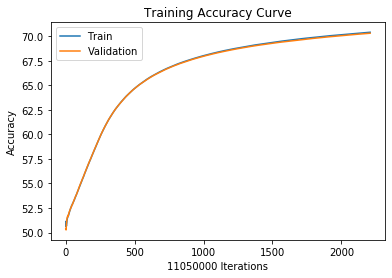

 68%|██████▊   | 642964/946094 [1:45:32<45:04, 112.07it/s]

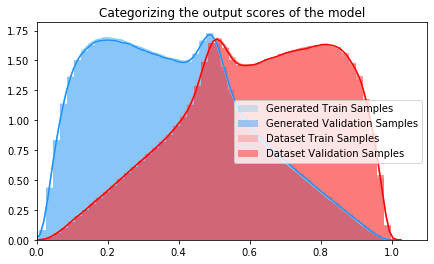

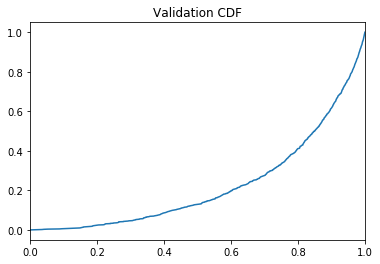

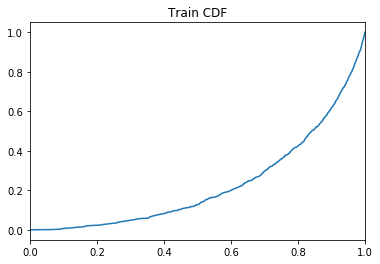

 68%|██████▊   | 642985/946094 [1:47:59<1399:57:29, 16.63s/it]

Training AUC at epoch 11: 0.228352
Validation AUC epoch 11: 0.22415772727272726
Training Accuracy at epoch 11: 70.41628054298643
Validation Accuracy epoch 11: 70.31609954751131


 73%|███████▎  | 692960/946094 [1:53:47<31:10, 135.31it/s]    

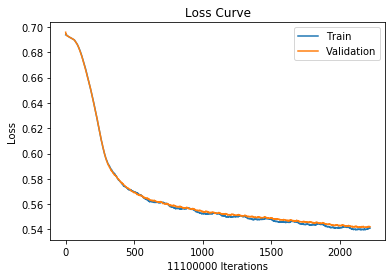

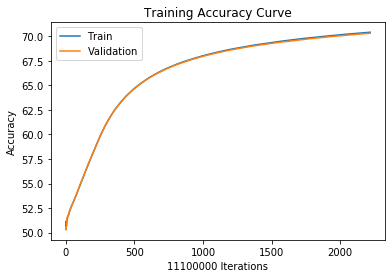

 73%|███████▎  | 692960/946094 [1:54:02<31:10, 135.31it/s]

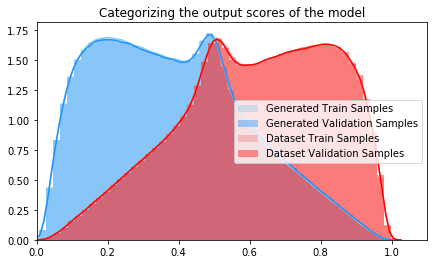

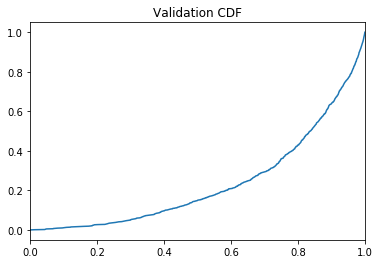

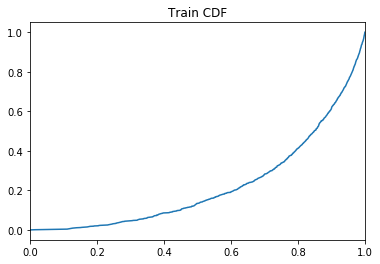

 73%|███████▎  | 692984/946094 [1:56:24<387:21:46,  5.51s/it]

Training AUC at epoch 11: 0.22323790909090907
Validation AUC epoch 11: 0.2350502727272727
Training Accuracy at epoch 11: 70.42811711711711
Validation Accuracy epoch 11: 70.32606306306306


 79%|███████▊  | 742958/946094 [2:02:16<23:26, 144.44it/s]   

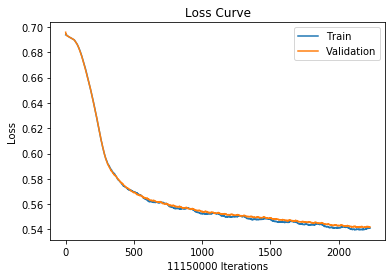

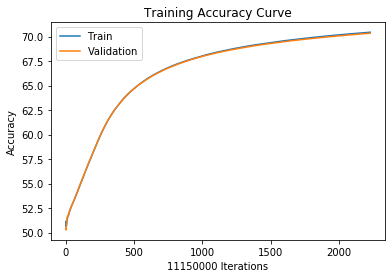

 79%|███████▊  | 742958/946094 [2:02:33<23:26, 144.44it/s]

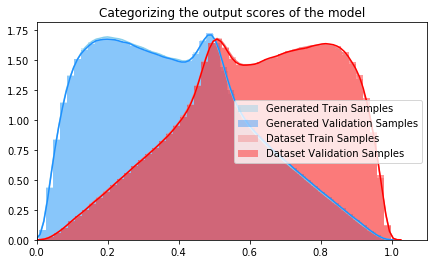

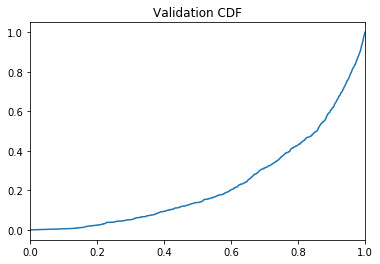

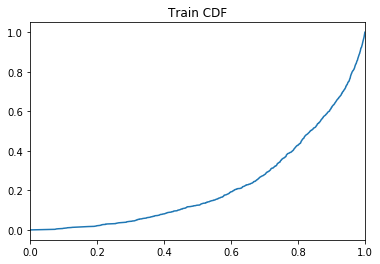

 79%|███████▊  | 742966/946094 [2:04:56<338:27:36,  6.00s/it]

Training AUC at epoch 11: 0.22437881818181818
Validation AUC epoch 11: 0.231461
Training Accuracy at epoch 11: 70.43818834080717
Validation Accuracy epoch 11: 70.33697757847534


 82%|████████▏ | 779170/946094 [2:09:14<20:33, 135.29it/s]   

In [ ]:
model = OHBioNet()
model_name = model.name
model_id = "07062020"
model.to(device)
checkpoint = None
save_path = 'model_checkpoints/binary/%s/%s.pth' % (model_name, model_id)
NUM_EPOCHS = 50
BATCH_SIZE = 64
cdf=False
if cdf:
   # For the CDF functions, we need to generate a dataset of new examples
    S_new = GeneratedDataset(10*m) 
gamma = 1e-2
classifier(model, binary_train, binary_val, gamma, model_id, NUM_EPOCHS, BATCH_SIZE, model.single_alphabet, checkpoint, save_path, cdf=cdf)